In [1]:
import numpy as np
import math
import matplotlib.pyplot as plt
from collections import OrderedDict
# Local file
# import sys
# sys.path.append(r"C:\Users\kenny\OneDrive - purdue.edu\Documents\Kenny's File\Transportation Literature\Fall 2024\CE 597 SET\Project")
# sys.path.append(r"C:\Users\wijayak\OneDrive - purdue.edu\Documents\Kenny's File\Transportation Literature\Fall 2024\CE 597 SET\Project")
# import NREL_workplace_arrival as arr

#### Discrete Arrival Time

In [2]:
from scipy.stats import gaussian_kde
from scipy.integrate import cumtrapz
from scipy.interpolate import interp1d


def NREL_workplace_arrival(seed = 4, samples = 55):

    np.random.seed(seed)

    # Hourly average arrival rates
    hourly_rates = np.array([0., 0., 0., 0., 1., 1., 3., 10., 14., 5., 2., 2., 4.,
                             3., 2., 1., 1., 1., 1., 1., 1., 1., 0., 1.])
    
    # Create minute-based data
    minute_data = []
    for hour, rate in enumerate(hourly_rates):
        arrivals = int(rate * 60)  # Approximate arrivals for the hour, scaled to minutes
        minute_data.extend(np.random.uniform(low=hour*60, high=(hour+1)*60, size=arrivals))
    
    minute_data = np.array(minute_data)
    
    # Perform Kernel Density Estimation (KDE)
    kde = gaussian_kde(minute_data)
    x_grid = np.linspace(0, 24*60, 1440)  # 24 hours in minute units
    pdf_values = kde(x_grid)
    
    # Compute the Cumulative Distribution Function (CDF)
    cdf_values = cumtrapz(pdf_values, x_grid, initial=0)
    cdf_values /= cdf_values[-1]  # Normalize to ensure the CDF ends at 1
    
    # Interpolate the inverse CDF
    inverse_cdf = interp1d(cdf_values, x_grid, bounds_error=False, fill_value=(x_grid[0], x_grid[-1]))
    
    # Simulate arrival times as a random process
    num_samples = samples  # Number of arrivals to simulate
    random_probabilities = np.random.uniform(0, 1, num_samples)
    arrival_times = inverse_cdf(random_probabilities)
    
    # Align arrival times with discrete time steps
    time_step = 1  # Simulation time step in minutes
    discrete_arrival_counts = np.zeros(int(24*60/time_step))  # 24 hours in minute steps
    
    for t in arrival_times:
        index = int(t // time_step)
        discrete_arrival_counts[index] += 1

    # plt.figure()
    # Set publication-quality parameters
    plt.rcParams.update({
        'font.family': 'serif',
        'font.serif': ['Times New Roman'],
        'font.size': 10,
        'axes.labelsize': 11,
        'axes.titlesize': 12,
        'xtick.labelsize': 10,
        'ytick.labelsize': 10,
        'legend.fontsize': 9,
        'figure.figsize': (7, 5),
        'figure.dpi': 300,
        'savefig.dpi': 600,
        'savefig.bbox': 'tight',
        'axes.linewidth': 1.0,
        'grid.alpha': 0.3,
        'lines.linewidth': 1.5,
        'lines.markersize': 4
    })
    plt.plot(np.arange(len(discrete_arrival_counts)) * time_step, discrete_arrival_counts, label="Discrete Arrival Counts")
    plt.xlabel("Time-of-day (Hours)")
    plt.xticks(np.arange(0, 24*60+1, 60), labels=[str(i) for i in range(25)])
    plt.ylabel("Number of EV Arrivals")
    plt.yticks(np.arange(0, max(discrete_arrival_counts)+1, 1))
    plt.title("Simulated Arrival Process")
    plt.legend()
    # plt.grid(True)
    # plt.savefig(r"C:\Users\kenny\OneDrive - purdue.edu\Documents\Kenny's File\Transportation Literature\Fall 2024\CE 597 SET\Project\Workplace charging data\arrival_kde.png",
    #            dpi = 900)
    # plt.savefig(r"C:\Users\kenny\OneDrive - purdue.edu\Documents\Kenny's File\Transportation Literature\Fall 2025\ASPIRE\arrival_kde.png",
    #            dpi = 700)
#     plt.savefig(r"C:\Users\kenny\OneDrive - purdue.edu\Documents\Kenny's File\Transportation Literature\Fall 2024\CE 597 SET\Project\Journal Submission\Figures\arrival_kde.png",
#                dpi = 700)
    plt.show()
    
    return discrete_arrival_counts

### Functions

In [3]:
# Current SoC given charging duration and initial SoC
def fast_SoCtarget(SoCinit, t, tau):
    return (SoCinit/100 + (1-SoCinit/100)*(1-math.exp(-t/tau)))*100

In [4]:
# Amount of time needed to reach certain target SoC
def fast_charge_time(SoCtarget, SoCinit, tau):
    return -tau*math.log(1-(SoCtarget-SoCinit)/(100-SoCinit),math.e)

In [5]:
# Rate at which EV begin service
def begin_service(sigma, C, St, Wt, K=1e-5):
    return sigma*(C-St)*Wt/(Wt+K)

In [6]:
# Rate at which cars complete service (assuming more than 1 charging piles)
def CSR(mu_avg, St):
    return mu_avg*St

In [7]:
# dW(t)/dt
def queue_dynamics(lambda_t, lambda_st):
    return lambda_t - lambda_st

In [8]:
# dS(t)/dt
def service_dynamics(lambda_st, CSR_t):
    return lambda_st - CSR_t

In [9]:
# Average waiting time
def avg_wait(Wt, lambda_st, K=1e-5):
    return Wt/(lambda_st+K)

In [10]:
# Total waiting time
def total_wait(Wt, avg_wait):
    return Wt*avg_wait

In [11]:
def total_sc(beta, total_wait):
    return beta*total_wait

In [12]:
# kwhbased need kwh_cost
# time_based need time_cost and tau
# fixed penalty need fix_pen_cost
# time penalty need time_cost_pen
def payoff(SoCtarget, SoCinit, alpha, EVcap, dist_per_kwh, inconv_time, vot, delta, tau, 
           kwhbased = False, timebased = False, flatbased = False, fixed_penalty = False, time_penalty = False, 
           social_penalty = False, congested_penalty = False, cashback = False, inefficiency_penalty = False,
           kwh_cost = 0, time_cost = 0, flat_cost = 0, S=0, C=8, mu_avg=0, mu_c=0,
           fix_pen = 0, time_cost_pen = 0, social_pen = 0, coop_prop = 0, W = 0, SC = 0, SC_min = 0, SC_max = 0,
           social_penalty_type = 0, congested_pen = 0, percent_cashback = 0, inefficiency_pen = 0):
    
    H = - inconv_time*vot
    G = 0
    if kwhbased == True:
       H -= (SoCtarget-SoCinit)/100*EVcap*kwh_cost 
       G -= (100-SoCinit)/100*EVcap*kwh_cost
    
    if timebased == True:
        H -= fast_charge_time(SoCtarget, SoCinit, tau)*time_cost
        G -= fast_charge_time(99, SoCinit, tau)*time_cost

    if flatbased == True:
        H -= flat_cost
        G -= flat_cost

        
    if delta > 0:
        if fixed_penalty == True:
            G -= fix_pen
        if time_penalty == True:
            G -= delta*time_cost_pen
        if social_penalty == True:
            if social_penalty_type == 1:
                G -= social_pen
            if social_penalty_type == 2:
                G -= social_pen*coop_prop
            if social_penalty_type == 3:
                G -= social_pen*W
            if social_penalty_type == 4:
                G -= social_pen*W*(1+coop_prop)
            if social_penalty_type == 5:
                G -= social_pen*(1+W)*(1+coop_prop)
            if social_penalty_type == 6:
                if SC > 0:
                    G -= (SC - SC_min)/(SC_max - SC_min)*social_pen
                else:
                    G -= 0
        if congested_penalty == True:
            if S/C >= 0.5:
                G -= delta*(congested_pen + congested_pen*(S/C - 0.5)*2)

        if inefficiency_penalty == True:
            if mu_avg/mu_c <= 0.5:
                G -= inefficiency_pen*(1-mu_avg/mu_c)*2

    if cashback == True:
        H += percent_cashback/100*((SoCtarget-SoCinit)/100*EVcap*kwh_cost)
            
    payoff_coop = ((SoCtarget-SoCinit)/100*EVcap*dist_per_kwh)*alpha + H
    payoff_def = ((100-SoCinit)/100*EVcap*dist_per_kwh)*alpha + G
    
    return payoff_coop,payoff_def

In [13]:
def average_payoff(x, pi_c, pi_d):
    return x*pi_c + (1-x)*pi_d

In [14]:
def dxdt (x, pi_c, phi):
    return x*(pi_c-phi)

In [15]:
fast_charge_time(35, 20, 30)

6.229180943347335

In [16]:
fast_charge_time(50, 20, 30)

14.100108877372067

In [17]:
fast_charge_time(65, 20, 30)

24.800357195534037

In [18]:
fast_charge_time(80, 20, 30)

41.58883083359672

In [19]:
fast_charge_time(90, 20, 30)

62.383246250395075

In [20]:
fast_charge_time(95, 20, 30)

83.17766166719343

### Testing Parameters

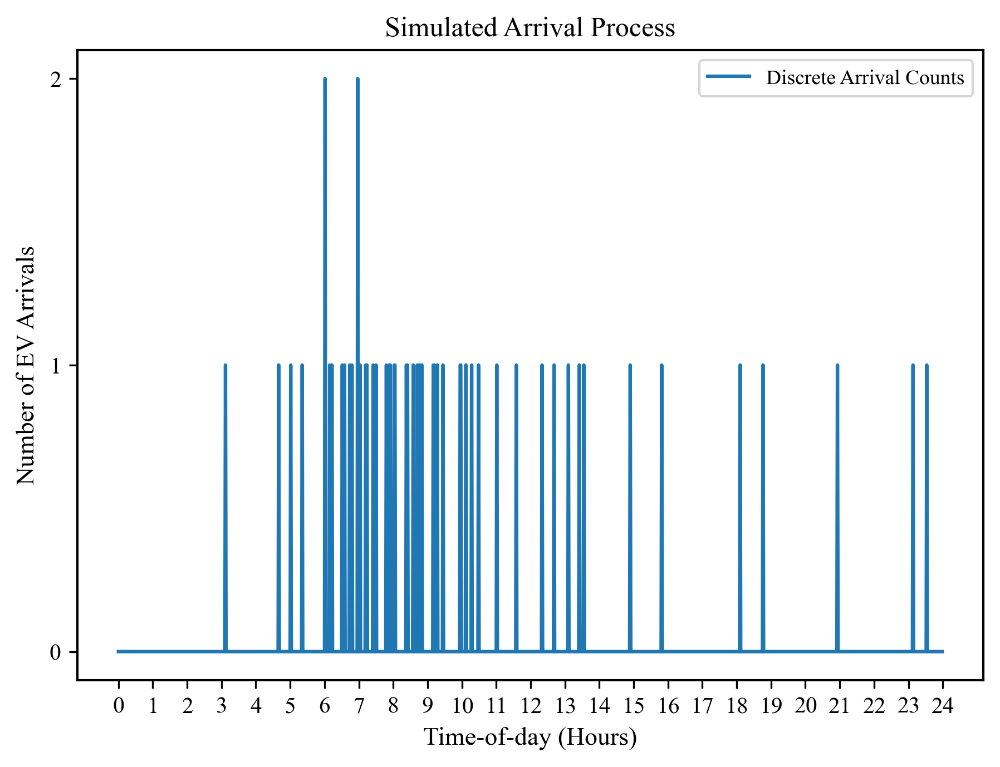

In [21]:
# State vars
Wt = 7 # number of EV waiting in the queue at time t -> initial value
St = 7 # number of EV currently being serviced (fueling) at time t -> initial value

# Parameters
C = 8 # total number of charging piles available
lambda_t = 3/60 # arrival rate of EV to the charging station at time t (EV per minute)
workplace_lambda_t = NREL_workplace_arrival(samples = 55)
SoCtarget = 80 # in percent
SoCinit = 20 # in percent
tau = 30 # how fast the charging; 29.18 is 45 min from 10 to 80
delta = 15 # overstaying time
kappa = 0.25 # negative externalities coefficient
x = 0.3 # cooperator proportion
mu_c = (fast_charge_time(SoCtarget, SoCinit, tau))**-1 # charging station's service rate if EV users being cooperative
# mu_d = (fast_charge_time(99, SoCinit, tau) + delta)**-1 # charging station's service rate if EV users being defectors (overstaying behavior)
mu_d = (fast_charge_time(99, SoCinit, tau) + delta)**-1 # mu_d with negative externalitites
mu_avg = x*mu_c + (1-x)*mu_d # charging station's average service rate
sigma = 1 # rate constant representing how quickly cars begin service when both pumps and EV available
# K = 0.00001 # small constant to prevent zero division
EVcap = 60 #kW
kwh_cost = 0.35 # $/kW
inconv_time = 5 # minutes
dist_per_kwh = 3
vot = 28.16/60 # $/min
dt = 0.025

# Occupation duration and externalities
Twt = 0
alpha = 10/60 # value of mobility ($/miles)
beta = 35/60 # value of waiting ($/minutes)

### Charging Cost Structure

In [39]:
# Global Parameters
CCS_dict_kwh = {
    75:[], 
    80:[],
    85:[],
    90:[],
} # sequence for each SoC target: [[x_track], [mu_avg_track], [NetSc]]

# this is for EVCS operation (minute by minute) on a single day
t_init_evcs = 0 
t_end_evcs = 1439
# this is for EVCS operation (minute by minute) on a single day
t_init_evo = 0 
t_end_evo = 52*3
dt = 1/52 # 1 week worth of behavior change

##### kwh-based

In [40]:
## kwh-based
# Strategy evolution over time
for SoCtarget in CCS_dict_kwh.keys():
    x = 0.3
    mu_d = (fast_charge_time(99, SoCinit, tau) + delta)**-1 # charging station's service rate if EV users being defectors (overstaying behavior)
    mu_c = (fast_charge_time(SoCtarget, SoCinit, tau))**-1 # charging station's service rate if EV users being cooperative
    mu_avg = x*mu_c + (1-x)*mu_d
    x_track_kwh = [x]
    mu_avg_track_kwh = [mu_avg]
    for t in range(t_init_evo,t_end_evo):
        payoff_coop,payoff_def = payoff(SoCtarget, SoCinit, alpha, 
                                        EVcap, dist_per_kwh, inconv_time, 
                                        vot, delta, tau, kwhbased=True,
                                        kwh_cost=0.35)
        
        phi = average_payoff(x, payoff_coop, payoff_def)
        dxtdt = dxdt(x, payoff_coop, phi)
        x += dt*dxtdt
        mu_avg = x*mu_c + (1-x)*mu_d

        x_track_kwh.append(x)
        mu_avg_track_kwh.append(mu_avg)

    CCS_dict_kwh[SoCtarget].append(x_track_kwh.copy())
    CCS_dict_kwh[SoCtarget].append(mu_avg_track_kwh.copy())

# Total social cost over the year
for SoCtarget in CCS_dict_kwh.keys():
    NetSc = []
    for mu_avg in CCS_dict_kwh[SoCtarget][1]:
        Wt = workplace_lambda_t[0] # number of EV waiting in the queue at time t -> initial value
        St = 0 # number of EV currently being serviced (fueling) at time t -> initial value
        Wt_track_kwh = [Wt]
        St_track_kwh = [St]
        SCt_track_kwh = []

        for t in range(t_init_evcs,t_end_evcs):
    
            Wt += workplace_lambda_t[t]
            lambda_st = begin_service(sigma, C, St, Wt)
            Wt -= lambda_st
            if Wt < 0:
                Wt = 0
                
            CSRt = CSR(mu_avg, St)
            
            dStdt = lambda_st-CSRt
            St += dStdt
            if St < 0:
                St = 0
                
            Twt_avg = avg_wait(Wt, lambda_st)
            Twt = total_wait(Wt, Twt_avg) 
            SCt = beta*Twt
            
            Wt_track_kwh.append(Wt)
            St_track_kwh.append(St)
            SCt_track_kwh.append(SCt)

        NetSc.append(sum(SCt_track_kwh)*5) # 5 weekdays in a week
        
    CCS_dict_kwh[SoCtarget].append(NetSc.copy())
  

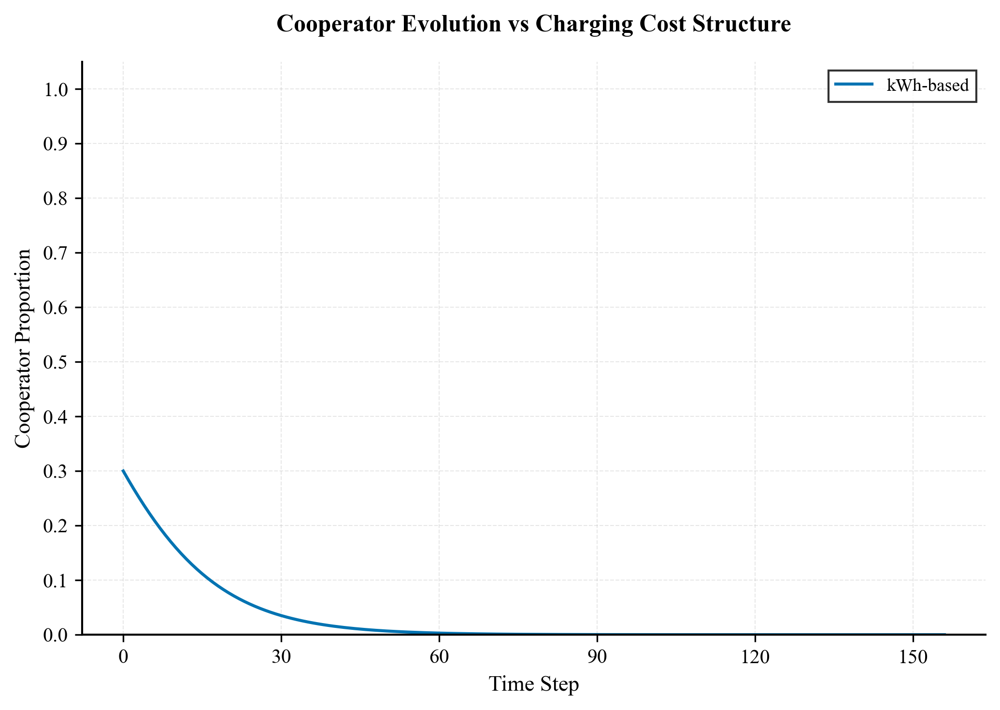

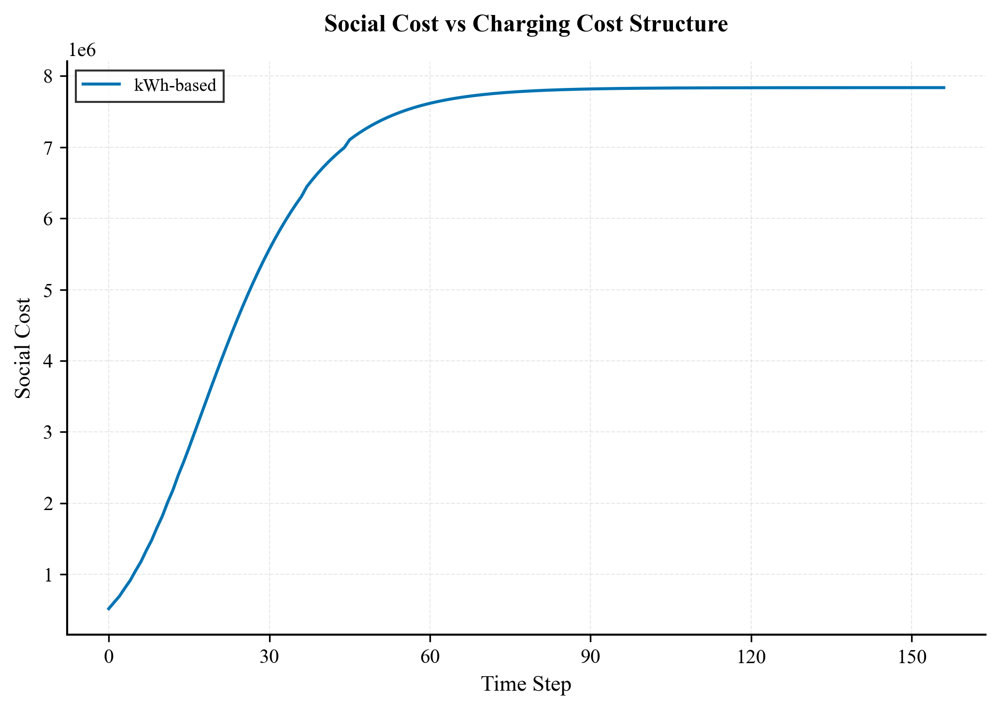

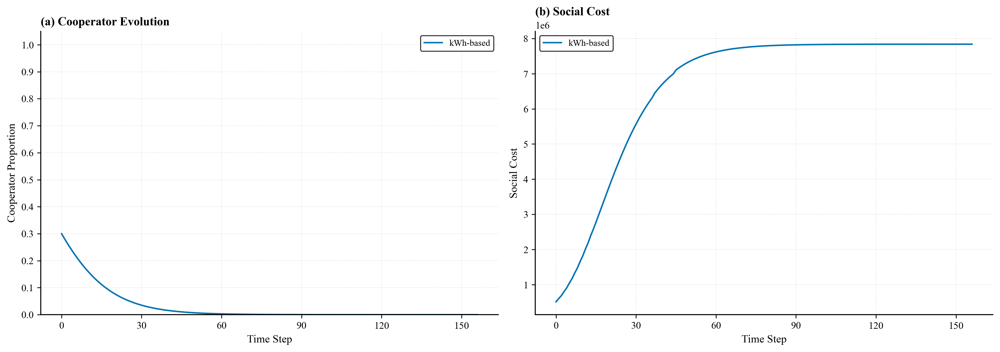

In [41]:
# Set publication-quality parameters
plt.rcParams.update({
    'font.family': 'serif',
    'font.serif': ['Times New Roman'],
    'font.size': 10,
    'axes.labelsize': 11,
    'axes.titlesize': 12,
    'xtick.labelsize': 10,
    'ytick.labelsize': 10,
    'legend.fontsize': 9,
    'figure.figsize': (7, 5),
    'figure.dpi': 300,
    'savefig.dpi': 600,
    'savefig.bbox': 'tight',
    'axes.linewidth': 1.0,
    'grid.alpha': 0.3,
    'lines.linewidth': 1.5,
    'lines.markersize': 4
})

# Define color scheme (colorblind-friendly)
colors = ['#0173B2', '#DE8F05', '#029E73', '#CC78BC']
linestyles = ['-', '--', '-.', ':']

# Figure 1: Cooperator Evolution
fig1, ax1 = plt.subplots(figsize=(7, 5))

x_track_range = np.arange(t_init_evo, t_init_evo + len(x_track_kwh))

ax1.plot(x_track_range, CCS_dict_kwh[80][0], 
         label='kWh-based', 
         color=colors[0], 
         linestyle=linestyles[0])


ax1.set_xlabel('Time Step', fontweight='normal')
ax1.set_ylabel('Cooperator Proportion', fontweight='normal')
ax1.set_title('Cooperator Evolution vs Charging Cost Structure', 
              fontweight='bold', pad=15)

ax1.set_xticks(np.arange(t_init_evo, t_end_evo, step=30))
ax1.set_yticks(np.arange(0, 1.1, step=0.1))
ax1.set_ylim(0, 1.05)

# Add grid for better readability
ax1.grid(True, alpha=0.3, linestyle='--', linewidth=0.5)

# Legend with frame
ax1.legend(loc='best', frameon=True, fancybox=False, 
           shadow=False, edgecolor='black')

# Remove top and right spines for cleaner look
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)

plt.tight_layout()
# plt.savefig('cooperator_evolution.pdf', format='pdf', dpi=600, bbox_inches='tight')
# plt.savefig('cooperator_evolution.png', format='png', dpi=600, bbox_inches='tight')
plt.show()


# Figure 2: Social Cost
fig2, ax2 = plt.subplots(figsize=(7, 5))

NetSc_track= np.arange(t_init_evo, t_init_evo + len(NetSc))

ax2.plot(NetSc_track, CCS_dict_kwh[80][-1], 
         label='kWh-based', 
         color=colors[0], 
         linestyle=linestyles[0])

ax2.set_xlabel('Time Step', fontweight='normal')
ax2.set_ylabel('Social Cost', fontweight='normal')
ax2.set_title('Social Cost vs Charging Cost Structure', 
              fontweight='bold', pad=15)

ax2.set_xticks(np.arange(t_init_evo, t_end_evo+1, step=30))

# Add grid for better readability
ax2.grid(True, alpha=0.3, linestyle='--', linewidth=0.5)

# Legend with frame
ax2.legend(loc='best', frameon=True, fancybox=False, 
           shadow=False, edgecolor='black')

# Remove top and right spines for cleaner look
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)

plt.tight_layout()
# plt.savefig('social_cost_evolution.pdf', format='pdf', dpi=600, bbox_inches='tight')
# plt.savefig('social_cost_evolution.png', format='png', dpi=600, bbox_inches='tight')
plt.show()


# Optional: Create a combined figure with subplots (common in journals)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

# Plot 1
x_track_range = np.arange(t_init_evo, t_init_evo + len(x_track_kwh))
ax1.plot(x_track_range, CCS_dict_kwh[80][0], label='kWh-based', 
         color=colors[0], linestyle=linestyles[0])
ax1.set_xlabel('Time Step')
ax1.set_ylabel('Cooperator Proportion')
ax1.set_title('(a) Cooperator Evolution', fontweight='bold', loc='left')
ax1.set_xticks(np.arange(t_init_evo, t_end_evo+1, step=30))
ax1.set_yticks(np.arange(0, 1.1, step=0.1))
ax1.set_ylim(0, 1.05)
ax1.grid(True, alpha=0.3, linestyle='--', linewidth=0.5)
ax1.legend(loc='best', frameon=True, edgecolor='black')
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)

# Plot 2
NetSc_track = np.arange(t_init_evo, t_init_evo + len(NetSc))
ax2.plot(NetSc_track, CCS_dict_kwh[80][-1], label='kWh-based', 
         color=colors[0], linestyle=linestyles[0])
ax2.set_xlabel('Time Step')
ax2.set_ylabel('Social Cost')
ax2.set_title('(b) Social Cost', fontweight='bold', loc='left')
ax2.set_xticks(np.arange(t_init_evo, t_end_evo+1, step=30))
ax2.grid(True, alpha=0.3, linestyle='--', linewidth=0.5)
ax2.legend(loc='best', frameon=True, edgecolor='black')
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)

plt.tight_layout()
# plt.savefig('combined_figure.pdf', format='pdf', dpi=600, bbox_inches='tight')
# plt.savefig('combined_figure.png', format='png', dpi=600, bbox_inches='tight')
# plt.savefig(r"C:\Users\kenny\OneDrive - purdue.edu\Documents\Kenny's File\Transportation Literature\Fall 2025\ASPIRE\combined_figure.png", format='png', dpi=600, bbox_inches='tight')
# plt.savefig(r"C:\Users\kenny\OneDrive - purdue.edu\Documents\Kenny's File\Transportation Literature\Fall 2024\CE 597 SET\Project\Journal Submission\Figures\Charging Cost Structure.png", format='png', dpi=700, bbox_inches='tight')
plt.show()

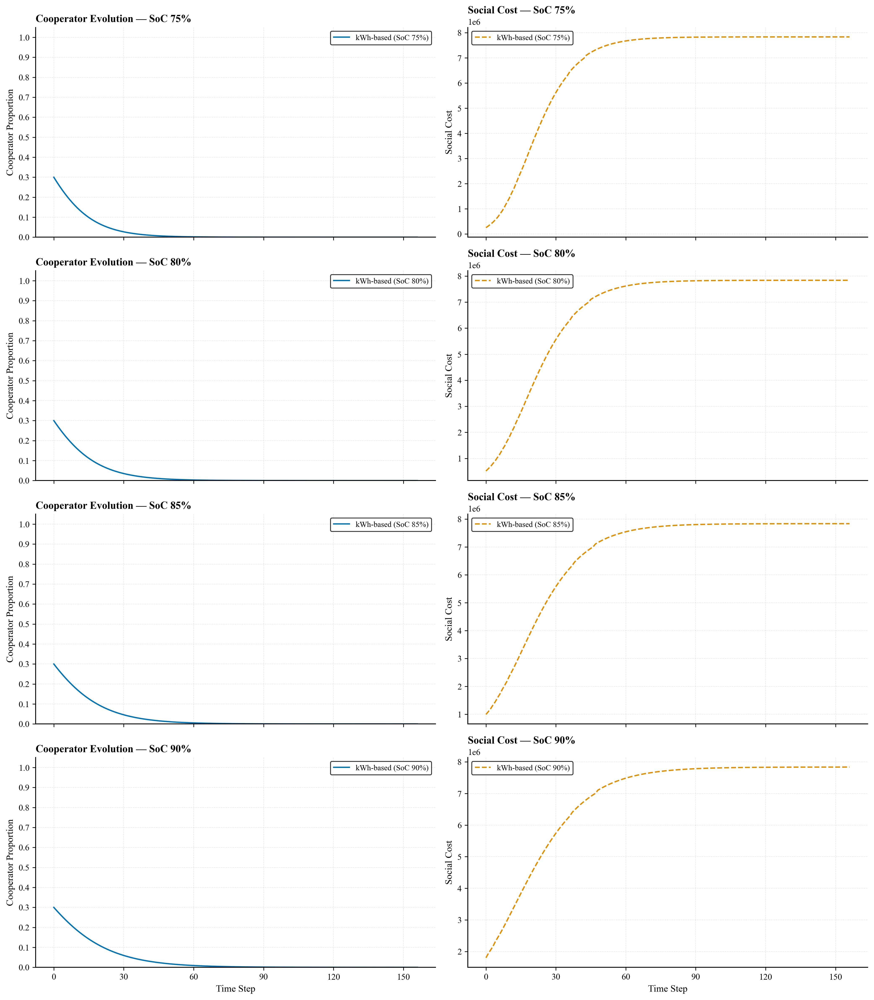

In [42]:
# Set publication-quality parameters
plt.rcParams.update({
    'font.family': 'serif',
    'font.serif': ['Times New Roman'],
    'font.size': 10,
    'axes.labelsize': 11,
    'axes.titlesize': 12,
    'xtick.labelsize': 10,
    'ytick.labelsize': 10,
    'legend.fontsize': 9,
    'figure.figsize': (7, 5),
    'figure.dpi': 300,
    'savefig.dpi': 600,
    'savefig.bbox': 'tight',
    'axes.linewidth': 1.0,
    'grid.alpha': 0.3,
    'lines.linewidth': 1.5,
    'lines.markersize': 4
})

# Define color scheme (colorblind-friendly)
colors = ['#0173B2', '#DE8F05', '#029E73', '#CC78BC']
linestyles = ['-', '--', '-.', ':']

# Create a 4x2 grid: left column = cooperator evolution, right column = social cost
fig, axes = plt.subplots(4, 2, figsize=(14, 16), sharex='col')
keys = sorted(CCS_dict_kwh.keys())

for i, soc in enumerate(keys):
    x_track = CCS_dict_kwh[soc][0]
    net_sc = CCS_dict_kwh[soc][-1]

    # x-axes
    x_range = np.arange(t_init_evo, t_init_evo + len(x_track))
    sc_range = np.arange(t_init_evo, t_init_evo + len(net_sc))

    # Left: cooperator evolution
    axL = axes[i, 0]
    axL.plot(x_range, x_track, label=f'kWh-based (SoC {soc}%)', color=colors[0], linestyle=linestyles[0])
    axL.set_ylim(0, 1.05)
    axL.set_ylabel('Cooperator Proportion')
    axL.set_title(f'Cooperator Evolution — SoC {soc}%', loc='left', fontweight='bold')
    axL.grid(True, alpha=0.3, linestyle='--', linewidth=0.5)
    axL.legend(loc='best', frameon=True, edgecolor='black')
    axL.spines['top'].set_visible(False)
    axL.spines['right'].set_visible(False)
    axL.set_yticks(np.arange(0, 1.1, 0.1))

    # Right: social cost
    axR = axes[i, 1]
    axR.plot(sc_range, net_sc, label=f'kWh-based (SoC {soc}%)', color=colors[1], linestyle=linestyles[1])
    axR.set_ylabel('Social Cost')
    axR.set_title(f'Social Cost — SoC {soc}%', loc='left', fontweight='bold')
    axR.grid(True, alpha=0.3, linestyle='--', linewidth=0.5)
    axR.legend(loc='best', frameon=True, edgecolor='black')
    axR.spines['top'].set_visible(False)
    axR.spines['right'].set_visible(False)

    # common x ticks (evolution uses t_init_evo..t_end_evo)
    axL.set_xticks(np.arange(t_init_evo, t_end_evo+1, step=30))
    axR.set_xticks(np.arange(t_init_evo, t_end_evo+1, step=30))

# Labels for bottom row x-axis
for ax in axes[-1, :]:
    ax.set_xlabel('Time Step')

plt.tight_layout()
plt.show()


##### Time based

In [43]:
# Global Parameters
CCS_dict_time = {
    75:[], 
    80:[],
    85:[],
    90:[],
} # sequence for each SoC target: [[x_track], [mu_avg_track], [NetSc]]

# # this is for EVCS operation (minute by minute) on a single day
# t_init_evcs = 0 
# t_end_evcs = 1439
# # this is for EVCS operation (minute by minute) on a single day
# t_init_evo = 0 
# t_end_evo = 52*3
# dt = 5/(365 - 2*52) # 1 week worth of behavior change

In [44]:
## time-based
# Strategy evolution over time
for SoCtarget in CCS_dict_time.keys():
    x = 0.3
    mu_d = (fast_charge_time(99, SoCinit, tau) + delta)**-1 # charging station's service rate if EV users being defectors (overstaying behavior)
    mu_c = (fast_charge_time(SoCtarget, SoCinit, tau))**-1 # charging station's service rate if EV users being cooperative
    mu_avg = x*mu_c + (1-x)*mu_d
    x_track_time = [x]
    mu_avg_track_time = [mu_avg]
    for t in range(t_init_evo,t_end_evo):
        payoff_coop,payoff_def = payoff(SoCtarget, SoCinit, alpha, 
                                    EVcap, dist_per_kwh, inconv_time, 
                                    vot, delta, tau, timebased=True,
                                    time_cost=0.35)
        
        phi = average_payoff(x, payoff_coop, payoff_def)
        dxtdt = dxdt(x, payoff_coop, phi)
        x += dt*dxtdt
        mu_avg = x*mu_c + (1-x)*mu_d

        x_track_time.append(x)
        mu_avg_track_time.append(mu_avg)

    CCS_dict_time[SoCtarget].append(x_track_time.copy())
    CCS_dict_time[SoCtarget].append(mu_avg_track_time.copy())

# Total social cost over the year
for SoCtarget in CCS_dict_time.keys():
    NetSc = []
    for mu_avg in CCS_dict_time[SoCtarget][1]:
        Wt = workplace_lambda_t[0] # number of EV waiting in the queue at time t -> initial value
        St = 0 # number of EV currently being serviced (fueling) at time t -> initial value
        Wt_track_time = [Wt]
        St_track_time = [St]
        SCt_track_time = []

        for t in range(t_init_evcs,t_end_evcs):
    
            Wt += workplace_lambda_t[t]
            lambda_st = begin_service(sigma, C, St, Wt)
            Wt -= lambda_st
            if Wt < 0:
                Wt = 0
                
            CSRt = CSR(mu_avg, St)
            
            dStdt = lambda_st-CSRt
            St += dStdt
            if St < 0:
                St = 0
                
            Twt_avg = avg_wait(Wt, lambda_st)
            Twt = total_wait(Wt, Twt_avg) 
            SCt = beta*Twt
            
            Wt_track_time.append(Wt)
            St_track_time.append(St)
            SCt_track_time.append(SCt)

        NetSc.append(sum(SCt_track_time)*5) # 5 weekdays in a week
        
    CCS_dict_time[SoCtarget].append(NetSc.copy())
  

##### Flat

In [45]:
# Global Parameters
CCS_dict_flat = {
    75:[], 
    80:[],
    85:[],
    90:[],
} # sequence for each SoC target: [[x_track], [mu_avg_track], [NetSc]]

# # this is for EVCS operation (minute by minute) on a single day
# t_init_evcs = 0 
# t_end_evcs = 1439
# # this is for EVCS operation (minute by minute) on a single day
# t_init_evo = 0 
# t_end_evo = 52*3
# dt = 5/(365 - 2*52) # 1 week worth of behavior change

In [46]:
## flat-based
# Strategy evolution over time
for SoCtarget in CCS_dict_flat.keys():
    x = 0.3
    mu_d = (fast_charge_time(99, SoCinit, tau) + delta)**-1 # charging station's service rate if EV users being defectors (overstaying behavior)
    mu_c = (fast_charge_time(SoCtarget, SoCinit, tau))**-1 # charging station's service rate if EV users being cooperative
    mu_avg = x*mu_c + (1-x)*mu_d
    x_track_flat = [x]
    mu_avg_track_flat = [mu_avg]
    for t in range(t_init_evo,t_end_evo):
        payoff_coop,payoff_def = payoff(SoCtarget, SoCinit, alpha, 
                                    EVcap, dist_per_kwh, inconv_time, 
                                    vot, delta, tau, flatbased=True,
                                    flat_cost=5)
        
        phi = average_payoff(x, payoff_coop, payoff_def)
        dxtdt = dxdt(x, payoff_coop, phi)
        x += dt*dxtdt
        mu_avg = x*mu_c + (1-x)*mu_d

        x_track_flat.append(x)
        mu_avg_track_flat.append(mu_avg)

    CCS_dict_flat[SoCtarget].append(x_track_flat.copy())
    CCS_dict_flat[SoCtarget].append(mu_avg_track_flat.copy())

# Total social cost over the year
for SoCtarget in CCS_dict_flat.keys():
    NetSc = []
    for mu_avg in CCS_dict_flat[SoCtarget][1]:
        Wt = workplace_lambda_t[0] # number of EV waiting in the queue at time t -> initial value
        St = 0 # number of EV currently being serviced (fueling) at time t -> initial value
        Wt_track_flat = [Wt]
        St_track_flat = [St]
        SCt_track_flat = []

        for t in range(t_init_evcs,t_end_evcs):
    
            Wt += workplace_lambda_t[t]
            lambda_st = begin_service(sigma, C, St, Wt)
            Wt -= lambda_st
            if Wt < 0:
                Wt = 0
                
            CSRt = CSR(mu_avg, St)
            
            dStdt = lambda_st-CSRt
            St += dStdt
            if St < 0:
                St = 0
                
            Twt_avg = avg_wait(Wt, lambda_st)
            Twt = total_wait(Wt, Twt_avg) 
            SCt = beta*Twt
            
            Wt_track_flat.append(Wt)
            St_track_flat.append(St)
            SCt_track_flat.append(SCt)

        NetSc.append(sum(SCt_track_flat)*5)
        
    CCS_dict_flat[SoCtarget].append(NetSc.copy())
  

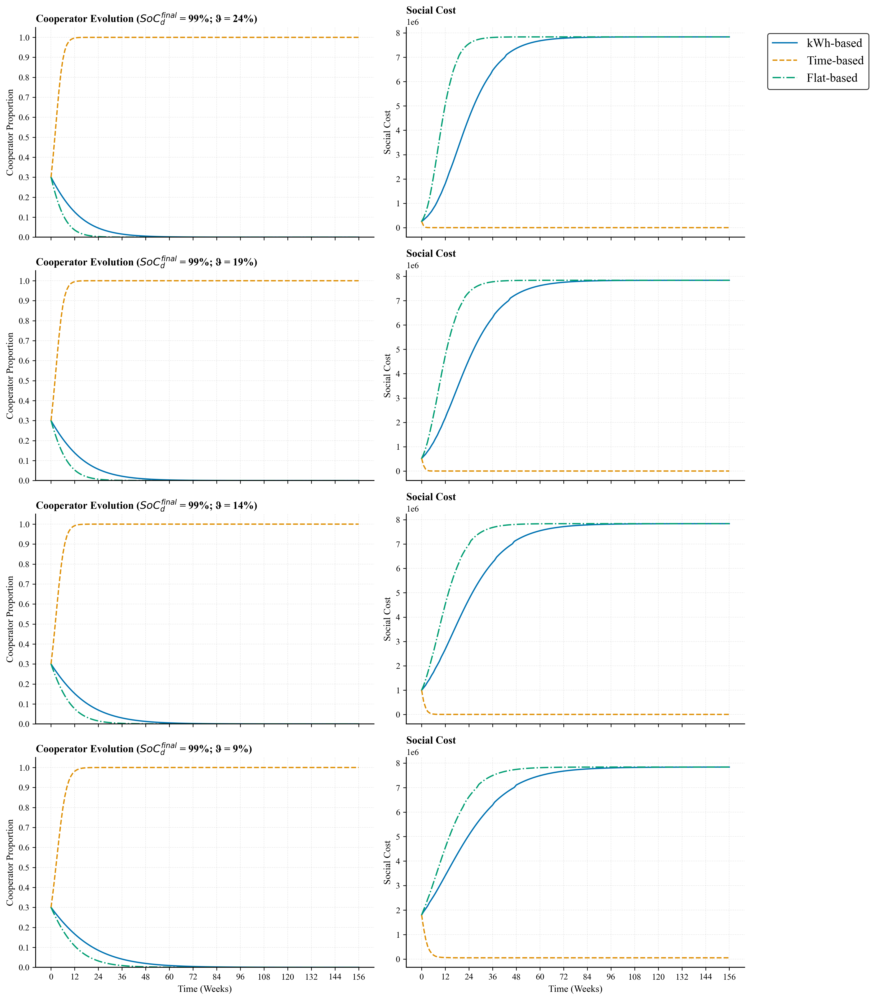

In [47]:
# Set publication-quality parameters
plt.rcParams.update({
    'font.family': 'serif',
    'font.serif': ['Times New Roman'],
    'font.size': 10,
    'axes.labelsize': 11,
    'axes.titlesize': 12,
    'xtick.labelsize': 10,
    'ytick.labelsize': 10,
    'legend.fontsize': 9,
    'figure.figsize': (7, 5),
    'figure.dpi': 300,
    'savefig.dpi': 600,
    'savefig.bbox': 'tight',
    'axes.linewidth': 1.0,
    'grid.alpha': 0.3,
    'lines.linewidth': 1.5,
    'lines.markersize': 4
})

# Define color scheme (colorblind-friendly)
colors = ['#0173B2', '#DE8F05', '#029E73', '#CC78BC']
linestyles = ['-', '--', '-.', ':']

# Create a 4x2 grid: left column = cooperator evolution, right column = social cost
fig, axes = plt.subplots(4, 2, figsize=(14, 16), sharex='col')
keys = sorted(CCS_dict_kwh.keys())

for i, soc in enumerate(keys):
    x_track = CCS_dict_kwh[soc][0]
    net_sc = CCS_dict_kwh[soc][-1]

    # x-axes
    x_range = np.arange(t_init_evo, t_init_evo + len(x_track))
    sc_range = np.arange(t_init_evo, t_init_evo + len(net_sc))

    # Left: cooperator evolution
    axL = axes[i, 0]
    axL.plot(x_range, CCS_dict_kwh[soc][0], label=f'kWh-based', color=colors[0], linestyle=linestyles[0])
    axL.plot(x_range, CCS_dict_time[soc][0], label=f'Time-based', color=colors[1], linestyle=linestyles[1])
    axL.plot(x_range, CCS_dict_flat[soc][0], label=f'Flat-based', color=colors[2], linestyle=linestyles[2])
    axL.set_ylim(0, 1.05)
    axL.set_ylabel('Cooperator Proportion')
    axL.set_title(f'Cooperator Evolution ($SoC_d^{{final}}$ = 99%; ϑ = {99-soc}%)', loc='left', fontweight='bold')
    axL.grid(True, alpha=0.3, linestyle='--', linewidth=0.5)
    # axL.legend(loc='upper right', frameon=True, edgecolor='black', fontsize=12)
    axL.spines['top'].set_visible(False)
    axL.spines['right'].set_visible(False)
    axL.set_yticks(np.arange(0, 1.1, 0.1))

    # Right: social cost
    axR = axes[i, 1]
    axR.plot(sc_range, CCS_dict_kwh[soc][-1], label=f'kWh-based', color=colors[0], linestyle=linestyles[0])
    axR.plot(sc_range, CCS_dict_time[soc][-1], label=f'Time-based', color=colors[1], linestyle=linestyles[1])
    axR.plot(sc_range, CCS_dict_flat[soc][-1], label=f'Flat-based', color=colors[2], linestyle=linestyles[2])
    axR.set_ylabel('Social Cost')
    axR.set_title(f'Social Cost', loc='left', fontweight='bold')
    axR.grid(True, alpha=0.3, linestyle='--', linewidth=0.5)
    # axR.legend(loc='upper left', frameon=True, edgecolor='black', fontsize=12)
    axR.spines['top'].set_visible(False)
    axR.spines['right'].set_visible(False)

    # Build unique legend from the first social-cost axis (top-right subplot)
    handles, labels = axes[0, 1].get_legend_handles_labels()
    by_label = OrderedDict(zip(labels, handles))

    # Place legend outside the first social cost subplot on the upper-right
    axes[0, 1].legend(by_label.values(), by_label.keys(),
                      loc='upper left', bbox_to_anchor=(1.05, 1.0),
                      frameon=True, edgecolor='black', fontsize=14)

    # common x ticks (evolution uses t_init_evo..t_end_evo)
    axL.set_xticks(np.arange(t_init_evo, t_end_evo+1, step=12))
    axR.set_xticks(np.arange(t_init_evo, t_end_evo+1, step=12))

# Labels for bottom row x-axis
for ax in axes[-1, :]:
    ax.set_xlabel('Time (Weeks)')

plt.tight_layout()
plt.savefig(r"C:\Users\kenny\OneDrive - purdue.edu\Documents\Kenny's File\Transportation Literature\Fall 2024\CE 597 SET\Project\Journal Submission\Figures\Charging Cost Structure - 1w3y.png", format='png', dpi=700, bbox_inches='tight')
plt.show()


##### Time-based vs kwh-based + Penalty

In [51]:
# Global Parameters
t_init = 420
t_end = 660
dt = 0.001

###### kwh-based

In [52]:
## kwh-based
# Wt = 7 # number of EV waiting in the queue at time t -> initial value
# St = 7 # number of EV currently being serviced (fueling) at time t -> initial value

Wt = workplace_lambda_t[t_init-1] # number of EV waiting in the queue at time t -> initial value
St = 0 # number of EV currently being serviced (fueling) at time t -> initial value

lambda_t = 3/60 # arrival rate of EV to the charging station at time t (EV per minute)
x = 0.3
mu_d = (fast_charge_time(99, SoCinit, tau) + delta)**-1 # charging station's service rate if EV users being defectors (overstaying behavior)
mu_avg = x*mu_c + (1-x)*mu_d
x_track_kwh = [x]
Wt_track_kwh = [Wt]
St_track_kwh = [St]
SCt_track_kwh = []
mu_avg_track_kwh = [mu_avg]
for t in range(t_init,t_end+1):
    
    # dWtdt = lambda_t-lambda_st
    
    # Wt += lambda_t
    Wt += workplace_lambda_t[t]
    lambda_st = begin_service(sigma, C, St, Wt)
    Wt -= lambda_st
    if Wt < 0:
        Wt = 0
        
    CSRt = CSR(mu_avg, St)
    
    dStdt = lambda_st-CSRt
    St += dStdt
    if St < 0:
        St = 0
        
    Twt_avg = avg_wait(Wt, lambda_st)
    Twt = total_wait(Wt, Twt_avg) 
    SCt = beta*Twt
    
    payoff_coop,payoff_def = payoff(SoCtarget, SoCinit, alpha, 
                                    EVcap, dist_per_kwh, inconv_time, 
                                    vot, delta, tau, kwhbased=True,
                                    kwh_cost=0.35)
    
    phi = average_payoff(x, payoff_coop, payoff_def)
    dxtdt = dxdt(x, payoff_coop, phi)
    x += dt*dxtdt
    mu_avg = x*mu_c + (1-x)*mu_d
    
    if t < 5:
        print('lambda_st: ', lambda_st)
        # print('dWtdt: ', dWtdt)
        print('Wt ', Wt)
        print('CSRt: ', CSRt)
        print('dStdt: ', dStdt)
        print('St: ', St)
        print('Twt_avg: ', Twt_avg)
        print('Twt: ', Twt)
        print('SCt: ', SCt)
        print('payoff_coop: ', payoff_coop)
        print('payoff_def: ', payoff_def)
        print('phi: ', phi)
        print('dxtdt: ', dxtdt)
    
    
    x_track_kwh.append(x)
    Wt_track_kwh.append(Wt)
    St_track_kwh.append(St)
    SCt_track_kwh.append(SCt)
    mu_avg_track_kwh.append(mu_avg)

###### kwh based + $0.1/min penalty

In [37]:
## kwh-based + $0.1/min penalty
# Wt = 7 # number of EV waiting in the queue at time t -> initial value
# St = 7 # number of EV currently being serviced (fueling) at time t -> initial value

Wt = workplace_lambda_t[t_init-1] # number of EV waiting in the queue at time t -> initial value
St = 0 # number of EV currently being serviced (fueling) at time t -> initial value

lambda_t = 3/60 # arrival rate of EV to the charging station at time t (EV per minute)
x = 0.3
mu_d = (fast_charge_time(99, SoCinit, tau) + delta)**-1 # charging station's service rate if EV users being defectors (overstaying behavior)
mu_avg = x*mu_c + (1-x)*mu_d
x_track_kwh_01pen = [x]
Wt_track_kwh_01pen = [Wt]
St_track_kwh_01pen = [St]
SCt_track_kwh_01pen = []
mu_avg_track_kwh_01pen = [mu_avg]
for t in range(t_init,t_end+1):
    
    # dWtdt = lambda_t-lambda_st
    
    # Wt += lambda_t
    Wt += workplace_lambda_t[t]
    lambda_st = begin_service(sigma, C, St, Wt)
    Wt -= lambda_st
    if Wt < 0:
        Wt = 0
        
    CSRt = CSR(mu_avg, St)
    
    dStdt = lambda_st-CSRt
    St += dStdt
    if St < 0:
        St = 0
        
    Twt_avg = avg_wait(Wt, lambda_st)
    Twt = total_wait(Wt, Twt_avg) 
    SCt = beta*Twt
    
    payoff_coop,payoff_def = payoff(SoCtarget, SoCinit, alpha, 
                                    EVcap, dist_per_kwh, inconv_time, 
                                    vot, delta, tau, kwhbased=True, time_penalty=True,
                                    kwh_cost=0.35, time_cost_pen=0.1)
    
    phi = average_payoff(x, payoff_coop, payoff_def)
    dxtdt = dxdt(x, payoff_coop, phi)
    x += dt*dxtdt
    mu_avg = x*mu_c + (1-x)*mu_d
    
    if t < 5:
        print('lambda_st: ', lambda_st)
        # print('dWtdt: ', dWtdt)
        print('Wt ', Wt)
        print('CSRt: ', CSRt)
        print('dStdt: ', dStdt)
        print('St: ', St)
        print('Twt_avg: ', Twt_avg)
        print('Twt: ', Twt)
        print('SCt: ', SCt)
        print('payoff_coop: ', payoff_coop)
        print('payoff_def: ', payoff_def)
        print('phi: ', phi)
        print('dxtdt: ', dxtdt)
    
    
    x_track_kwh_01pen.append(x)
    Wt_track_kwh_01pen.append(Wt)
    St_track_kwh_01pen.append(St)
    SCt_track_kwh_01pen.append(SCt)
    mu_avg_track_kwh_01pen.append(mu_avg)

###### kwh based + $0.5/min penalty

In [38]:
## kwh-based + $0.5/min penalty
# Wt = 7 # number of EV waiting in the queue at time t -> initial value
# St = 7 # number of EV currently being serviced (fueling) at time t -> initial value

Wt = workplace_lambda_t[t_init-1] # number of EV waiting in the queue at time t -> initial value
St = 0 # number of EV currently being serviced (fueling) at time t -> initial value

lambda_t = 3/60 # arrival rate of EV to the charging station at time t (EV per minute)
x = 0.3
mu_d = (fast_charge_time(99, SoCinit, tau) + delta)**-1 # charging station's service rate if EV users being defectors (overstaying behavior)
mu_avg = x*mu_c + (1-x)*mu_d
x_track_kwh_05pen = [x]
Wt_track_kwh_05pen = [Wt]
St_track_kwh_05pen = [St]
SCt_track_kwh_05pen = []
mu_avg_track_kwh_05pen = [mu_avg]
for t in range(t_init,t_end+1):
    
    # dWtdt = lambda_t-lambda_st
    
    # Wt += lambda_t
    Wt += workplace_lambda_t[t]
    lambda_st = begin_service(sigma, C, St, Wt)
    Wt -= lambda_st
    if Wt < 0:
        Wt = 0
        
    CSRt = CSR(mu_avg, St)
    
    dStdt = lambda_st-CSRt
    St += dStdt
    if St < 0:
        St = 0
        
    Twt_avg = avg_wait(Wt, lambda_st)
    Twt = total_wait(Wt, Twt_avg) 
    SCt = beta*Twt
    
    payoff_coop,payoff_def = payoff(SoCtarget, SoCinit, alpha, 
                                    EVcap, dist_per_kwh, inconv_time, 
                                    vot, delta, tau, kwhbased=True, time_penalty=True,
                                    kwh_cost=0.35, time_cost_pen=0.5)
    
    phi = average_payoff(x, payoff_coop, payoff_def)
    dxtdt = dxdt(x, payoff_coop, phi)
    x += dt*dxtdt
    mu_avg = x*mu_c + (1-x)*mu_d
    
    if t < 5:
        print('lambda_st: ', lambda_st)
        # print('dWtdt: ', dWtdt)
        print('Wt ', Wt)
        print('CSRt: ', CSRt)
        print('dStdt: ', dStdt)
        print('St: ', St)
        print('Twt_avg: ', Twt_avg)
        print('Twt: ', Twt)
        print('SCt: ', SCt)
        print('payoff_coop: ', payoff_coop)
        print('payoff_def: ', payoff_def)
        print('phi: ', phi)
        print('dxtdt: ', dxtdt)
    
    
    x_track_kwh_05pen.append(x)
    Wt_track_kwh_05pen.append(Wt)
    St_track_kwh_05pen.append(St)
    SCt_track_kwh_05pen.append(SCt)
    mu_avg_track_kwh_05pen.append(mu_avg)

###### kwh based + $1/min penalty

In [39]:
## kwh-based + $1/min penalty
# Wt = 7 # number of EV waiting in the queue at time t -> initial value
# St = 7 # number of EV currently being serviced (fueling) at time t -> initial value

Wt = workplace_lambda_t[t_init-1] # number of EV waiting in the queue at time t -> initial value
St = 0 # number of EV currently being serviced (fueling) at time t -> initial value

lambda_t = 3/60 # arrival rate of EV to the charging station at time t (EV per minute)
x = 0.3
mu_d = (fast_charge_time(99, SoCinit, tau) + delta)**-1 # charging station's service rate if EV users being defectors (overstaying behavior)
mu_avg = x*mu_c + (1-x)*mu_d
x_track_kwh_1pen = [x]
Wt_track_kwh_1pen = [Wt]
St_track_kwh_1pen = [St]
SCt_track_kwh_1pen = []
mu_avg_track_kwh_1pen = [mu_avg]
for t in range(t_init,t_end+1):
    
    # dWtdt = lambda_t-lambda_st
    
    # Wt += lambda_t
    Wt += workplace_lambda_t[t]
    lambda_st = begin_service(sigma, C, St, Wt)
    Wt -= lambda_st
    if Wt < 0:
        Wt = 0
        
    CSRt = CSR(mu_avg, St)
    
    dStdt = lambda_st-CSRt
    St += dStdt
    if St < 0:
        St = 0
        
    Twt_avg = avg_wait(Wt, lambda_st)
    Twt = total_wait(Wt, Twt_avg) 
    SCt = beta*Twt
    
    payoff_coop,payoff_def = payoff(SoCtarget, SoCinit, alpha, 
                                    EVcap, dist_per_kwh, inconv_time, 
                                    vot, delta, tau, kwhbased=True, time_penalty=True,
                                    kwh_cost=0.35, time_cost_pen=1.0)
    
    phi = average_payoff(x, payoff_coop, payoff_def)
    dxtdt = dxdt(x, payoff_coop, phi)
    x += dt*dxtdt
    mu_avg = x*mu_c + (1-x)*mu_d
    
    if t < 5:
        print('lambda_st: ', lambda_st)
        # print('dWtdt: ', dWtdt)
        print('Wt ', Wt)
        print('CSRt: ', CSRt)
        print('dStdt: ', dStdt)
        print('St: ', St)
        print('Twt_avg: ', Twt_avg)
        print('Twt: ', Twt)
        print('SCt: ', SCt)
        print('payoff_coop: ', payoff_coop)
        print('payoff_def: ', payoff_def)
        print('phi: ', phi)
        print('dxtdt: ', dxtdt)
    
    
    x_track_kwh_1pen.append(x)
    Wt_track_kwh_1pen.append(Wt)
    St_track_kwh_1pen.append(St)
    SCt_track_kwh_1pen.append(SCt)
    mu_avg_track_kwh_1pen.append(mu_avg)

###### time based

In [40]:
## Time-based
# Wt = 7 # number of EV waiting in the queue at time t -> initial value
# St = 7 # number of EV currently being serviced (fueling) at time t -> initial value

Wt = workplace_lambda_t[t_init-1] # number of EV waiting in the queue at time t -> initial value
St = 0 # number of EV currently being serviced (fueling) at time t -> initial value
x = 0.3
mu_d = (fast_charge_time(99, SoCinit, tau) + delta)**-1 # charging station's service rate if EV users being defectors (overstaying behavior)
mu_avg = x*mu_c + (1-x)*mu_d
x_track_time = [x]
Wt_track_time = [Wt]
St_track_time = [St]
SCt_track_time = []
mu_avg_track_time = [mu_avg]
# dt = 0.00045
for t in range(t_init,t_end+1):
    
    # dWtdt = lambda_t-lambda_st
    
    # Wt += lambda_t
    Wt += workplace_lambda_t[t]
    lambda_st = begin_service(sigma, C, St, Wt)
    Wt -= lambda_st
    if Wt < 0:
        Wt = 0
        
    CSRt = CSR(mu_avg, St)
    
    dStdt = lambda_st-CSRt
    St += dStdt
    if St < 0:
        St = 0
        
    Twt_avg = avg_wait(Wt, lambda_st)
    Twt = total_wait(Wt, Twt_avg) 
    SCt = beta*Twt
    
    payoff_coop,payoff_def = payoff(SoCtarget, SoCinit, alpha, 
                                    EVcap, dist_per_kwh, inconv_time, 
                                    vot, delta, tau, timebased=True,
                                    time_cost=0.35)
    
    phi = average_payoff(x, payoff_coop, payoff_def)
    dxtdt = dxdt(x, payoff_coop, phi)
    x += dt*dxtdt
    mu_avg = x*mu_c + (1-x)*mu_d
    
    if t < 5:
        print('lambda_st: ', lambda_st)
        # print('dWtdt: ', dWtdt)
        print('Wt ', Wt)
        print('CSRt: ', CSRt)
        print('dStdt: ', dStdt)
        print('St: ', St)
        print('Twt_avg: ', Twt_avg)
        print('Twt: ', Twt)
        print('SCt: ', SCt)
        print('payoff_coop: ', payoff_coop)
        print('payoff_def: ', payoff_def)
        print('phi: ', phi)
        print('dxtdt: ', dxtdt)
    
    
    x_track_time.append(x)
    Wt_track_time.append(Wt)
    St_track_time.append(St)
    SCt_track_time.append(SCt)
    mu_avg_track_time.append(mu_avg)

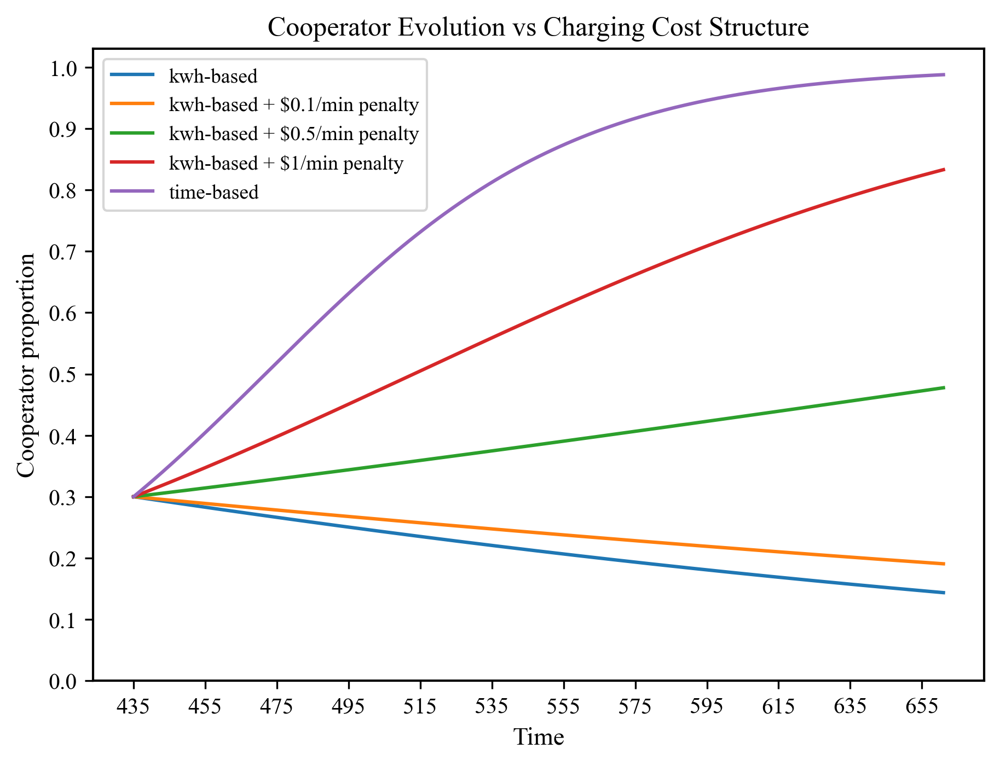

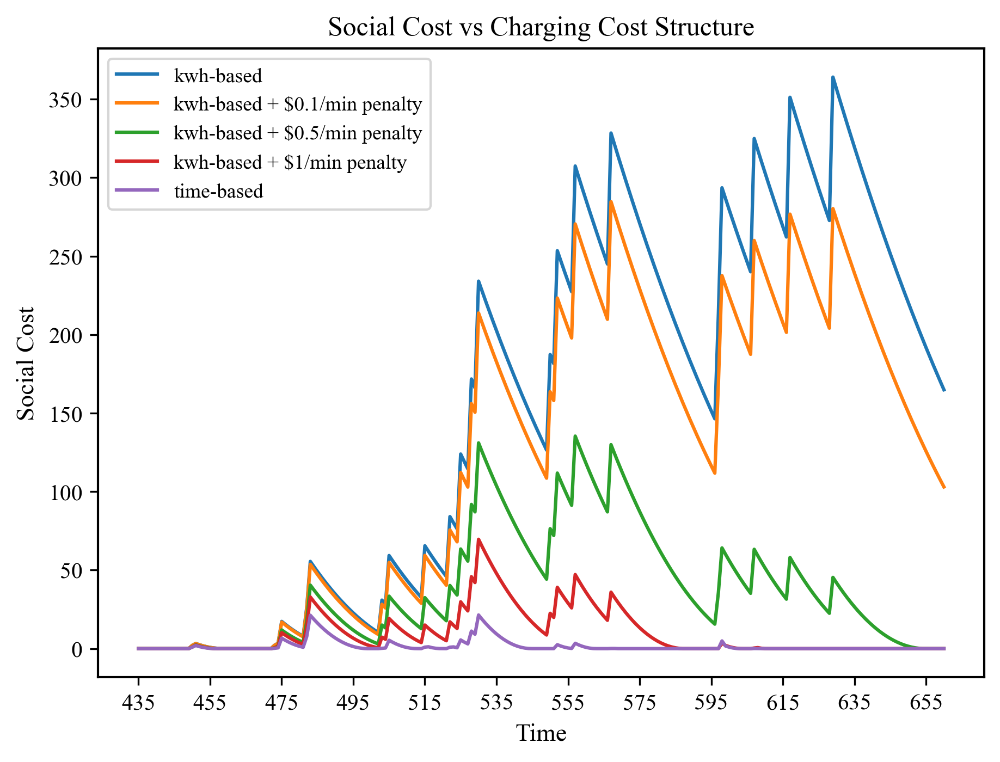

In [41]:
plt.figure(1)
x_track_range = np.arange(t_init, t_init + len(x_track_kwh))
plt.plot(x_track_range, x_track_kwh, label = 'kwh-based')
plt.plot(x_track_range, x_track_kwh_01pen, label = 'kwh-based + $0.1/min penalty')
plt.plot(x_track_range, x_track_kwh_05pen, label = 'kwh-based + $0.5/min penalty')
plt.plot(x_track_range, x_track_kwh_1pen, label = 'kwh-based + $1/min penalty')
plt.plot(x_track_range,x_track_time, label = 'time-based')

plt.title('Cooperator Evolution vs Charging Cost Structure')
plt.legend()
plt.xlabel('Time')
plt.xticks(np.arange(t_init, t_end+1, step=20))
plt.ylabel('Cooperator proportion')
plt.yticks(np.arange(0, 1.1, step=0.1))
# plt.savefig(r"C:\Users\kenny\OneDrive - purdue.edu\Documents\Kenny's File\Transportation Literature\Fall 2024\CE 597 SET\Project\Results\Cooperator Evolution vs Charging Cost Structure.png", 
#             dpi = 700)
plt.show()

plt.figure(2)
SCt_track_range = np.arange(t_init, t_init + len(SCt_track_kwh))
plt.plot(SCt_track_range, SCt_track_kwh, label = 'kwh-based')
plt.plot(SCt_track_range, SCt_track_kwh_01pen, label = 'kwh-based + $0.1/min penalty')
plt.plot(SCt_track_range, SCt_track_kwh_05pen, label = 'kwh-based + $0.5/min penalty')
plt.plot(SCt_track_range, SCt_track_kwh_1pen, label = 'kwh-based + $1/min penalty')
plt.plot(SCt_track_range, SCt_track_time, label = 'time-based')

plt.title('Social Cost vs Charging Cost Structure')
plt.legend()
plt.xlabel('Time')
plt.xticks(np.arange(t_init, t_end+1, step=20))
plt.ylabel('Social Cost')
# plt.savefig(r"C:\Users\kenny\OneDrive - purdue.edu\Documents\Kenny's File\Transportation Literature\Fall 2024\CE 597 SET\Project\Results\Social Cost vs Charging Cost Structure.png", 
#             dpi = 700)
plt.show()

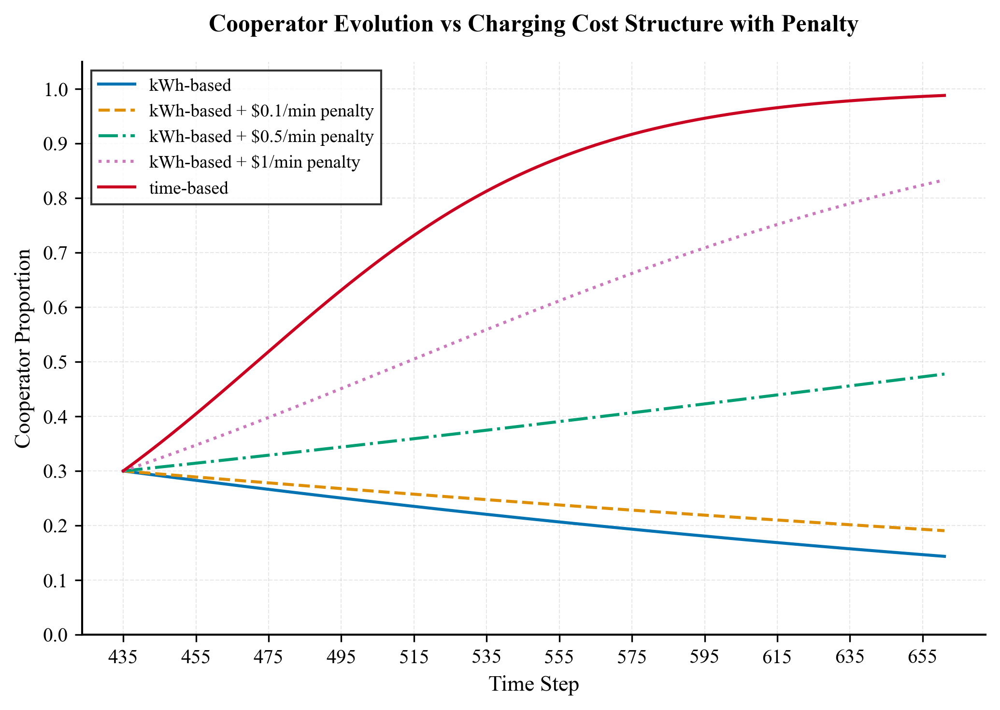

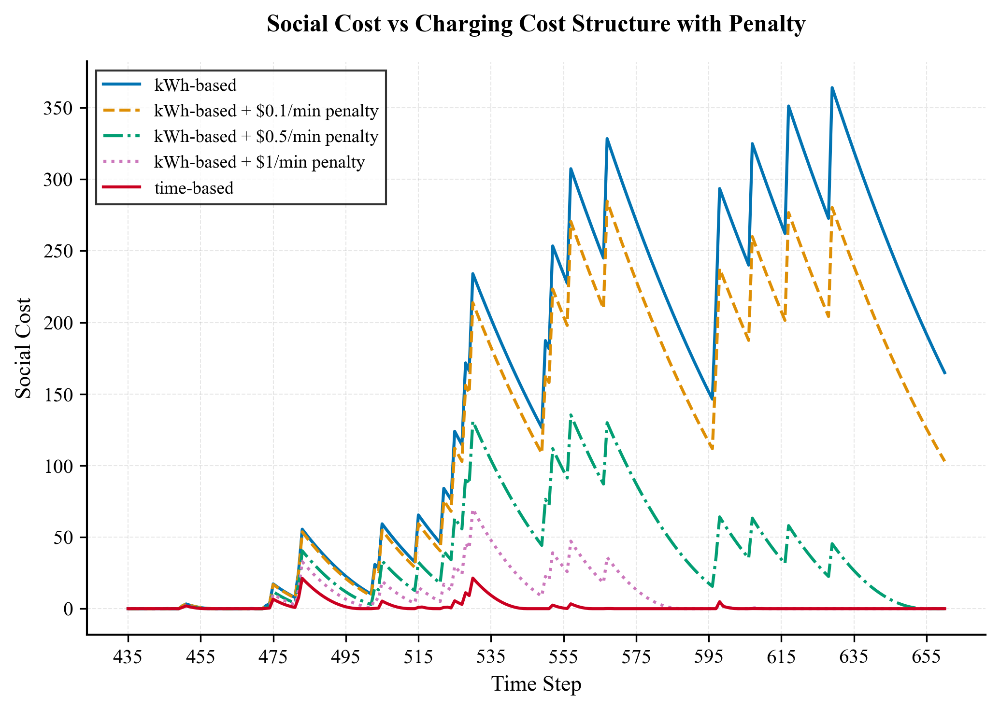

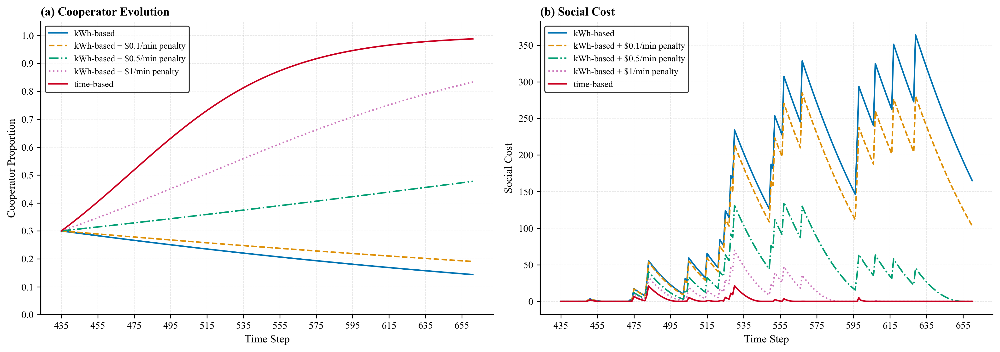

In [ ]:
# Set publication-quality parameters
plt.rcParams.update({
    'font.family': 'serif',
    'font.serif': ['Times New Roman'],
    'font.size': 10,
    'axes.labelsize': 11,
    'axes.titlesize': 12,
    'xtick.labelsize': 10,
    'ytick.labelsize': 10,
    'legend.fontsize': 9,
    'figure.figsize': (7, 5),
    'figure.dpi': 300,
    'savefig.dpi': 600,
    'savefig.bbox': 'tight',
    'axes.linewidth': 1.0,
    'grid.alpha': 0.3,
    'lines.linewidth': 1.5,
    'lines.markersize': 4
})

# Define color scheme (colorblind-friendly)
colors = ['#0173B2', '#DE8F05', '#029E73', '#CC78BC', '#CA0020']
linestyles = ['-', '--', '-.', ':', '-']

# Figure 1: Cooperator Evolution
fig1, ax1 = plt.subplots(figsize=(7, 5))

x_track_range = np.arange(t_init, t_init + len(x_track_kwh))

ax1.plot(x_track_range, x_track_kwh, 
         label='kWh-based', 
         color=colors[0], 
         linestyle=linestyles[0])
ax1.plot(x_track_range, x_track_kwh_01pen, 
         label='kWh-based + $0.1/min penalty', 
         color=colors[1], 
         linestyle=linestyles[1])
ax1.plot(x_track_range, x_track_kwh_05pen, 
         label='kWh-based + $0.5/min penalty', 
         color=colors[3], 
         linestyle=linestyles[3])
ax1.plot(x_track_range, x_track_kwh_1pen, 
         label='kWh-based + $1/min penalty', 
         color=colors[4], 
         linestyle=linestyles[4])
ax1.plot(x_track_range, x_track_time,
         label='time-based', 
         color=colors[2], 
         linestyle=linestyles[2])

ax1.set_xlabel('Time Step', fontweight='normal')
ax1.set_ylabel('Cooperator Proportion', fontweight='normal')
ax1.set_title('Cooperator Evolution vs Charging Cost Structure with Time-based Penalty', 
              fontweight='bold', pad=15)

ax1.set_xticks(np.arange(t_init, t_end+1, step=20))
ax1.set_yticks(np.arange(0, 1.1, step=0.1))
ax1.set_ylim(0, 1.05)

# Add grid for better readability
ax1.grid(True, alpha=0.3, linestyle='--', linewidth=0.5)

# Legend with frame
ax1.legend(loc='best', frameon=True, fancybox=False, 
           shadow=False, edgecolor='black')

# Remove top and right spines for cleaner look
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)

plt.tight_layout()
# plt.savefig('cooperator_evolution.pdf', format='pdf', dpi=600, bbox_inches='tight')
# plt.savefig('cooperator_evolution.png', format='png', dpi=600, bbox_inches='tight')
plt.show()


# Figure 2: Social Cost
fig2, ax2 = plt.subplots(figsize=(7, 5))

SCt_track_range = np.arange(t_init, t_init + len(SCt_track_kwh))

ax2.plot(SCt_track_range, SCt_track_kwh, 
         label='kWh-based', 
         color=colors[0], 
         linestyle=linestyles[0])
ax2.plot(SCt_track_range, SCt_track_kwh_01pen, 
         label='kWh-based + $0.1/min penalty', 
         color=colors[1], 
         linestyle=linestyles[1])
ax2.plot(SCt_track_range, SCt_track_kwh_05pen, 
         label='kWh-based + $0.5/min penalty', 
         color=colors[2], 
         linestyle=linestyles[2])
ax2.plot(SCt_track_range, SCt_track_kwh_1pen, 
         label='kWh-based + $1/min penalty', 
         color=colors[3], 
         linestyle=linestyles[3])
ax2.plot(SCt_track_range, SCt_track_time, 
         label='time-based', 
         color=colors[4], 
         linestyle=linestyles[4])

ax2.set_xlabel('Time Step', fontweight='normal')
ax2.set_ylabel('Social Cost', fontweight='normal')
ax2.set_title('Social Cost vs Charging Cost Structure with Time-based Penalty', 
              fontweight='bold', pad=15)

ax2.set_xticks(np.arange(t_init, t_end+1, step=20))

# Add grid for better readability
ax2.grid(True, alpha=0.3, linestyle='--', linewidth=0.5)

# Legend with frame
ax2.legend(loc='best', frameon=True, fancybox=False, 
           shadow=False, edgecolor='black')

# Remove top and right spines for cleaner look
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)

plt.tight_layout()
# plt.savefig('social_cost_evolution.pdf', format='pdf', dpi=600, bbox_inches='tight')
# plt.savefig('social_cost_evolution.png', format='png', dpi=600, bbox_inches='tight')
plt.show()


# Optional: Create a combined figure with subplots (common in journals)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

# Plot 1
x_track_range = np.arange(t_init, t_init + len(x_track_kwh))
ax1.plot(x_track_range, x_track_kwh, label='kWh-based', 
         color=colors[0], linestyle=linestyles[0])
ax1.plot(x_track_range, x_track_kwh_01pen, 
         label='kWh-based + $0.1/min penalty', color=colors[1], linestyle=linestyles[1])
ax1.plot(x_track_range, x_track_kwh_05pen, 
         label='kWh-based + $0.5/min penalty', color=colors[3], linestyle=linestyles[3])
ax1.plot(x_track_range, x_track_kwh_1pen, 
         label='kWh-based + $1/min penalty', color=colors[4], linestyle=linestyles[4])
ax1.plot(x_track_range, x_track_time, 
         label='time-based', color=colors[2], linestyle=linestyles[2])
ax1.set_xlabel('Time Step')
ax1.set_ylabel('Cooperator Proportion')
ax1.set_title('(a) Cooperator Evolution', fontweight='bold', loc='left')
ax1.set_xticks(np.arange(t_init, t_end+1, step=20))
ax1.set_yticks(np.arange(0, 1.1, step=0.1))
ax1.set_ylim(0, 1.05)
ax1.grid(True, alpha=0.3, linestyle='--', linewidth=0.5)
ax1.legend(loc='best', frameon=True, edgecolor='black')
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)

# Plot 2
SCt_track_range = np.arange(t_init, t_init + len(SCt_track_kwh))
ax2.plot(SCt_track_range, SCt_track_kwh, label='kWh-based', 
         color=colors[0], linestyle=linestyles[0])
ax2.plot(SCt_track_range, SCt_track_kwh_01pen, 
         label='kWh-based + $0.1/min penalty', color=colors[1], linestyle=linestyles[1])
ax2.plot(SCt_track_range, SCt_track_kwh_05pen, 
         label='kWh-based + $0.5/min penalty', color=colors[3], linestyle=linestyles[3])
ax2.plot(SCt_track_range, SCt_track_kwh_1pen, 
         label='kWh-based + $1/min penalty', color=colors[4], linestyle=linestyles[4])
ax2.plot(SCt_track_range, SCt_track_time, 
         label='time-based', color=colors[2], linestyle=linestyles[2])
ax2.set_xlabel('Time Step')
ax2.set_ylabel('Social Cost')
ax2.set_title('(b) Social Cost', fontweight='bold', loc='left')
ax2.set_xticks(np.arange(t_init, t_end+1, step=20))
ax2.grid(True, alpha=0.3, linestyle='--', linewidth=0.5)
ax2.legend(loc='best', frameon=True, edgecolor='black')
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)

plt.tight_layout()
# plt.savefig('combined_figure.pdf', format='pdf', dpi=600, bbox_inches='tight')
# plt.savefig('combined_figure.png', format='png', dpi=600, bbox_inches='tight')
plt.show()

### Monetary Penalty and Reward

In [48]:
# Global Parameters
CCS_dict_kwh = {
    75:[], 
    80:[],
    85:[],
    90:[],
} # sequence for each SoC target: [[x_track], [mu_avg_track], [NetSc]]

# this is for EVCS operation (minute by minute) on a single day
t_init_evcs = 0 
t_end_evcs = 1439
# this is for EVCS operation (minute by minute) on a single day
t_init_evo = 0 
t_end_evo = 52*3
dt = 1/52 # 1 week worth of behavior change

alpha = 10/60 # value of mobility ($/miles)
beta = 35/60 # value of waiting ($/minutes) -> social cost
vot = 28.16/60 # $/min -> inconvenience cost
# vot = 60/60
C = 8

##### kwh based (benchmark)

In [49]:
## kwh-based
# Strategy evolution over time
for SoCtarget in CCS_dict_kwh.keys():
    x = 0.3
    mu_d = (fast_charge_time(99, SoCinit, tau) + delta)**-1 # charging station's service rate if EV users being defectors (overstaying behavior)
    mu_c = (fast_charge_time(SoCtarget, SoCinit, tau))**-1 # charging station's service rate if EV users being cooperative
    mu_avg = x*mu_c + (1-x)*mu_d
    x_track_kwh = [x]
    mu_avg_track_kwh = [mu_avg]
    for t in range(t_init_evo,t_end_evo):
        payoff_coop,payoff_def = payoff(SoCtarget, SoCinit, alpha, 
                                        EVcap, dist_per_kwh, inconv_time, 
                                        vot, delta, tau, kwhbased=True,
                                        kwh_cost=0.35)
        
        phi = average_payoff(x, payoff_coop, payoff_def)
        dxtdt = dxdt(x, payoff_coop, phi)
        x += dt*dxtdt
        mu_avg = x*mu_c + (1-x)*mu_d

        x_track_kwh.append(x)
        mu_avg_track_kwh.append(mu_avg)

    CCS_dict_kwh[SoCtarget].append(x_track_kwh.copy())
    CCS_dict_kwh[SoCtarget].append(mu_avg_track_kwh.copy())

# Total social cost over the year
for SoCtarget in CCS_dict_kwh.keys():
    NetSc = []
    for mu_avg in CCS_dict_kwh[SoCtarget][1]:
        Wt = workplace_lambda_t[0] # number of EV waiting in the queue at time t -> initial value
        St = 0 # number of EV currently being serviced (fueling) at time t -> initial value
        Wt_track_kwh = [Wt]
        St_track_kwh = [St]
        SCt_track_kwh = []

        for t in range(t_init_evcs,t_end_evcs):
    
            Wt += workplace_lambda_t[t]
            lambda_st = begin_service(sigma, C, St, Wt)
            Wt -= lambda_st
            if Wt < 0:
                Wt = 0
                
            CSRt = CSR(mu_avg, St)
            
            dStdt = lambda_st-CSRt
            St += dStdt
            if St < 0:
                St = 0
                
            Twt_avg = avg_wait(Wt, lambda_st)
            Twt = total_wait(Wt, Twt_avg) 
            SCt = beta*Twt
            
            Wt_track_kwh.append(Wt)
            St_track_kwh.append(St)
            SCt_track_kwh.append(SCt)

        NetSc.append(sum(SCt_track_kwh)*5) # 5 weekdays in a week
        
    CCS_dict_kwh[SoCtarget].append(NetSc.copy())
  

##### Flat Penalty

In [50]:
CCS_dict_flatpen = {
    75:[], 
    80:[],
    85:[],
    90:[],
} # sequence for each SoC target: [[x_track], [mu_avg_track], [NetSc]]

In [51]:
## kwh-based + flat penalty
# Strategy evolution over time
for SoCtarget in CCS_dict_flatpen.keys():
    x = 0.3
    mu_d = (fast_charge_time(99, SoCinit, tau) + delta)**-1 # charging station's service rate if EV users being defectors (overstaying behavior)
    mu_c = (fast_charge_time(SoCtarget, SoCinit, tau))**-1 # charging station's service rate if EV users being cooperative
    mu_avg = x*mu_c + (1-x)*mu_d
    x_track_flatpen = [x]
    mu_avg_track_flatpen = [mu_avg]
    for t in range(t_init_evo,t_end_evo):
        payoff_coop,payoff_def = payoff(SoCtarget, SoCinit, alpha, 
                                    EVcap, dist_per_kwh, inconv_time, 
                                    vot, delta, tau, kwhbased=True,
                                    kwh_cost=0.35, fixed_penalty=True, fix_pen=2.5)
        
        phi = average_payoff(x, payoff_coop, payoff_def)
        dxtdt = dxdt(x, payoff_coop, phi)
        x += dt*dxtdt
        mu_avg = x*mu_c + (1-x)*mu_d

        x_track_flatpen.append(x)
        mu_avg_track_flatpen.append(mu_avg)

    CCS_dict_flatpen[SoCtarget].append(x_track_flatpen.copy())
    CCS_dict_flatpen[SoCtarget].append(mu_avg_track_flatpen.copy())

# Total social cost over the year
for SoCtarget in CCS_dict_flatpen.keys():
    NetSc = []
    for mu_avg in CCS_dict_flatpen[SoCtarget][1]:
        Wt = workplace_lambda_t[0] # number of EV waiting in the queue at time t -> initial value
        St = 0 # number of EV currently being serviced (fueling) at time t -> initial value
        Wt_track_flatpen = [Wt]
        St_track_flatpen = [St]
        SCt_track_flatpen = []

        for t in range(t_init_evcs,t_end_evcs):
    
            Wt += workplace_lambda_t[t]
            lambda_st = begin_service(sigma, C, St, Wt)
            Wt -= lambda_st
            if Wt < 0:
                Wt = 0
                
            CSRt = CSR(mu_avg, St)
            
            dStdt = lambda_st-CSRt
            St += dStdt
            if St < 0:
                St = 0
                
            Twt_avg = avg_wait(Wt, lambda_st)
            Twt = total_wait(Wt, Twt_avg) 
            SCt = beta*Twt
            
            Wt_track_flatpen.append(Wt)
            St_track_flatpen.append(St)
            SCt_track_flatpen.append(SCt)

        NetSc.append(sum(SCt_track_flatpen)*5) # 5 weekdays in a week
        
    CCS_dict_flatpen[SoCtarget].append(NetSc.copy())
  

##### Time based Penalty

In [52]:
# Global Parameters
CCS_dict_timepen = {
    75:[], 
    80:[],
    85:[],
    90:[],
} # sequence for each SoC target: [[x_track], [mu_avg_track], [NetSc]]

In [53]:
## kwh-based + flat penalty
# Strategy evolution over time
for SoCtarget in CCS_dict_timepen.keys():
    x = 0.3
    mu_d = (fast_charge_time(99, SoCinit, tau) + delta)**-1 # charging station's service rate if EV users being defectors (overstaying behavior)
    mu_c = (fast_charge_time(SoCtarget, SoCinit, tau))**-1 # charging station's service rate if EV users being cooperative
    mu_avg = x*mu_c + (1-x)*mu_d
    x_track_timepen = [x]
    mu_avg_track_timepen = [mu_avg]
    for t in range(t_init_evo,t_end_evo):
        payoff_coop,payoff_def = payoff(SoCtarget, SoCinit, alpha, 
                                    EVcap, dist_per_kwh, inconv_time, 
                                    vot, delta, tau, kwhbased=True,
                                    kwh_cost=0.35, time_penalty=True, time_cost_pen=0.5)
        
        phi = average_payoff(x, payoff_coop, payoff_def)
        dxtdt = dxdt(x, payoff_coop, phi)
        x += dt*dxtdt
        mu_avg = x*mu_c + (1-x)*mu_d

        x_track_timepen.append(x)
        mu_avg_track_timepen.append(mu_avg)

    CCS_dict_timepen[SoCtarget].append(x_track_timepen.copy())
    CCS_dict_timepen[SoCtarget].append(mu_avg_track_timepen.copy())

# Total social cost over the year
for SoCtarget in CCS_dict_timepen.keys():
    NetSc = []
    for mu_avg in CCS_dict_timepen[SoCtarget][1]:
        Wt = workplace_lambda_t[0] # number of EV waiting in the queue at time t -> initial value
        St = 0 # number of EV currently being serviced (fueling) at time t -> initial value
        Wt_track_timepen = [Wt]
        St_track_timepen = [St]
        SCt_track_timepen = []

        for t in range(t_init_evcs,t_end_evcs):
    
            Wt += workplace_lambda_t[t]
            lambda_st = begin_service(sigma, C, St, Wt)
            Wt -= lambda_st
            if Wt < 0:
                Wt = 0
                
            CSRt = CSR(mu_avg, St)
            
            dStdt = lambda_st-CSRt
            St += dStdt
            if St < 0:
                St = 0
                
            Twt_avg = avg_wait(Wt, lambda_st)
            Twt = total_wait(Wt, Twt_avg) 
            SCt = beta*Twt
            
            Wt_track_timepen.append(Wt)
            St_track_timepen.append(St)
            SCt_track_timepen.append(SCt)

        NetSc.append(sum(SCt_track_timepen)*5) # 5 weekdays in a week

    CCS_dict_timepen[SoCtarget].append(NetSc.copy())
  

##### Inefficiency Penalty

In [54]:
# Global Parameters
CCS_dict_congpen = {
    75:[[],[],[]], 
    80:[[],[],[]],
    85:[[],[],[]],
    90:[[],[],[]],
} # sequence for each SoC target: [[x_track], [mu_avg_track], [NetSc]]

In [ ]:
## kwh-based + Inefficiency penalty
# Strategy evolution over time
for SoCtarget in CCS_dict_congpen.keys():
    # initialization
    x = 0.3
    CCS_dict_congpen[SoCtarget][0].append(x)
    mu_d = (fast_charge_time(99, SoCinit, tau) + delta)**-1 # charging station's service rate if EV users being defectors (overstaying behavior)
    mu_c = (fast_charge_time(SoCtarget, SoCinit, tau))**-1 # charging station's service rate if EV users being cooperative
    mu_avg = x*mu_c + (1-x)*mu_d
    CCS_dict_congpen[SoCtarget][1].append(mu_avg)
    # x_track_congpen = [x]
    # mu_avg_track_congpen = [mu_avg]
    Wt = workplace_lambda_t[0] # number of EV waiting in the queue at time t -> initial value
    St = 0 # number of EV currently being serviced (fueling) at time t -> initial value
    Wt_track_congpen = [Wt]
    St_track_congpen = [St]
    SCt_track_congpen = []
    for t_operate in range(t_init_evcs, t_end_evcs):
        Wt += workplace_lambda_t[t_operate]
        lambda_st = begin_service(sigma, C, St, Wt)
        Wt -= lambda_st
        if Wt < 0:
            Wt = 0
            
        CSRt = CSR(mu_avg, St)
        
        dStdt = lambda_st-CSRt
        St += dStdt
        if St < 0:
            St = 0
            
        Twt_avg = avg_wait(Wt, lambda_st)
        Twt = total_wait(Wt, Twt_avg) 
        SCt = beta*Twt
        
        Wt_track_congpen.append(Wt)
        St_track_congpen.append(St)
        SCt_track_congpen.append(SCt)

    CCS_dict_congpen[SoCtarget][2].append(sum(SCt_track_congpen)*5)  # initial social cost for week 0

    # update
    for t in range(t_init_evo,t_end_evo):
        payoff_coop,payoff_def = payoff(SoCtarget, SoCinit, alpha, 
                                        EVcap, dist_per_kwh, inconv_time, 
                                        vot, delta, tau, kwhbased=True,
                                        kwh_cost=0.35, inefficiency_penalty=True, inefficiency_pen=10,
                                        mu_avg=mu_avg, mu_c=mu_c) # need to do something (create new function)

        phi = average_payoff(x, payoff_coop, payoff_def)
        dxtdt = dxdt(x, payoff_coop, phi)
        x += dt*dxtdt
        mu_avg = x*mu_c + (1-x)*mu_d

        # x_track_congpen.append(x)
        # mu_avg_track_congpen.append(mu_avg)

        CCS_dict_congpen[SoCtarget][0].append(x)
        CCS_dict_congpen[SoCtarget][1].append(mu_avg)

        # for SoCtarget in CCS_dict_congpen.keys():

        Wt = workplace_lambda_t[0] # number of EV waiting in the queue at time t -> initial value
        St = 0 # number of EV currently being serviced (fueling) at time t -> initial value
        Wt_track_congpen = [Wt]
        St_track_congpen = [St]
        SCt_track_congpen = []
        for t_operate in range(t_init_evcs, t_end_evcs):
            Wt += workplace_lambda_t[t_operate]
            lambda_st = begin_service(sigma, C, St, Wt)
            Wt -= lambda_st
            if Wt < 0:
                Wt = 0
                
            CSRt = CSR(mu_avg, St)
            
            dStdt = lambda_st-CSRt
            St += dStdt
            if St < 0:
                St = 0
                
            Twt_avg = avg_wait(Wt, lambda_st)
            Twt = total_wait(Wt, Twt_avg) 
            SCt = beta*Twt
            
            Wt_track_congpen.append(Wt)
            St_track_congpen.append(St)
            SCt_track_congpen.append(SCt)

        CCS_dict_congpen[SoCtarget][2].append(sum(SCt_track_congpen)*5)  # social cost for each week (5 weekdays)

    # CCS_dict_congpen[SoCtarget].append(x_track_congpen.copy())
    # CCS_dict_congpen[SoCtarget].append(mu_avg_track_congpen.copy())

# Total social cost over the year
# for SoCtarget in CCS_dict_congpen.keys():
#     NetSc = []
#     for mu_avg in CCS_dict_congpen[SoCtarget][1]:
#         Wt = workplace_lambda_t[0] # number of EV waiting in the queue at time t -> initial value
#         St = 0 # number of EV currently being serviced (fueling) at time t -> initial value
#         Wt_track_congpen = [Wt]
#         St_track_congpen = [St]
#         SCt_track_congpen = []

#         for t in range(t_init_evcs,t_end_evcs):
    
#             Wt += workplace_lambda_t[t]
#             lambda_st = begin_service(sigma, C, St, Wt)
#             Wt -= lambda_st
#             if Wt < 0:
#                 Wt = 0
                
#             CSRt = CSR(mu_avg, St)
            
#             dStdt = lambda_st-CSRt
#             St += dStdt
#             if St < 0:
#                 St = 0
                
#             Twt_avg = avg_wait(Wt, lambda_st)
#             Twt = total_wait(Wt, Twt_avg) 
#             SCt = beta*Twt
            
#             Wt_track_congpen.append(Wt)
#             St_track_congpen.append(St)
#             SCt_track_congpen.append(SCt)

#         NetSc.append(sum(SCt_track_congpen))

#     CCS_dict_congpen[SoCtarget].append(NetSc.copy())
  

##### Cashback Reward

In [56]:
# Global Parameters
CCS_dict_cashback = {
    75:[], 
    80:[],
    85:[],
    90:[],
} # sequence for each SoC target: [[x_track], [mu_avg_track], [NetSc]]

In [57]:
## kwh-based + Cashback reward
# Strategy evolution over time
for SoCtarget in CCS_dict_cashback.keys():
    x = 0.3
    mu_d = (fast_charge_time(99, SoCinit, tau) + delta)**-1 # charging station's service rate if EV users being defectors (overstaying behavior)
    mu_c = (fast_charge_time(SoCtarget, SoCinit, tau))**-1 # charging station's service rate if EV users being cooperative
    mu_avg = x*mu_c + (1-x)*mu_d
    x_track_cashback = [x]
    mu_avg_track_cashback = [mu_avg]
    for t in range(t_init_evo,t_end_evo):
        payoff_coop,payoff_def = payoff(SoCtarget, SoCinit, alpha, 
                                    EVcap, dist_per_kwh, inconv_time, 
                                    vot, delta, tau, kwhbased=True,
                                    kwh_cost=0.35, cashback=True, percent_cashback=5)
        
        phi = average_payoff(x, payoff_coop, payoff_def)
        dxtdt = dxdt(x, payoff_coop, phi)
        x += dt*dxtdt
        mu_avg = x*mu_c + (1-x)*mu_d

        x_track_cashback.append(x)
        mu_avg_track_cashback.append(mu_avg)

    CCS_dict_cashback[SoCtarget].append(x_track_cashback.copy())
    CCS_dict_cashback[SoCtarget].append(mu_avg_track_cashback.copy())

# Total social cost over the year
for SoCtarget in CCS_dict_cashback.keys():
    NetSc = []
    for mu_avg in CCS_dict_cashback[SoCtarget][1]:
        Wt = workplace_lambda_t[0] # number of EV waiting in the queue at time t -> initial value
        St = 0 # number of EV currently being serviced (fueling) at time t -> initial value
        Wt_track_cashback = [Wt]
        St_track_cashback = [St]
        SCt_track_cashback = []

        for t in range(t_init_evcs,t_end_evcs):
    
            Wt += workplace_lambda_t[t]
            lambda_st = begin_service(sigma, C, St, Wt)
            Wt -= lambda_st
            if Wt < 0:
                Wt = 0
                
            CSRt = CSR(mu_avg, St)
            
            dStdt = lambda_st-CSRt
            St += dStdt
            if St < 0:
                St = 0
                
            Twt_avg = avg_wait(Wt, lambda_st)
            Twt = total_wait(Wt, Twt_avg) 
            SCt = beta*Twt
            
            Wt_track_cashback.append(Wt)
            St_track_cashback.append(St)
            SCt_track_cashback.append(SCt)

        NetSc.append(sum(SCt_track_cashback)*5) # 5 weekdays in a week

    CCS_dict_cashback[SoCtarget].append(NetSc.copy())
  

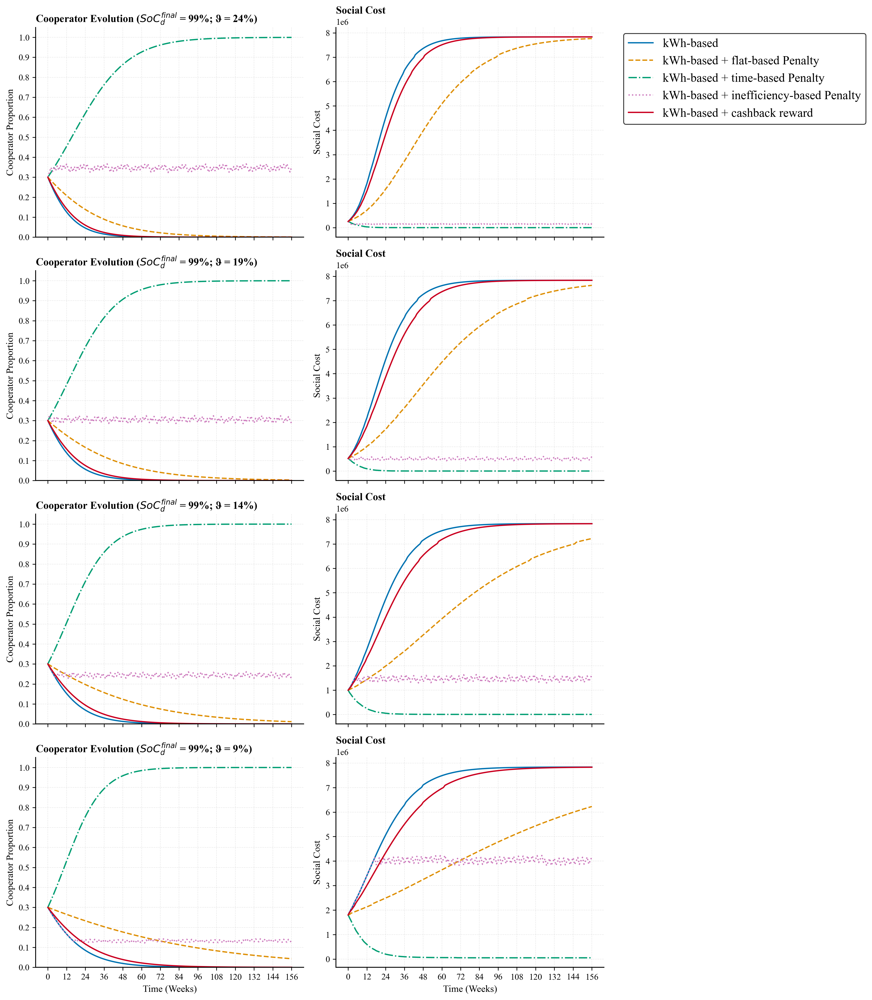

In [58]:
from collections import OrderedDict

# Set publication-quality parameters
plt.rcParams.update({
    'font.family': 'serif',
    'font.serif': ['Times New Roman'],
    'font.size': 10,
    'axes.labelsize': 11,
    'axes.titlesize': 12,
    'xtick.labelsize': 10,
    'ytick.labelsize': 10,
    'legend.fontsize': 9,
    'figure.figsize': (7, 5),
    'figure.dpi': 300,
    'savefig.dpi': 600,
    'savefig.bbox': 'tight',
    'axes.linewidth': 1.0,
    'grid.alpha': 0.3,
    'lines.linewidth': 1.5,
    'lines.markersize': 4
})

# Define color scheme (colorblind-friendly)
colors = ['#0173B2', '#DE8F05', '#029E73', '#CC78BC', '#CA0020']
linestyles = ['-', '--', '-.', ':', '-']

# Create a 4x2 grid: left column = cooperator evolution, right column = social cost
fig, axes = plt.subplots(4, 2, figsize=(14, 16), sharex='col')
keys = sorted(CCS_dict_kwh.keys())

for i, soc in enumerate(keys):
    x_track = CCS_dict_kwh[soc][0]
    net_sc = CCS_dict_kwh[soc][-1]

    # x-axes
    x_range = np.arange(t_init_evo, t_init_evo + len(x_track))
    sc_range = np.arange(t_init_evo, t_init_evo + len(net_sc))

    # Left: cooperator evolution
    axL = axes[i, 0]
    axL.plot(x_range, CCS_dict_kwh[soc][0], label=f'kWh-based', color=colors[0], linestyle=linestyles[0])
    axL.plot(x_range, CCS_dict_flatpen[soc][0], label=f'kWh-based + flat-based Penalty', color=colors[1], linestyle=linestyles[1])
    axL.plot(x_range, CCS_dict_timepen[soc][0], label=f'kWh-based + time-based Penalty', color=colors[2], linestyle=linestyles[2])
    axL.plot(x_range, CCS_dict_congpen[soc][0], label=f'kWh-based + inefficiency-based Penalty', color=colors[3], linestyle=linestyles[3])
    axL.plot(x_range, CCS_dict_cashback[soc][0], label=f'kWh-based + cashback reward', color=colors[4], linestyle=linestyles[4])
    axL.set_ylim(0, 1.05)
    axL.set_ylabel('Cooperator Proportion')
    axL.set_title(f'Cooperator Evolution ($SoC_d^{{final}}$ = 99%; ϑ = {99-soc}%)', loc='left', fontweight='bold')
    axL.grid(True, alpha=0.3, linestyle='--', linewidth=0.5)
    # axL.legend(loc='upper right', frameon=True, edgecolor='black', fontsize=12)
    axL.spines['top'].set_visible(False)
    axL.spines['right'].set_visible(False)
    axL.set_yticks(np.arange(0, 1.1, 0.1))

    # Right: social cost
    axR = axes[i, 1]
    axR.plot(sc_range, CCS_dict_kwh[soc][-1], label=f'kWh-based', color=colors[0], linestyle=linestyles[0])
    axR.plot(sc_range, CCS_dict_flatpen[soc][-1], label=f'kWh-based + flat-based Penalty', color=colors[1], linestyle=linestyles[1])
    axR.plot(sc_range, CCS_dict_timepen[soc][-1], label=f'kWh-based + time-based Penalty', color=colors[2], linestyle=linestyles[2])
    axR.plot(sc_range, CCS_dict_congpen[soc][-1], label=f'kWh-based + inefficiency-based Penalty', color=colors[3], linestyle=linestyles[3])
    axR.plot(sc_range, CCS_dict_cashback[soc][-1], label=f'kWh-based + cashback reward', color=colors[4], linestyle=linestyles[4])
    axR.set_ylabel('Social Cost')
    axR.set_title(f'Social Cost', loc='left', fontweight='bold')
    axR.grid(True, alpha=0.3, linestyle='--', linewidth=0.5)
    # axR.legend(loc='upper left', frameon=True, edgecolor='black', fontsize=12)
    axR.spines['top'].set_visible(False)
    axR.spines['right'].set_visible(False)

    # common x ticks (evolution uses t_init_evo..t_end_evo)
    axL.set_xticks(np.arange(t_init_evo, t_end_evo+1, step=12))
    axR.set_xticks(np.arange(t_init_evo, t_end_evo+1, step=12))

    # Build unique legend from the first social-cost axis (top-right subplot)
    handles, labels = axes[0, 1].get_legend_handles_labels()
    by_label = OrderedDict(zip(labels, handles))

    # Place legend outside the first social cost subplot on the upper-right
    axes[0, 1].legend(by_label.values(), by_label.keys(),
                      loc='upper left', bbox_to_anchor=(1.05, 1.0),
                      frameon=True, edgecolor='black', fontsize=14)

    # Make room on the right so the legend is not cut off
    plt.subplots_adjust(right=0.88)

# Labels for bottom row x-axis
for ax in axes[-1, :]:
    ax.set_xlabel('Time (Weeks)')

plt.tight_layout()
plt.savefig(r"C:\Users\kenny\OneDrive - purdue.edu\Documents\Kenny's File\Transportation Literature\Fall 2024\CE 597 SET\Project\Journal Submission\Figures\Penalties and Reward - 1w3y.png", format='png', dpi=700, bbox_inches='tight')
plt.show()


### Social Penalty

In [59]:
# Global Parameters
CCS_dict_kwh = {
    75:[], 
    80:[],
    85:[],
    90:[],
} # sequence for each SoC target: [[x_track], [mu_avg_track], [NetSc]]

# this is for EVCS operation (minute by minute) on a single day
t_init_evcs = 0 
t_end_evcs = 1439
# this is for EVCS operation (minute by minute) on a single day
t_init_evo = 0 
t_end_evo = 52*3
dt = 1/52 # 1 week worth of behavior change

alpha = 10/60 # value of mobility ($/miles)
beta = 35/60 # value of waiting ($/minutes) -> social cost
vot = 28.16/60 # $/min -> inconvenience cost
# vot = 60/60
C = 8

##### kwh based

In [60]:
## kwh-based
# Strategy evolution over time
for SoCtarget in CCS_dict_kwh.keys():
    x = 0.3
    mu_d = (fast_charge_time(99, SoCinit, tau) + delta)**-1 # charging station's service rate if EV users being defectors (overstaying behavior)
    mu_c = (fast_charge_time(SoCtarget, SoCinit, tau))**-1 # charging station's service rate if EV users being cooperative
    mu_avg = x*mu_c + (1-x)*mu_d
    x_track_kwh = [x]
    mu_avg_track_kwh = [mu_avg]
    for t in range(t_init_evo,t_end_evo):
        payoff_coop,payoff_def = payoff(SoCtarget, SoCinit, alpha, 
                                        EVcap, dist_per_kwh, inconv_time, 
                                        vot, delta, tau, kwhbased=True,
                                        kwh_cost=0.35)
        
        phi = average_payoff(x, payoff_coop, payoff_def)
        dxtdt = dxdt(x, payoff_coop, phi)
        x += dt*dxtdt
        mu_avg = x*mu_c + (1-x)*mu_d

        x_track_kwh.append(x)
        mu_avg_track_kwh.append(mu_avg)

    CCS_dict_kwh[SoCtarget].append(x_track_kwh.copy())
    CCS_dict_kwh[SoCtarget].append(mu_avg_track_kwh.copy())

# Total social cost over the year
for SoCtarget in CCS_dict_kwh.keys():
    NetSc = []
    for mu_avg in CCS_dict_kwh[SoCtarget][1]:
        Wt = workplace_lambda_t[0] # number of EV waiting in the queue at time t -> initial value
        St = 0 # number of EV currently being serviced (fueling) at time t -> initial value
        Wt_track_kwh = [Wt]
        St_track_kwh = [St]
        SCt_track_kwh = []

        for t in range(t_init_evcs,t_end_evcs):
    
            Wt += workplace_lambda_t[t]
            lambda_st = begin_service(sigma, C, St, Wt)
            Wt -= lambda_st
            if Wt < 0:
                Wt = 0
                
            CSRt = CSR(mu_avg, St)
            
            dStdt = lambda_st-CSRt
            St += dStdt
            if St < 0:
                St = 0
                
            Twt_avg = avg_wait(Wt, lambda_st)
            Twt = total_wait(Wt, Twt_avg) 
            SCt = beta*Twt
            
            Wt_track_kwh.append(Wt)
            St_track_kwh.append(St)
            SCt_track_kwh.append(SCt)

        NetSc.append(sum(SCt_track_kwh)*5) # 5 weekdays in a week
        
    CCS_dict_kwh[SoCtarget].append(NetSc.copy())
  

##### kwh based + Type I social penalty 

In [61]:
# Global Parameters
CCS_dict_socpen1 = {
    75:[], 
    80:[],
    85:[],
    90:[],
} # sequence for each SoC target: [[x_track], [mu_avg_track], [NetSc]]

# # this is for EVCS operation (minute by minute) on a single day
# t_init_evcs = 0 
# t_end_evcs = 1439
# # this is for EVCS operation (minute by minute) on a single day
# t_init_evo = 0 
# t_end_evo = 52*3
# dt = 5/(365 - 2*52) # 1 day worth of behavior change

# alpha = 10/60 # value of mobility ($/miles)
# beta = 35/60 # value of waiting ($/minutes) -> social cost
# vot = 28.16/60 # $/min -> inconvenience cost
# # vot = 60/60
# C = 8

socpen1 = 2.5 # ffixed social penalty penalty ($)

In [62]:
## kwh-based + type 1 social penalty
# Strategy evolution over time
for SoCtarget in CCS_dict_socpen1.keys():
    x = 0.3
    mu_d = (fast_charge_time(99, SoCinit, tau) + delta)**-1 # charging station's service rate if EV users being defectors (overstaying behavior)
    mu_c = (fast_charge_time(SoCtarget, SoCinit, tau))**-1 # charging station's service rate if EV users being cooperative
    mu_avg = x*mu_c + (1-x)*mu_d
    x_track_socpen1 = [x]
    mu_avg_track_socpen1 = [mu_avg]
    for t in range(t_init_evo,t_end_evo):
        payoff_coop,payoff_def = payoff(SoCtarget, SoCinit, alpha, 
                                    EVcap, dist_per_kwh, inconv_time, 
                                    vot, delta, tau, kwhbased=True,kwh_cost=0.35,
                                    social_penalty=True,social_pen=socpen1, social_penalty_type=1)
        
        phi = average_payoff(x, payoff_coop, payoff_def)
        dxtdt = dxdt(x, payoff_coop, phi)
        x += dt*dxtdt
        mu_avg = x*mu_c + (1-x)*mu_d

        x_track_socpen1.append(x)
        mu_avg_track_socpen1.append(mu_avg)

    CCS_dict_socpen1[SoCtarget].append(x_track_socpen1.copy())
    CCS_dict_socpen1[SoCtarget].append(mu_avg_track_socpen1.copy())

# Total social cost over the year
for SoCtarget in CCS_dict_socpen1.keys():
    NetSc = []
    for mu_avg in CCS_dict_socpen1[SoCtarget][1]:
        Wt = workplace_lambda_t[0] # number of EV waiting in the queue at time t -> initial value
        St = 0 # number of EV currently being serviced (fueling) at time t -> initial value
        Wt_track_socpen1 = [Wt]
        St_track_socpen1 = [St]
        SCt_track_socpen1 = []

        for t in range(t_init_evcs,t_end_evcs):
    
            Wt += workplace_lambda_t[t]
            lambda_st = begin_service(sigma, C, St, Wt)
            Wt -= lambda_st
            if Wt < 0:
                Wt = 0
                
            CSRt = CSR(mu_avg, St)
            
            dStdt = lambda_st-CSRt
            St += dStdt
            if St < 0:
                St = 0
                
            Twt_avg = avg_wait(Wt, lambda_st)
            Twt = total_wait(Wt, Twt_avg) 
            SCt = beta*Twt

            Wt_track_socpen1.append(Wt)
            St_track_socpen1.append(St)
            SCt_track_socpen1.append(SCt)

        NetSc.append(sum(SCt_track_socpen1)*5) # 5 weekdays in a week

    CCS_dict_socpen1[SoCtarget].append(NetSc.copy())


##### kwh based + Type II social penalty

In [63]:
# Global Parameters
CCS_dict_socpen2 = {
    75:[], 
    80:[],
    85:[],
    90:[],
} # sequence for each SoC target: [[x_track], [mu_avg_track], [NetSc]]

# # this is for EVCS operation (minute by minute) on a single day
# t_init_evcs = 0 
# t_end_evcs = 1439
# # this is for EVCS operation (minute by minute) on a single day
# t_init_evo = 0 
# t_end_evo = 52*3
# dt = 5/(365 - 2*52) # 1 week worth of behavior change

# alpha = 10/60 # value of mobility ($/miles)
# beta = 35/60 # value of waiting ($/minutes) -> social cost
# vot = 28.16/60 # $/min -> inconvenience cost
# # vot = 60/60
# C = 8

socpen2 = 20 # social penalty proportional to x ($)

In [64]:
## kwh-based + type 2 social penalty
# Strategy evolution over time
for SoCtarget in CCS_dict_socpen2.keys():
    x = 0.3
    mu_d = (fast_charge_time(99, SoCinit, tau) + delta)**-1 # charging station's service rate if EV users being defectors (overstaying behavior)
    mu_c = (fast_charge_time(SoCtarget, SoCinit, tau))**-1 # charging station's service rate if EV users being cooperative
    mu_avg = x*mu_c + (1-x)*mu_d
    x_track_socpen2 = [x]
    mu_avg_track_socpen2 = [mu_avg]
    for t in range(t_init_evo,t_end_evo):
        payoff_coop,payoff_def = payoff(SoCtarget, SoCinit, alpha, 
                                    EVcap, dist_per_kwh, inconv_time, 
                                    vot, delta, tau, kwhbased=True,kwh_cost=0.35,
                                    social_penalty=True, social_pen=socpen2, social_penalty_type=2, coop_prop=x)
        
        phi = average_payoff(x, payoff_coop, payoff_def)
        dxtdt = dxdt(x, payoff_coop, phi)
        x += dt*dxtdt
        mu_avg = x*mu_c + (1-x)*mu_d

        x_track_socpen2.append(x)
        mu_avg_track_socpen2.append(mu_avg)

    CCS_dict_socpen2[SoCtarget].append(x_track_socpen2.copy())
    CCS_dict_socpen2[SoCtarget].append(mu_avg_track_socpen2.copy())

# Total social cost over the year
for SoCtarget in CCS_dict_socpen2.keys():
    NetSc = []
    for mu_avg in CCS_dict_socpen2[SoCtarget][1]:
        Wt = workplace_lambda_t[0] # number of EV waiting in the queue at time t -> initial value
        St = 0 # number of EV currently being serviced (fueling) at time t -> initial value
        Wt_track_socpen2 = [Wt]
        St_track_socpen2 = [St]
        SCt_track_socpen2 = []

        for t in range(t_init_evcs,t_end_evcs):
    
            Wt += workplace_lambda_t[t]
            lambda_st = begin_service(sigma, C, St, Wt)
            Wt -= lambda_st
            if Wt < 0:
                Wt = 0
                
            CSRt = CSR(mu_avg, St)
            
            dStdt = lambda_st-CSRt
            St += dStdt
            if St < 0:
                St = 0
                
            Twt_avg = avg_wait(Wt, lambda_st)
            Twt = total_wait(Wt, Twt_avg) 
            SCt = beta*Twt

            Wt_track_socpen2.append(Wt)
            St_track_socpen2.append(St)
            SCt_track_socpen2.append(SCt)

        NetSc.append(sum(SCt_track_socpen2)*5) # 5 weekdays in a week

    CCS_dict_socpen2[SoCtarget].append(NetSc.copy())


##### kwh based + Type III Social Penalty

In [65]:
# Global Parameters
CCS_dict_socpen3 = {
    75:[[],[],[]], 
    80:[[],[],[]],
    85:[[],[],[]],
    90:[[],[],[]],
} # sequence for each SoC target: [[x_track], [mu_avg_track], [NetSc]]

# # this is for EVCS operation (minute by minute) on a single day
# t_init_evcs = 0 
# t_end_evcs = 1439
# # this is for EVCS operation (minute by minute) on a single day
# t_init_evo = 0 
# t_end_evo = 52*3
# dt = 5/(365 - 2*52) # 1 week worth of behavior change

# alpha = 10/60 # value of mobility ($/miles)
# beta = 35/60 # value of waiting ($/minutes) -> social cost
# vot = 28.16/60 # $/min -> inconvenience cost
# # vot = 60/60
# C = 8

socpen3 = 20 # social penalty proportional to x ($)

In [66]:
SC_dict_socpen3 = {
    75:[], 
    80:[],
    85:[],
    90:[],
} # sequence for net social costs for each SoC target: [NetSc_min, NetSc_max]

In [67]:

# numerical simulation for best scenario (everyone is cooperative)
for SoCtarget in SC_dict_socpen3.keys():
    mu_avg = (fast_charge_time(SoCtarget, SoCinit, tau))**-1 # best scenario
    Wt = workplace_lambda_t[0] # number of EV waiting in the queue at time t -> initial value
    St = 0 # number of EV currently being serviced (fueling) at time t -> initial value
    Wt_track_socpen3 = [Wt]
    St_track_socpen3 = [St]
    SCt_track_socpen3 = []

    for t in range(t_init_evcs,t_end_evcs):

        Wt += workplace_lambda_t[t]
        lambda_st = begin_service(sigma, C, St, Wt)
        Wt -= lambda_st
        if Wt < 0:
            Wt = 0
            
        CSRt = CSR(mu_avg, St)
        
        dStdt = lambda_st-CSRt
        St += dStdt
        if St < 0:
            St = 0
            
        Twt_avg = avg_wait(Wt, lambda_st)
        Twt = total_wait(Wt, Twt_avg) 
        SCt = beta*Twt

        Wt_track_socpen3.append(Wt)
        St_track_socpen3.append(St)
        SCt_track_socpen3.append(SCt)

    SC_dict_socpen3[SoCtarget].append(sum(SCt_track_socpen3)*5) # 5 days in a week

# numerical simulation for worst scenario (everyone is defector)
for SoCtarget in SC_dict_socpen3.keys():
    mu_avg = (fast_charge_time(99, SoCinit, tau))**-1 # worst scenario
    Wt = workplace_lambda_t[0] # number of EV waiting in the queue at time t -> initial value
    St = 0 # number of EV currently being serviced (fueling) at time t -> initial value
    Wt_track_socpen3 = [Wt]
    St_track_socpen3 = [St]
    SCt_track_socpen3 = []

    for t in range(t_init_evcs,t_end_evcs):

        Wt += workplace_lambda_t[t]
        lambda_st = begin_service(sigma, C, St, Wt)
        Wt -= lambda_st
        if Wt < 0:
            Wt = 0
            
        CSRt = CSR(mu_avg, St)
        
        dStdt = lambda_st-CSRt
        St += dStdt
        if St < 0:
            St = 0
            
        Twt_avg = avg_wait(Wt, lambda_st)
        Twt = total_wait(Wt, Twt_avg) 
        SCt = beta*Twt

        Wt_track_socpen3.append(Wt)
        St_track_socpen3.append(St)
        SCt_track_socpen3.append(SCt)

    SC_dict_socpen3[SoCtarget].append(sum(SCt_track_socpen3)*5) # 5 days in a week

In [68]:
## kwh-based + Type III penalty
# Strategy evolution over time
for SoCtarget in CCS_dict_socpen3.keys():
    # initialization
    x = 0.3
    CCS_dict_socpen3[SoCtarget][0].append(x)
    mu_d = (fast_charge_time(99, SoCinit, tau) + delta)**-1 # charging station's service rate if EV users being defectors (overstaying behavior)
    mu_c = (fast_charge_time(SoCtarget, SoCinit, tau))**-1 # charging station's service rate if EV users being cooperative
    mu_avg = x*mu_c + (1-x)*mu_d
    CCS_dict_socpen3[SoCtarget][1].append(mu_avg)
    # x_track_socpen3 = [x]
    # mu_avg_track_socpen3 = [mu_avg]
    Wt = workplace_lambda_t[0] # number of EV waiting in the queue at time t -> initial value
    St = 0 # number of EV currently being serviced (fueling) at time t -> initial value
    Wt_track_socpen3 = [Wt]
    St_track_socpen3 = [St]
    SCt_track_socpen3 = []
    for t_operate in range(t_init_evcs, t_end_evcs):
        Wt += workplace_lambda_t[t_operate]
        lambda_st = begin_service(sigma, C, St, Wt)
        Wt -= lambda_st
        if Wt < 0:
            Wt = 0
            
        CSRt = CSR(mu_avg, St)
        
        dStdt = lambda_st-CSRt
        St += dStdt
        if St < 0:
            St = 0
            
        Twt_avg = avg_wait(Wt, lambda_st)
        Twt = total_wait(Wt, Twt_avg) 
        SCt = beta*Twt
        
        Wt_track_socpen3.append(Wt)
        St_track_socpen3.append(St)
        SCt_track_socpen3.append(SCt)

    CCS_dict_socpen3[SoCtarget][2].append(sum(SCt_track_socpen3)*5)

    # update
    for t in range(t_init_evo,t_end_evo):
        payoff_coop,payoff_def = payoff(SoCtarget, SoCinit, alpha, 
                                    EVcap, dist_per_kwh, inconv_time, 
                                    vot, delta, tau, kwhbased=True,
                                    kwh_cost=0.35, social_penalty=True, social_pen=socpen3, social_penalty_type=6,
                                    SC=CCS_dict_socpen3[SoCtarget][2][-1],
                                    SC_max=SC_dict_socpen3[SoCtarget][-1],
                                    SC_min=SC_dict_socpen3[SoCtarget][0]) # need to do something (create new function)
        
        phi = average_payoff(x, payoff_coop, payoff_def)
        dxtdt = dxdt(x, payoff_coop, phi)
        x += dt*dxtdt
        mu_avg = x*mu_c + (1-x)*mu_d

        # x_track_socpen3.append(x)
        # mu_avg_track_socpen3.append(mu_avg)

        CCS_dict_socpen3[SoCtarget][0].append(x)
        CCS_dict_socpen3[SoCtarget][1].append(mu_avg)

        # for SoCtarget in CCS_dict_socpen3.keys():

        Wt = workplace_lambda_t[0] # number of EV waiting in the queue at time t -> initial value
        St = 0 # number of EV currently being serviced (fueling) at time t -> initial value
        Wt_track_socpen3 = [Wt]
        St_track_socpen3 = [St]
        SCt_track_socpen3 = []
        for t_operate in range(t_init_evcs, t_end_evcs):
            Wt += workplace_lambda_t[t_operate]
            lambda_st = begin_service(sigma, C, St, Wt)
            Wt -= lambda_st
            if Wt < 0:
                Wt = 0
                
            CSRt = CSR(mu_avg, St)
            
            dStdt = lambda_st-CSRt
            St += dStdt
            if St < 0:
                St = 0
                
            Twt_avg = avg_wait(Wt, lambda_st)
            Twt = total_wait(Wt, Twt_avg) 
            SCt = beta*Twt
            
            Wt_track_socpen3.append(Wt)
            St_track_socpen3.append(St)
            SCt_track_socpen3.append(SCt)

        CCS_dict_socpen3[SoCtarget][2].append(sum(SCt_track_socpen3)*5)  # social cost for each week (5 weekdays)
  

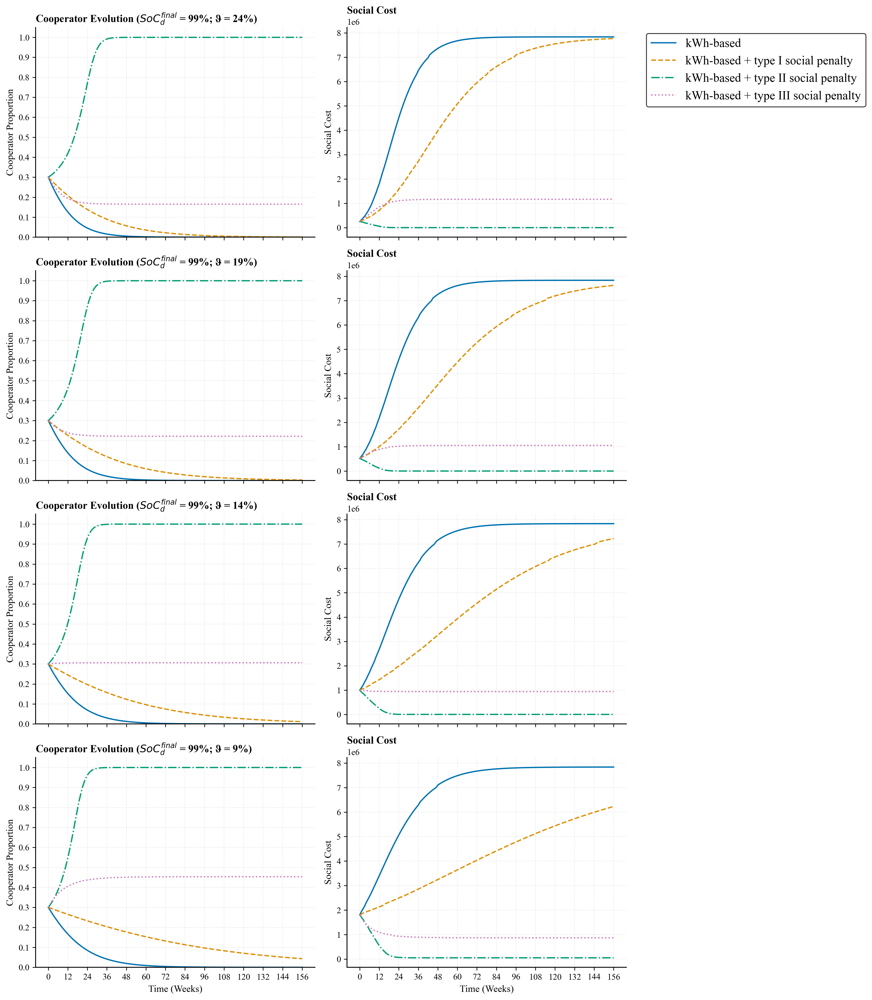

In [69]:
from collections import OrderedDict

# Set publication-quality parameters
plt.rcParams.update({
    'font.family': 'serif',
    'font.serif': ['Times New Roman'],
    'font.size': 10,
    'axes.labelsize': 11,
    'axes.titlesize': 12,
    'xtick.labelsize': 10,
    'ytick.labelsize': 10,
    'legend.fontsize': 9,
    'figure.figsize': (7, 5),
    'figure.dpi': 300,
    'savefig.dpi': 600,
    'savefig.bbox': 'tight',
    'axes.linewidth': 1.0,
    'grid.alpha': 0.3,
    'lines.linewidth': 1.5,
    'lines.markersize': 4
})

# Define color scheme (colorblind-friendly)
colors = ['#0173B2', '#DE8F05', '#029E73', '#CC78BC', '#CA0020']
linestyles = ['-', '--', '-.', ':', '-']

# Create a 4x2 grid: left column = cooperator evolution, right column = social cost
fig, axes = plt.subplots(4, 2, figsize=(14, 16), sharex='col')
keys = sorted(CCS_dict_kwh.keys())

for i, soc in enumerate(keys):
    x_track = CCS_dict_kwh[soc][0]
    net_sc = CCS_dict_kwh[soc][-1]

    # x-axes
    x_range = np.arange(t_init_evo, t_init_evo + len(x_track))
    sc_range = np.arange(t_init_evo, t_init_evo + len(net_sc))

    # Left: cooperator evolution
    axL = axes[i, 0]
    axL.plot(x_range, CCS_dict_kwh[soc][0], label=f'kWh-based', color=colors[0], linestyle=linestyles[0])
    axL.plot(x_range, CCS_dict_socpen1[soc][0], label=f'kWh-based + type I social penalty', color=colors[1], linestyle=linestyles[1])
    axL.plot(x_range, CCS_dict_socpen2[soc][0], label=f'kWh-based + type II social penalty', color=colors[2], linestyle=linestyles[2])
    axL.plot(x_range, CCS_dict_socpen3[soc][0], label=f'kWh-based + type III social penalty', color=colors[3], linestyle=linestyles[3])
    axL.set_ylim(0, 1.05)
    axL.set_ylabel('Cooperator Proportion')
    axL.set_title(f'Cooperator Evolution ($SoC_d^{{final}}$ = 99%; ϑ = {99-soc}%)', loc='left', fontweight='bold')
    axL.grid(True, alpha=0.3, linestyle='--', linewidth=0.5)
    # axL.legend(loc='upper right', frameon=True, edgecolor='black', fontsize=12)
    axL.spines['top'].set_visible(False)
    axL.spines['right'].set_visible(False)
    axL.set_yticks(np.arange(0, 1.1, 0.1))

    # Right: social cost
    axR = axes[i, 1]
    axR.plot(sc_range, CCS_dict_kwh[soc][-1], label=f'kWh-based', color=colors[0], linestyle=linestyles[0])
    axR.plot(sc_range, CCS_dict_socpen1[soc][-1], label=f'kWh-based + type I social penalty', color=colors[1], linestyle=linestyles[1])
    axR.plot(sc_range, CCS_dict_socpen2[soc][-1], label=f'kWh-based + type II social penalty', color=colors[2], linestyle=linestyles[2])
    axR.plot(sc_range, CCS_dict_socpen3[soc][-1], label=f'kWh-based + type III social penalty', color=colors[3], linestyle=linestyles[3])
    axR.set_ylabel('Social Cost')
    axR.set_title(f'Social Cost', loc='left', fontweight='bold')
    axR.grid(True, alpha=0.3, linestyle='--', linewidth=0.5)
    # axR.legend(loc='upper left', frameon=True, edgecolor='black', fontsize=12)
    axR.spines['top'].set_visible(False)
    axR.spines['right'].set_visible(False)

    # common x ticks (evolution uses t_init_evo..t_end_evo)
    axL.set_xticks(np.arange(t_init_evo, t_end_evo+1, step=12))
    axR.set_xticks(np.arange(t_init_evo, t_end_evo+1, step=12))

    # Build unique legend from the first social-cost axis (top-right subplot)
    handles, labels = axes[0, 1].get_legend_handles_labels()
    by_label = OrderedDict(zip(labels, handles))

    # Place legend outside the first social cost subplot on the upper-right
    axes[0, 1].legend(by_label.values(), by_label.keys(),
                      loc='upper left', bbox_to_anchor=(1.05, 1.0),
                      frameon=True, edgecolor='black', fontsize=14)

    # Make room on the right so the legend is not cut off
    plt.subplots_adjust(right=0.88)

# Labels for bottom row x-axis
for ax in axes[-1, :]:
    ax.set_xlabel('Time (Weeks)')

plt.tight_layout()
plt.savefig(r"C:\Users\kenny\OneDrive - purdue.edu\Documents\Kenny's File\Transportation Literature\Fall 2024\CE 597 SET\Project\Journal Submission\Figures\Social Penalties - 1w3y.png", format='png', dpi=700, bbox_inches='tight')
plt.show()


### Regime Resilience

##### kWh-based (benchmark)

In [70]:
# Global Parameters
CCS_dict_kwh = {
    75:[], 
    80:[],
    85:[],
    90:[],
} # sequence for each SoC target: [[x_track], [mu_avg_track], [NetSc]]

# this is for EVCS operation (minute by minute) on a single day
t_init_evcs = 0 
t_end_evcs = 1439
# this is for EVCS operation (minute by minute) on a single day
t_init_evo = 0 
t_end_evo = 52*3
dt = 1/52 # 1 week worth of behavior change

alpha = 10/60 # value of mobility ($/miles)
beta = 35/60 # value of waiting ($/minutes) -> social cost
vot = 28.16/60 # $/min -> inconvenience cost
# vot = 60/60
C = 8

cutoff_time = 52 # weeks
x = 0.3

In [71]:
## kwh-based
# Strategy evolution over time
for SoCtarget in CCS_dict_kwh.keys():
    x = 0.3
    mu_d = (fast_charge_time(99, SoCinit, tau) + delta)**-1 # charging station's service rate if EV users being defectors (overstaying behavior)
    mu_c = (fast_charge_time(SoCtarget, SoCinit, tau))**-1 # charging station's service rate if EV users being cooperative
    mu_avg = x*mu_c + (1-x)*mu_d
    x_track_kwh = [x]
    mu_avg_track_kwh = [mu_avg]
    for t in range(t_init_evo,t_end_evo):
        payoff_coop,payoff_def = payoff(SoCtarget, SoCinit, alpha, 
                                        EVcap, dist_per_kwh, inconv_time, 
                                        vot, delta, tau, kwhbased=True,
                                        kwh_cost=0.35)
        
        phi = average_payoff(x, payoff_coop, payoff_def)
        dxtdt = dxdt(x, payoff_coop, phi)
        x += dt*dxtdt
        mu_avg = x*mu_c + (1-x)*mu_d

        x_track_kwh.append(x)
        mu_avg_track_kwh.append(mu_avg)

    CCS_dict_kwh[SoCtarget].append(x_track_kwh.copy())
    CCS_dict_kwh[SoCtarget].append(mu_avg_track_kwh.copy())

# Total social cost over the year
for SoCtarget in CCS_dict_kwh.keys():
    NetSc = []
    for mu_avg in CCS_dict_kwh[SoCtarget][1]:
        Wt = workplace_lambda_t[0] # number of EV waiting in the queue at time t -> initial value
        St = 0 # number of EV currently being serviced (fueling) at time t -> initial value
        Wt_track_kwh = [Wt]
        St_track_kwh = [St]
        SCt_track_kwh = []

        for t in range(t_init_evcs,t_end_evcs):
    
            Wt += workplace_lambda_t[t]
            lambda_st = begin_service(sigma, C, St, Wt)
            Wt -= lambda_st
            if Wt < 0:
                Wt = 0
                
            CSRt = CSR(mu_avg, St)
            
            dStdt = lambda_st-CSRt
            St += dStdt
            if St < 0:
                St = 0
                
            Twt_avg = avg_wait(Wt, lambda_st)
            Twt = total_wait(Wt, Twt_avg) 
            SCt = beta*Twt
            
            Wt_track_kwh.append(Wt)
            St_track_kwh.append(St)
            SCt_track_kwh.append(SCt)

        NetSc.append(sum(SCt_track_kwh)*5) # 5 weekdays in a week
        
    CCS_dict_kwh[SoCtarget].append(NetSc.copy())
  

##### kWh + $0.1/min penalty (with cutoff)

In [72]:
# Global Parameters
CCS_dict_timepen_01 = {
    75:[], 
    80:[],
    85:[],
    90:[],
} # sequence for each SoC target: [[x_track], [mu_avg_track], [NetSc]]

# # this is for EVCS operation (minute by minute) on a single day
# t_init_evcs = 0 
# t_end_evcs = 1439
# # this is for EVCS operation (minute by minute) on a single day
# # t_init_evo = 0 
# # t_end_evo = 365
# # dt = 1/365 # 1 day worth of behavior change

# alpha = 10/60 # value of mobility ($/miles)
# beta = 35/60 # value of waiting ($/minutes) -> social cost
# vot = 28.16/60 # $/min -> inconvenience cost
# # vot = 60/60
# C = 8

# # cutoff_time = 180 # days
# x = 0.3

In [73]:
## kwh-based + time-based penalty (0.1 $/min after cutoff time)
# Strategy evolution over time
for SoCtarget in CCS_dict_timepen_01.keys():
    x = 0.3
    mu_d = (fast_charge_time(99, SoCinit, tau) + delta)**-1 # charging station's service rate if EV users being defectors (overstaying behavior)
    mu_c = (fast_charge_time(SoCtarget, SoCinit, tau))**-1 # charging station's service rate if EV users being cooperative
    mu_avg = x*mu_c + (1-x)*mu_d
    x_track_timepen_01 = [x]
    mu_avg_track_timepen_01 = [mu_avg]
    for t in range(t_init_evo,t_end_evo):
        if t >= cutoff_time:
            payoff_coop,payoff_def = payoff(SoCtarget, SoCinit, alpha, 
                                            EVcap, dist_per_kwh, inconv_time, 
                                            vot, delta, tau, kwhbased=True,
                                            kwh_cost=0.35, time_penalty=True, time_cost_pen=0.1)
        else:
            payoff_coop,payoff_def = payoff(SoCtarget, SoCinit, alpha, 
                                            EVcap, dist_per_kwh, inconv_time, 
                                            vot, delta, tau, kwhbased=True,
                                            kwh_cost=0.35)
        
        phi = average_payoff(x, payoff_coop, payoff_def)
        dxtdt = dxdt(x, payoff_coop, phi)
        x += dt*dxtdt
        mu_avg = x*mu_c + (1-x)*mu_d

        x_track_timepen_01.append(x)
        mu_avg_track_timepen_01.append(mu_avg)

    CCS_dict_timepen_01[SoCtarget].append(x_track_timepen_01.copy())
    CCS_dict_timepen_01[SoCtarget].append(mu_avg_track_timepen_01.copy())

# Total social cost over the year
for SoCtarget in CCS_dict_timepen_01.keys():
    NetSc = []
    for mu_avg in CCS_dict_timepen_01[SoCtarget][1]:
        Wt = workplace_lambda_t[0] # number of EV waiting in the queue at time t -> initial value
        St = 0 # number of EV currently being serviced (fueling) at time t -> initial value
        Wt_track_timepen_01 = [Wt]
        St_track_timepen_01 = [St]
        SCt_track_timepen_01 = []

        for t in range(t_init_evcs,t_end_evcs):
    
            Wt += workplace_lambda_t[t]
            lambda_st = begin_service(sigma, C, St, Wt)
            Wt -= lambda_st
            if Wt < 0:
                Wt = 0
                
            CSRt = CSR(mu_avg, St)
            
            dStdt = lambda_st-CSRt
            St += dStdt
            if St < 0:
                St = 0
                
            Twt_avg = avg_wait(Wt, lambda_st)
            Twt = total_wait(Wt, Twt_avg) 
            SCt = beta*Twt
            
            Wt_track_timepen_01.append(Wt)
            St_track_timepen_01.append(St)
            SCt_track_timepen_01.append(SCt)

        NetSc.append(sum(SCt_track_timepen_01)*5) # 5 weekdays in a week

    CCS_dict_timepen_01[SoCtarget].append(NetSc.copy())
  

##### kWh + $0.1/min penalty (with cutoff)

In [74]:
# Global Parameters
CCS_dict_timepen_025 = {
    75:[], 
    80:[],
    85:[],
    90:[],
} # sequence for each SoC target: [[x_track], [mu_avg_track], [NetSc]]

# # this is for EVCS operation (minute by minute) on a single day
# t_init_evcs = 0 
# t_end_evcs = 1439
# # this is for EVCS operation (minute by minute) on a single day
# # t_init_evo = 0 
# # t_end_evo = 365
# # dt = 1/365 # 1 day worth of behavior change

# alpha = 10/60 # value of mobility ($/miles)
# beta = 35/60 # value of waiting ($/minutes) -> social cost
# vot = 28.16/60 # $/min -> inconvenience cost
# # vot = 60/60
# C = 8

# # cutoff_time = 180 # days
# x = 0.3

In [75]:
## kwh-based + time-based penalty (0.25 $/min after cutoff time)
# Strategy evolution over time
for SoCtarget in CCS_dict_timepen_025.keys():
    x = 0.3
    mu_d = (fast_charge_time(99, SoCinit, tau) + delta)**-1 # charging station's service rate if EV users being defectors (overstaying behavior)
    mu_c = (fast_charge_time(SoCtarget, SoCinit, tau))**-1 # charging station's service rate if EV users being cooperative
    mu_avg = x*mu_c + (1-x)*mu_d
    x_track_timepen_025 = [x]
    mu_avg_track_timepen_025 = [mu_avg]
    for t in range(t_init_evo,t_end_evo):
        if t >= cutoff_time:
            payoff_coop,payoff_def = payoff(SoCtarget, SoCinit, alpha, 
                                            EVcap, dist_per_kwh, inconv_time, 
                                            vot, delta, tau, kwhbased=True,
                                            kwh_cost=0.35, time_penalty=True, time_cost_pen=0.25)
        else:
            payoff_coop,payoff_def = payoff(SoCtarget, SoCinit, alpha, 
                                            EVcap, dist_per_kwh, inconv_time, 
                                            vot, delta, tau, kwhbased=True,
                                            kwh_cost=0.35)
        
        phi = average_payoff(x, payoff_coop, payoff_def)
        dxtdt = dxdt(x, payoff_coop, phi)
        x += dt*dxtdt
        mu_avg = x*mu_c + (1-x)*mu_d

        x_track_timepen_025.append(x)
        mu_avg_track_timepen_025.append(mu_avg)

    CCS_dict_timepen_025[SoCtarget].append(x_track_timepen_025.copy())
    CCS_dict_timepen_025[SoCtarget].append(mu_avg_track_timepen_025.copy())

# Total social cost over the year
for SoCtarget in CCS_dict_timepen_025.keys():
    NetSc = []
    for mu_avg in CCS_dict_timepen_025[SoCtarget][1]:
        Wt = workplace_lambda_t[0] # number of EV waiting in the queue at time t -> initial value
        St = 0 # number of EV currently being serviced (fueling) at time t -> initial value
        Wt_track_timepen_025 = [Wt]
        St_track_timepen_025 = [St]
        SCt_track_timepen_025 = []

        for t in range(t_init_evcs,t_end_evcs):
    
            Wt += workplace_lambda_t[t]
            lambda_st = begin_service(sigma, C, St, Wt)
            Wt -= lambda_st
            if Wt < 0:
                Wt = 0
                
            CSRt = CSR(mu_avg, St)
            
            dStdt = lambda_st-CSRt
            St += dStdt
            if St < 0:
                St = 0
                
            Twt_avg = avg_wait(Wt, lambda_st)
            Twt = total_wait(Wt, Twt_avg) 
            SCt = beta*Twt
            
            Wt_track_timepen_025.append(Wt)
            St_track_timepen_025.append(St)
            SCt_track_timepen_025.append(SCt)

        NetSc.append(sum(SCt_track_timepen_025)*5) # 5 weekdays in a week

    CCS_dict_timepen_025[SoCtarget].append(NetSc.copy())
  

##### kWh + $0.5/min penalty (with cutoff)

In [76]:
# Global Parameters
CCS_dict_timepen_05 = {
    75:[], 
    80:[],
    85:[],
    90:[],
} # sequence for each SoC target: [[x_track], [mu_avg_track], [NetSc]]

# # this is for EVCS operation (minute by minute) on a single day
# t_init_evcs = 0 
# t_end_evcs = 1439
# # this is for EVCS operation (minute by minute) on a single day
# # t_init_evo = 0 
# # t_end_evo = 365
# # dt = 1/365 # 1 day worth of behavior change

# alpha = 10/60 # value of mobility ($/miles)
# beta = 35/60 # value of waiting ($/minutes) -> social cost
# vot = 28.16/60 # $/min -> inconvenience cost
# # vot = 60/60
# C = 8

# # cutoff_time = 180 # days
# x = 0.3

In [77]:
## kwh-based + time-based penalty (0.5 $/min after cutoff time)
# Strategy evolution over time
for SoCtarget in CCS_dict_timepen_05.keys():
    x = 0.3
    mu_d = (fast_charge_time(99, SoCinit, tau) + delta)**-1 # charging station's service rate if EV users being defectors (overstaying behavior)
    mu_c = (fast_charge_time(SoCtarget, SoCinit, tau))**-1 # charging station's service rate if EV users being cooperative
    mu_avg = x*mu_c + (1-x)*mu_d
    x_track_timepen_05 = [x]
    mu_avg_track_timepen_05 = [mu_avg]
    for t in range(t_init_evo,t_end_evo):
        if t >= cutoff_time:
            payoff_coop,payoff_def = payoff(SoCtarget, SoCinit, alpha, 
                                            EVcap, dist_per_kwh, inconv_time, 
                                            vot, delta, tau, kwhbased=True,
                                            kwh_cost=0.35, time_penalty=True, time_cost_pen=0.5)
        else:
            payoff_coop,payoff_def = payoff(SoCtarget, SoCinit, alpha, 
                                            EVcap, dist_per_kwh, inconv_time, 
                                            vot, delta, tau, kwhbased=True,
                                            kwh_cost=0.35)
        
        phi = average_payoff(x, payoff_coop, payoff_def)
        dxtdt = dxdt(x, payoff_coop, phi)
        x += dt*dxtdt
        mu_avg = x*mu_c + (1-x)*mu_d

        x_track_timepen_05.append(x)
        mu_avg_track_timepen_05.append(mu_avg)

    CCS_dict_timepen_05[SoCtarget].append(x_track_timepen_05.copy())
    CCS_dict_timepen_05[SoCtarget].append(mu_avg_track_timepen_05.copy())

# Total social cost over the year
for SoCtarget in CCS_dict_timepen_05.keys():
    NetSc = []
    for mu_avg in CCS_dict_timepen_05[SoCtarget][1]:
        Wt = workplace_lambda_t[0] # number of EV waiting in the queue at time t -> initial value
        St = 0 # number of EV currently being serviced (fueling) at time t -> initial value
        Wt_track_timepen_05 = [Wt]
        St_track_timepen_05 = [St]
        SCt_track_timepen_05 = []

        for t in range(t_init_evcs,t_end_evcs):
    
            Wt += workplace_lambda_t[t]
            lambda_st = begin_service(sigma, C, St, Wt)
            Wt -= lambda_st
            if Wt < 0:
                Wt = 0
                
            CSRt = CSR(mu_avg, St)
            
            dStdt = lambda_st-CSRt
            St += dStdt
            if St < 0:
                St = 0
                
            Twt_avg = avg_wait(Wt, lambda_st)
            Twt = total_wait(Wt, Twt_avg) 
            SCt = beta*Twt
            
            Wt_track_timepen_05.append(Wt)
            St_track_timepen_05.append(St)
            SCt_track_timepen_05.append(SCt)

        NetSc.append(sum(SCt_track_timepen_05)*5) # 5 weekdays in a week

    CCS_dict_timepen_05[SoCtarget].append(NetSc.copy())


##### kWh + $0.75/min penalty (with cutoff)

In [78]:
# Global Parameters
CCS_dict_timepen_075 = {
    75:[], 
    80:[],
    85:[],
    90:[],
} # sequence for each SoC target: [[x_track], [mu_avg_track], [NetSc]]

# # this is for EVCS operation (minute by minute) on a single day
# t_init_evcs = 0 
# t_end_evcs = 1439
# # this is for EVCS operation (minute by minute) on a single day
# # t_init_evo = 0 
# # t_end_evo = 365
# # dt = 1/365 # 1 day worth of behavior change

# alpha = 10/60 # value of mobility ($/miles)
# beta = 35/60 # value of waiting ($/minutes) -> social cost
# vot = 28.16/60 # $/min -> inconvenience cost
# # vot = 60/60
# C = 8

# # cutoff_time = 180 # days
# x = 0.3

In [79]:
## kwh-based + time-based penalty (0.75 $/min after cutoff time)
# Strategy evolution over time
for SoCtarget in CCS_dict_timepen_075.keys():
    x = 0.3
    mu_d = (fast_charge_time(99, SoCinit, tau) + delta)**-1 # charging station's service rate if EV users being defectors (overstaying behavior)
    mu_c = (fast_charge_time(SoCtarget, SoCinit, tau))**-1 # charging station's service rate if EV users being cooperative
    mu_avg = x*mu_c + (1-x)*mu_d
    x_track_timepen_075 = [x]
    mu_avg_track_timepen_075 = [mu_avg]
    for t in range(t_init_evo,t_end_evo):
        if t >= cutoff_time:
            payoff_coop,payoff_def = payoff(SoCtarget, SoCinit, alpha, 
                                            EVcap, dist_per_kwh, inconv_time, 
                                            vot, delta, tau, kwhbased=True,
                                            kwh_cost=0.35, time_penalty=True, time_cost_pen=0.75)
        else:
            payoff_coop,payoff_def = payoff(SoCtarget, SoCinit, alpha, 
                                            EVcap, dist_per_kwh, inconv_time, 
                                            vot, delta, tau, kwhbased=True,
                                            kwh_cost=0.35)
        
        phi = average_payoff(x, payoff_coop, payoff_def)
        dxtdt = dxdt(x, payoff_coop, phi)
        x += dt*dxtdt
        mu_avg = x*mu_c + (1-x)*mu_d

        x_track_timepen_075.append(x)
        mu_avg_track_timepen_075.append(mu_avg)

    CCS_dict_timepen_075[SoCtarget].append(x_track_timepen_075.copy())
    CCS_dict_timepen_075[SoCtarget].append(mu_avg_track_timepen_075.copy())

# Total social cost over the year
for SoCtarget in CCS_dict_timepen_075.keys():
    NetSc = []
    for mu_avg in CCS_dict_timepen_075[SoCtarget][1]:
        Wt = workplace_lambda_t[0] # number of EV waiting in the queue at time t -> initial value
        St = 0 # number of EV currently being serviced (fueling) at time t -> initial value
        Wt_track_timepen_075 = [Wt]
        St_track_timepen_075 = [St]
        SCt_track_timepen_075 = []

        for t in range(t_init_evcs,t_end_evcs):
    
            Wt += workplace_lambda_t[t]
            lambda_st = begin_service(sigma, C, St, Wt)
            Wt -= lambda_st
            if Wt < 0:
                Wt = 0
                
            CSRt = CSR(mu_avg, St)
            
            dStdt = lambda_st-CSRt
            St += dStdt
            if St < 0:
                St = 0
                
            Twt_avg = avg_wait(Wt, lambda_st)
            Twt = total_wait(Wt, Twt_avg) 
            SCt = beta*Twt
            
            Wt_track_timepen_075.append(Wt)
            St_track_timepen_075.append(St)
            SCt_track_timepen_075.append(SCt)

        NetSc.append(sum(SCt_track_timepen_075)*5) # 5 weekdays in a week

    CCS_dict_timepen_075[SoCtarget].append(NetSc.copy())


##### kWh + $1/min penalty (with cutoff)

In [80]:
# Global Parameters
CCS_dict_timepen_1 = {
    75:[], 
    80:[],
    85:[],
    90:[],
} # sequence for each SoC target: [[x_track], [mu_avg_track], [NetSc]]

# # this is for EVCS operation (minute by minute) on a single day
# t_init_evcs = 0 
# t_end_evcs = 1439
# # this is for EVCS operation (minute by minute) on a single day
# # t_init_evo = 0 
# # t_end_evo = 365
# # dt = 1/365 # 1 day worth of behavior change

# alpha = 10/60 # value of mobility ($/miles)
# beta = 35/60 # value of waiting ($/minutes) -> social cost
# vot = 28.16/60 # $/min -> inconvenience cost
# # vot = 60/60
# C = 8

# # cutoff_time = 180 # days
# x = 0.3

In [81]:
## kwh-based + time-based penalty (1 $/min after cutoff time)
# Strategy evolution over time
for SoCtarget in CCS_dict_timepen_1.keys():
    x = 0.3
    mu_d = (fast_charge_time(99, SoCinit, tau) + delta)**-1 # charging station's service rate if EV users being defectors (overstaying behavior)
    mu_c = (fast_charge_time(SoCtarget, SoCinit, tau))**-1 # charging station's service rate if EV users being cooperative
    mu_avg = x*mu_c + (1-x)*mu_d
    x_track_timepen_1 = [x]
    mu_avg_track_timepen_1 = [mu_avg]
    for t in range(t_init_evo,t_end_evo):
        if t >= cutoff_time:
            payoff_coop,payoff_def = payoff(SoCtarget, SoCinit, alpha, 
                                            EVcap, dist_per_kwh, inconv_time, 
                                            vot, delta, tau, kwhbased=True,
                                            kwh_cost=0.35, time_penalty=True, time_cost_pen=1)
        else:
            payoff_coop,payoff_def = payoff(SoCtarget, SoCinit, alpha, 
                                            EVcap, dist_per_kwh, inconv_time, 
                                            vot, delta, tau, kwhbased=True,
                                            kwh_cost=0.35)
        
        phi = average_payoff(x, payoff_coop, payoff_def)
        dxtdt = dxdt(x, payoff_coop, phi)
        x += dt*dxtdt
        mu_avg = x*mu_c + (1-x)*mu_d

        x_track_timepen_1.append(x)
        mu_avg_track_timepen_1.append(mu_avg)

    CCS_dict_timepen_1[SoCtarget].append(x_track_timepen_1.copy())
    CCS_dict_timepen_1[SoCtarget].append(mu_avg_track_timepen_1.copy())

# Total social cost over the year
for SoCtarget in CCS_dict_timepen_1.keys():
    NetSc = []
    for mu_avg in CCS_dict_timepen_1[SoCtarget][1]:
        Wt = workplace_lambda_t[0] # number of EV waiting in the queue at time t -> initial value
        St = 0 # number of EV currently being serviced (fueling) at time t -> initial value
        Wt_track_timepen_1 = [Wt]
        St_track_timepen_1 = [St]
        SCt_track_timepen_1 = []

        for t in range(t_init_evcs,t_end_evcs):
    
            Wt += workplace_lambda_t[t]
            lambda_st = begin_service(sigma, C, St, Wt)
            Wt -= lambda_st
            if Wt < 0:
                Wt = 0
                
            CSRt = CSR(mu_avg, St)
            
            dStdt = lambda_st-CSRt
            St += dStdt
            if St < 0:
                St = 0
                
            Twt_avg = avg_wait(Wt, lambda_st)
            Twt = total_wait(Wt, Twt_avg) 
            SCt = beta*Twt
            
            Wt_track_timepen_1.append(Wt)
            St_track_timepen_1.append(St)
            SCt_track_timepen_1.append(SCt)

        NetSc.append(sum(SCt_track_timepen_1)*5) # 5 weekdays in a week

    CCS_dict_timepen_1[SoCtarget].append(NetSc.copy())


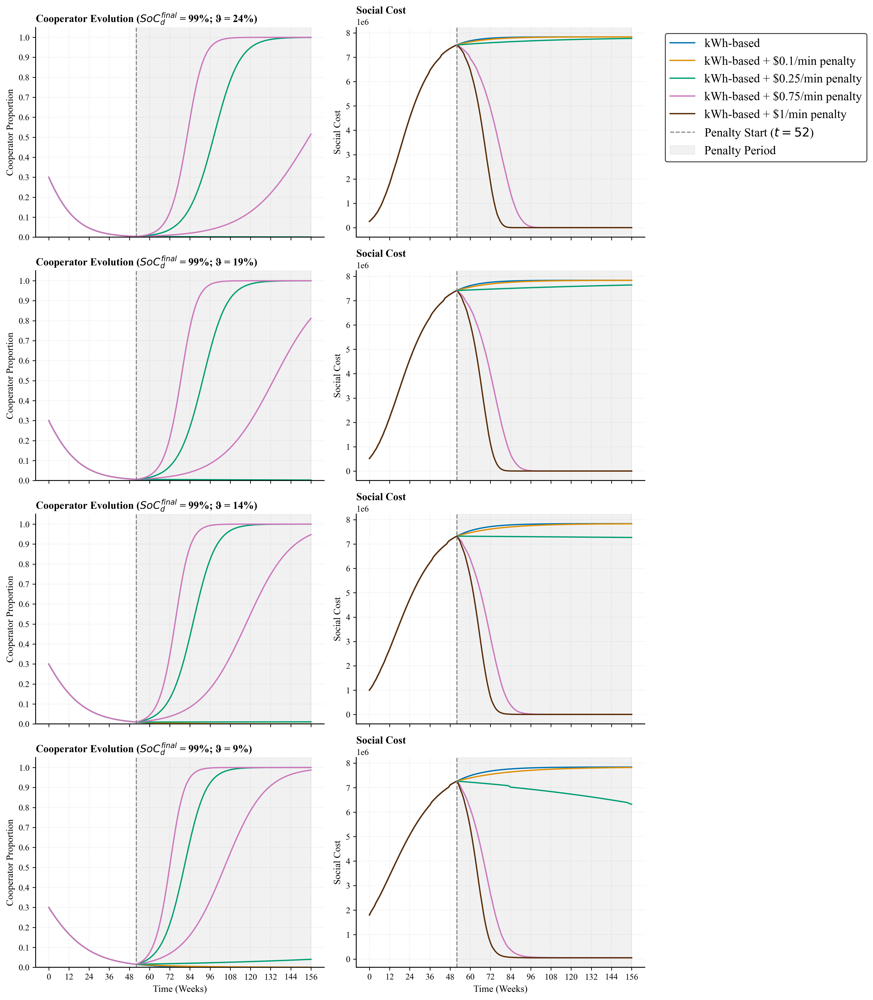

In [82]:
from collections import OrderedDict

# Set publication-quality parameters
plt.rcParams.update({
    'font.family': 'serif',
    'font.serif': ['Times New Roman'],
    'font.size': 10,
    'axes.labelsize': 11,
    'axes.titlesize': 12,
    'xtick.labelsize': 10,
    'ytick.labelsize': 10,
    'legend.fontsize': 9,
    'figure.figsize': (7, 5),
    'figure.dpi': 300,
    'savefig.dpi': 600,
    'savefig.bbox': 'tight',
    'axes.linewidth': 1.0,
    'grid.alpha': 0.3,
    'lines.linewidth': 1.5,
    'lines.markersize': 4
})

# Define color scheme (colorblind-friendly)
colors = ['#0173B2', '#DE8F05', '#029E73', '#CC78BC', "#592E0A", "#414E0D", "#FACC00", '#A7A7A7', '#CDCC5D']
linestyles = ['-', '--', '-.', ':', '-']

# Create a 4x2 grid: left column = cooperator evolution, right column = social cost
fig, axes = plt.subplots(4, 2, figsize=(14, 16), sharex='col')
keys = sorted(CCS_dict_kwh.keys())

for i, soc in enumerate(keys):
    x_track = CCS_dict_kwh[soc][0]
    net_sc = CCS_dict_kwh[soc][-1]

    # x-axes
    x_range = np.arange(t_init_evo, t_init_evo + len(x_track))
    sc_range = np.arange(t_init_evo, t_init_evo + len(net_sc))

    # Left: cooperator evolution
    axL = axes[i, 0]
    axL.plot(x_range, CCS_dict_kwh[soc][0], label=f'kWh-based', color=colors[0], linestyle=linestyles[0])
    axL.plot(x_range, CCS_dict_timepen_01[soc][0], label=f'kWh-based + $0.1/min penalty', color=colors[1], linestyle=linestyles[0])
    axL.plot(x_range, CCS_dict_timepen_025[soc][0], label=f'kWh-based + $0.25/min penalty', color=colors[2], linestyle=linestyles[0])
    axL.plot(x_range, CCS_dict_timepen_05[soc][0], label=f'kWh-based + $0.5/min penalty', color=colors[3], linestyle=linestyles[0])
    axL.plot(x_range, CCS_dict_timepen_075[soc][0], label=f'kWh-based + $0.75/min penalty', color=colors[2], linestyle=linestyles[0])
    axL.plot(x_range, CCS_dict_timepen_1[soc][0], label=f'kWh-based + $1/min penalty', color=colors[3], linestyle=linestyles[0])
    axL.set_ylim(0, 1.05)
    axL.set_ylabel('Cooperator Proportion')
    axL.set_title(f'Cooperator Evolution ($SoC_d^{{final}}$ = 99%; ϑ = {99-soc}%)', loc='left', fontweight='bold')
    axL.grid(True, alpha=0.3, linestyle='--', linewidth=0.5)
    # Add vertical dashed line at cutoff_time
    axL.axvline(x=cutoff_time, color='gray', linestyle='--', linewidth=1.2, label='Penalty Start ($t={}$)'.format(cutoff_time))
    # Shade area after cutoff_time
    axL.axvspan(cutoff_time, t_end_evo, color='lightgray', alpha=0.3, label='Penalty Period')
    # axL.legend(loc='upper right', frameon=True, edgecolor='black', fontsize=12)
    axL.spines['top'].set_visible(False)
    axL.spines['right'].set_visible(False)
    axL.set_yticks(np.arange(0, 1.1, 0.1))

    # Right: social cost
    axR = axes[i, 1]
    axR.plot(sc_range, CCS_dict_kwh[soc][-1], label=f'kWh-based', color=colors[0], linestyle=linestyles[0])
    axR.plot(sc_range, CCS_dict_timepen_01[soc][-1], label=f'kWh-based + $0.1/min penalty', color=colors[1], linestyle=linestyles[0])
    axR.plot(sc_range, CCS_dict_timepen_025[soc][-1], label=f'kWh-based + $0.25/min penalty', color=colors[2], linestyle=linestyles[0])
    axR.plot(sc_range, CCS_dict_timepen_075[soc][-1], label=f'kWh-based + $0.75/min penalty', color=colors[3], linestyle=linestyles[0])
    axR.plot(sc_range, CCS_dict_timepen_1[soc][-1], label=f'kWh-based + $1/min penalty', color=colors[4], linestyle=linestyles[0])
    axR.set_ylabel('Social Cost')
    axR.set_title(f'Social Cost', loc='left', fontweight='bold')
    axR.grid(True, alpha=0.3, linestyle='--', linewidth=0.5)
    # Add vertical dashed line at cutoff_time
    axR.axvline(x=cutoff_time, color='gray', linestyle='--', linewidth=1.2, label='Penalty Start ($t={}$)'.format(cutoff_time))
    # Shade area after cutoff_time
    axR.axvspan(cutoff_time, t_end_evo, color='lightgray', alpha=0.3, label='Penalty Period')
    # axR.legend(loc='upper left', frameon=True, edgecolor='black', fontsize=12)
    axR.spines['top'].set_visible(False)
    axR.spines['right'].set_visible(False)

    # common x ticks (evolution uses t_init_evo..t_end_evo)
    axL.set_xticks(np.arange(t_init_evo, t_end_evo+1, step=12))
    axR.set_xticks(np.arange(t_init_evo, t_end_evo+1, step=12))

    # Build unique legend from the first social-cost axis (top-right subplot)
    handles, labels = axes[0, 1].get_legend_handles_labels()
    by_label = OrderedDict(zip(labels, handles))

    # Place legend outside the first social cost subplot on the upper-right
    axes[0, 1].legend(by_label.values(), by_label.keys(),
                      loc='upper left', bbox_to_anchor=(1.05, 1.0),
                      frameon=True, edgecolor='black', fontsize=14)

    # Make room on the right so the legend is not cut off
    plt.subplots_adjust(right=0.88)

# Labels for bottom row x-axis
for ax in axes[-1, :]:
    ax.set_xlabel('Time (Weeks)')

plt.tight_layout()
plt.savefig(r"C:\Users\kenny\OneDrive - purdue.edu\Documents\Kenny's File\Transportation Literature\Fall 2024\CE 597 SET\Project\Journal Submission\Figures\Regime Resilience - 1w3y.png", format='png', dpi=700, bbox_inches='tight')
plt.show()


### SoC Optimum

##### Time based (no penalty) peak hours

In [22]:
# Global Parameters
# CCS_dict_kwh = {
#     75:[], 
#     80:[],
#     85:[],
#     90:[],
# } # sequence for each SoC target: [[x_track], [mu_avg_track], [NetSc]]

# this is for EVCS operation (minute by minute) on a single day
t_init_evcs = 0 
t_end_evcs = 1439
# this is for EVCS operation (minute by minute) on a single day
t_init_evo = 0 
t_end_evo = 52*3
dt = 1/52 # 1 week worth of behavior change

alpha = 10/60 # value of mobility ($/miles)
beta = 35/60 # value of waiting ($/minutes) -> social cost
vot = 28.16/60 # $/min -> inconvenience cost
# vot = 60/60
C = 8

x = 0.3

In [23]:
    
# soctarget_sensitivity = np.linspace(30,90,28)
soctarget_sensitivity = np.arange(21,91,1)

# SCtotal_track_wopen = []
SCtotal_track_wopen = {}
for SoCtarget in soctarget_sensitivity:
    SCtotal_track_wopen[SoCtarget] = []

for SoCtarget in soctarget_sensitivity:
    # initialization
    x = 0.3
    mu_d = (fast_charge_time(99, SoCinit, tau) + delta)**-1 # charging station's service rate if EV users being defectors (overstaying behavior)
    mu_c = (fast_charge_time(SoCtarget, SoCinit, tau))**-1 # charging station's service rate if EV users being cooperative
    mu_avg = x*mu_c + (1-x)*mu_d
    # x_track_socpen3 = [x]
    # mu_avg_track_socpen3 = [mu_avg]
    Wt = workplace_lambda_t[0] # number of EV waiting in the queue at time t -> initial value
    St = 0 # number of EV currently being serviced (fueling) at time t -> initial value
    Wt_track_socsense = [Wt]
    St_track_socsense = [St]
    SCt_track_socsense = []
    for t_operate in range(t_init_evcs, t_end_evcs):
        Wt += workplace_lambda_t[t_operate]
        lambda_st = begin_service(sigma, C, St, Wt)
        Wt -= lambda_st
        if Wt < 0:
            Wt = 0
            
        CSRt = CSR(mu_avg, St)
        
        dStdt = lambda_st-CSRt
        St += dStdt
        if St < 0:
            St = 0
            
        Twt_avg = avg_wait(Wt, lambda_st)
        Twt = total_wait(Wt, Twt_avg) 
        SCt = beta*Twt
        
        Wt_track_socsense.append(Wt)
        St_track_socsense.append(St)
        SCt_track_socsense.append(SCt)

    SCtotal_track_wopen[SoCtarget].append(sum(SCt_track_socsense*5)) # 5 weekdays in a week

    # update
    for t in range(t_init_evo,t_end_evo):
        payoff_coop,payoff_def = payoff(SoCtarget, SoCinit, alpha, 
                                        EVcap, dist_per_kwh, inconv_time, 
                                        vot, delta, tau, timebased=True,
                                        time_cost=0.35)
        
        phi = average_payoff(x, payoff_coop, payoff_def)
        dxtdt = dxdt(x, payoff_coop, phi)
        x += dt*dxtdt
        mu_avg = x*mu_c + (1-x)*mu_d

        # x_track_socpen3.append(x)
        # mu_avg_track_socpen3.append(mu_avg)

        # for SoCtarget in CCS_dict_socpen3.keys():

        Wt = workplace_lambda_t[0] # number of EV waiting in the queue at time t -> initial value
        St = 0 # number of EV currently being serviced (fueling) at time t -> initial value
        Wt_track_socsense = [Wt]
        St_track_socsense = [St]
        SCt_track_socsense = []
        for t_operate in range(t_init_evcs, t_end_evcs):
            Wt += workplace_lambda_t[t_operate]
            lambda_st = begin_service(sigma, C, St, Wt)
            Wt -= lambda_st
            if Wt < 0:
                Wt = 0
                
            CSRt = CSR(mu_avg, St)
            
            dStdt = lambda_st-CSRt
            St += dStdt
            if St < 0:
                St = 0
                
            Twt_avg = avg_wait(Wt, lambda_st)
            Twt = total_wait(Wt, Twt_avg) 
            SCt = beta*Twt
            
            Wt_track_socsense.append(Wt)
            St_track_socsense.append(St)
            SCt_track_socsense.append(SCt)

        SCtotal_track_wopen[SoCtarget].append(sum(SCt_track_socsense*5))
    SCtotal_track_wopen[SoCtarget] = sum(SCtotal_track_wopen[SoCtarget])
  
min_SCtotal = min(SCtotal_track_wopen.values())
min_SCtarget = [k for k, v in SCtotal_track_wopen.items() if v == min_SCtotal]
print('Lowest SCtotal: {} at SoC Target: {}%'.format(round(min_SCtotal, 2), min_SCtarget[0]))

Lowest SCtotal: 7621.78 at SoC Target: 52%


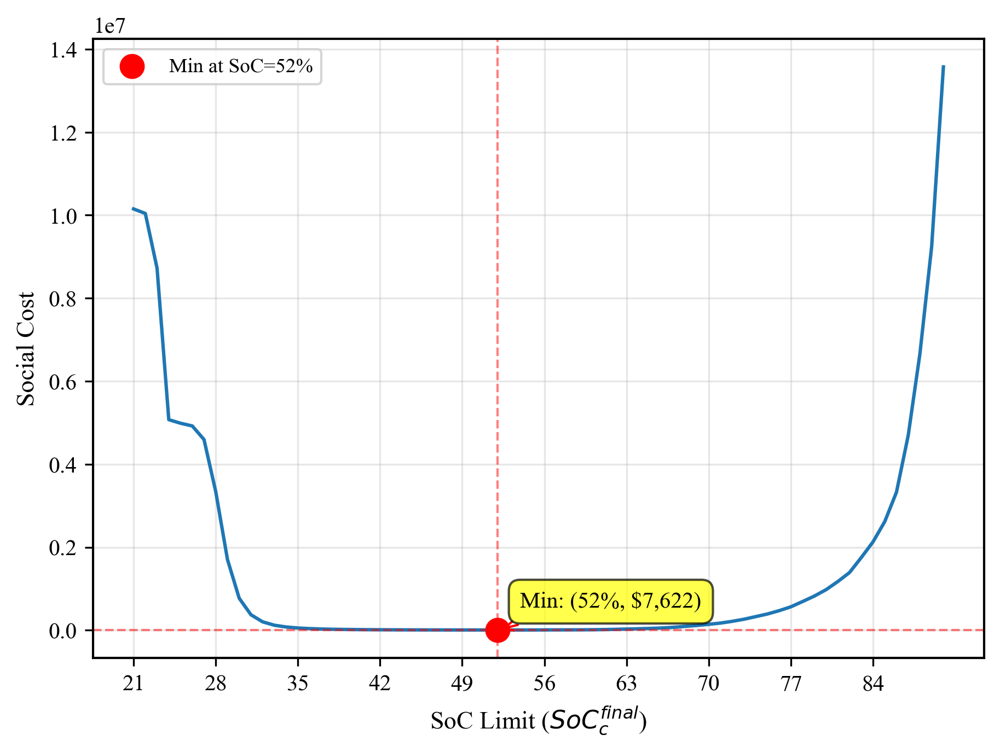

In [28]:
plt.plot(soctarget_sensitivity, list(SCtotal_track_wopen.values()))

# Highlight the minimum point
plt.scatter(min_SCtarget[0], min_SCtotal, color='red', s=100, zorder=5, label=f'Min at SoC={min_SCtarget[0]}%')
plt.axvline(x=min_SCtarget[0], color='red', linestyle='--', alpha=0.5, linewidth=1)
plt.axhline(y=min_SCtotal, color='red', linestyle='--', alpha=0.5, linewidth=1)

# Add annotation
plt.annotate(f'Min: ({min_SCtarget[0]}%, ${math.ceil(min_SCtotal):,})',
             xy=(min_SCtarget[0], min_SCtotal),
             xytext=(10, 10),
             textcoords='offset points',
             bbox=dict(boxstyle='round,pad=0.5', facecolor='yellow', alpha=0.7),
             arrowprops=dict(arrowstyle='->', connectionstyle='arc3,rad=0', color='red'))

# plt.title('Total Social Cost vs SoC Target')
plt.xticks(np.arange(21,91,7))
plt.xlabel('SoC Limit ($SoC_c^{{final}}$)')
plt.ylabel('Social Cost')
plt.legend()
plt.grid(True, alpha=0.3)
# plt.savefig(r"C:\Users\kenny\OneDrive - purdue.edu\Documents\Kenny's File\Transportation Literature\Fall 2024\CE 597 SET\Project\Journal Submission\Figures\Optimal SoC Limit - 1w3y.png", 
#             dpi = 700)
plt.savefig(r"C:\Users\wijayak\OneDrive - purdue.edu\Documents\Kenny's File\Transportation Literature\Fall 2024\CE 597 SET\Project\Journal Submission\Figures\Optimal SoC Limit - 1w3y.png", 
            dpi = 700)
plt.show()

##### Dynamic SoC Limit Policy

In [91]:
NetSc_dynamic = {
    '6:00 - 7:00': 0,
    '6:00 - 8:00': 0,
    '6:00 - 9:00': 0,
    '6:00 - 10:00': 0,
    '6:00 - 11:00': 0,
    '6:00 - 12:00': 0,
    '6:00 - 13:00': 0,
    '6:00 - 14:00': 0,
    '6:00 - 15:00': 0,
    '6:00 - 16:00': 0,
    '6:00 - 17:00': 0,
    '6:00 - 18:00': 0,
    'Entire day': 0
}

# this is for EVCS operation (minute by minute) on a single day
t_init_evcs = 0 
t_end_evcs = 1439
# this is for EVCS operation (minute by minute) on a single day
t_init_evo = 0 
t_end_evo = 52*3
dt = 1/52 # 1 day worth of behavior change

alpha = 10/60 # value of mobility ($/miles)
beta = 35/60 # value of waiting ($/minutes) -> social cost
vot = 28.16/60 # $/min -> inconvenience cost
# vot = 60/60
C = 8
mu_d = (fast_charge_time(99, SoCinit, tau) + delta)**-1 # charging station's service rate if EV users being defectors (overstaying behavior)

###### Entire day vs time-dynamic policy

In [ ]:
# Entire day policy
for t in range(t_init_evo,t_end_evo):
    mu_avg = (fast_charge_time(min_SCtarget[0], SoCinit, tau) + delta)**-1
    Wt = workplace_lambda_t[0] 
    St = 0 # number of EV currently being serviced (fueling) at time t -> initial value
    Wt_track_socsense = [Wt]
    St_track_socsense = [St]
    SCt_track_socsense = []
    for t_operate in range(t_init_evcs, t_end_evcs):
        Wt += workplace_lambda_t[t_operate]
        lambda_st = begin_service(sigma, C, St, Wt)
        Wt -= lambda_st
        if Wt < 0:
            Wt = 0
            
        CSRt = CSR(mu_avg, St)
        
        dStdt = lambda_st-CSRt
        St += dStdt
        if St < 0:
            St = 0
            
        Twt_avg = avg_wait(Wt, lambda_st)
        Twt = total_wait(Wt, Twt_avg) 
        SCt = beta*Twt
        
        Wt_track_socsense.append(Wt)
        St_track_socsense.append(St)
        SCt_track_socsense.append(SCt)

    NetSc_dynamic['Entire day'] = sum(SCt_track_socsense)

# Time-window based policy
for end_hour in range(7, 19): # 7 AM to 6 PM
    for t in range(t_init_evo,t_end_evo):
        mu_avg = (fast_charge_time(min_SCtarget[0], SoCinit, tau) + delta)**-1
        Wt = workplace_lambda_t[0] 
        St = 0 # number of EV currently being serviced (fueling) at time t -> initial value
        Wt_track_socsense = [Wt]
        St_track_socsense = [St]
        SCt_track_socsense = []
        for t_operate in range(t_init_evcs, t_end_evcs):
            if t_operate < (end_hour*60) and t_operate >= (6*60):
                Wt += workplace_lambda_t[t_operate]
                lambda_st = begin_service(sigma, C, St, Wt)
                Wt -= lambda_st
                if Wt < 0:
                    Wt = 0
                    
                CSRt = CSR(mu_avg, St)
                
                dStdt = lambda_st-CSRt
                St += dStdt
                if St < 0:
                    St = 0
                    
                Twt_avg = avg_wait(Wt, lambda_st)
                Twt = total_wait(Wt, Twt_avg) 
                SCt = beta*Twt
                
                Wt_track_socsense.append(Wt)
                St_track_socsense.append(St)
                SCt_track_socsense.append(SCt)
            else:
                Wt += workplace_lambda_t[t_operate]
                lambda_st = begin_service(sigma, C, St, Wt)
                Wt -= lambda_st
                if Wt < 0:
                    Wt = 0
                    
                CSRt = CSR(mu_d, St)
                
                dStdt = lambda_st-CSRt
                St += dStdt
                if St < 0:
                    St = 0
                    
                Twt_avg = avg_wait(Wt, lambda_st)
                Twt = total_wait(Wt, Twt_avg) 
                SCt = beta*Twt
                
                Wt_track_socsense.append(Wt)
                St_track_socsense.append(St)
                SCt_track_socsense.append(SCt)

        NetSc_dynamic[f'6:00 - {end_hour}:00'] = sum(SCt_track_socsense)

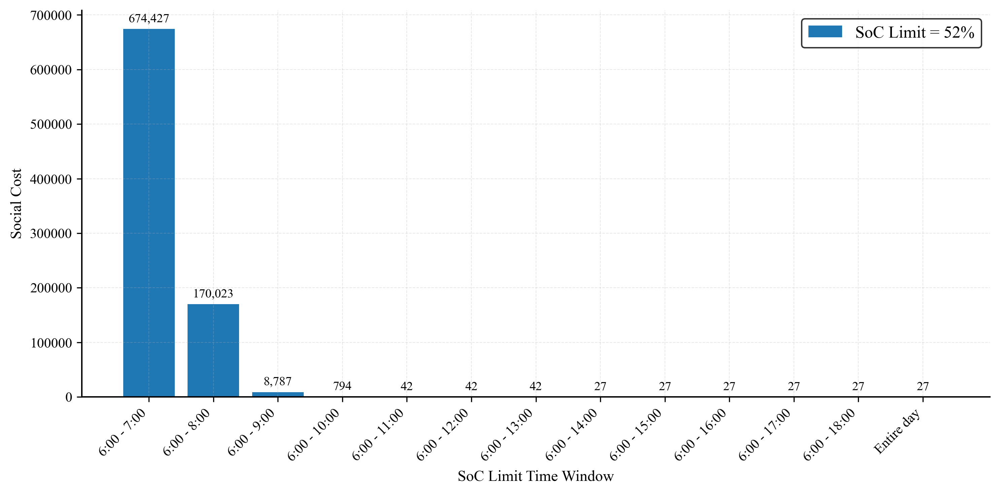

In [93]:
import math

# Set publication-quality parameters
plt.rcParams.update({
    'font.family': 'serif',
    'font.serif': ['Times New Roman'],
    'font.size': 10,
    'axes.labelsize': 11,
    'axes.titlesize': 12,
    'xtick.labelsize': 10,
    'ytick.labelsize': 10,
    'legend.fontsize': 9,
    'figure.figsize': (7, 5),
    'figure.dpi': 300,
    'savefig.dpi': 600,
    'savefig.bbox': 'tight',
    'axes.linewidth': 1.0,
    'grid.alpha': 0.3,
    'lines.linewidth': 1.5,
    'lines.markersize': 4
})

keys = list(NetSc_dynamic.keys())
values = list(NetSc_dynamic.values())
x = np.arange(len(keys))

fig, ax = plt.subplots(figsize=(10, 5))
# bar() does not accept a 'legend' keyword; use 'label' and then call legend()
bars = ax.bar(x, values, color='C0', label='SoC Limit = {}%'.format(min_SCtarget[0]))

ax.legend(loc='best', frameon=True, edgecolor='black', fontsize=12)
ax.set_xticks(x)
ax.set_xticklabels(keys, rotation=45, ha='right')
ax.set_ylabel('Social Cost')
ax.set_xlabel('SoC Limit Time Window')
# ax.set_title('Dynamic SoC Limit Policy')

ax.grid(True, alpha=0.3, linestyle='--', linewidth=0.5)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Annotate each bar with its value
for rect, val in zip(bars, values):
    height = rect.get_height()
    ax.annotate(f'{math.ceil(val):,}',
                xy=(rect.get_x() + rect.get_width() / 2, height),
                xytext=(0, 3), textcoords='offset points',
                ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.savefig(r"C:\Users\kenny\OneDrive - purdue.edu\Documents\Kenny's File\Transportation Literature\Fall 2024\CE 597 SET\Project\Journal Submission\Figures\Dynamic SoC Policy - 1w3y.png", format='png', dpi=700, bbox_inches='tight')
plt.show()


##### SoC Optimum Sensitivity Analysis

##### Tau vs C

In [ ]:
# Global Parameters
# CCS_dict_kwh = {
#     75:[], 
#     80:[],
#     85:[],
#     90:[],
# } # sequence for each SoC target: [[x_track], [mu_avg_track], [NetSc]]

# this is for EVCS operation (minute by minute) on a single day
t_init_evcs = 0 
t_end_evcs = 1439
# this is for EVCS operation (minute by minute) on a single day
t_init_evo = 0 
t_end_evo = 365
dt = 1/365 # 1 day worth of behavior change

alpha = 10/60 # value of mobility ($/miles)
beta = 35/60 # value of waiting ($/minutes) -> social cost
vot = 28.16/60 # $/min -> inconvenience cost
# vot = 60/60
C = 8

cutoff_time = 360 # days
x = 0.3

In [28]:
# Define ranges for tau and C
tau_range = np.linspace(10, 80, 8)  # charging speed
C_range = np.linspace(3, 12, 9)  # number of chargers

# Prepare grid to store optimum SoCtarget for each (tau, C)
optimum_soc_grid = np.zeros((len(C_range), len(tau_range)))
min_SC_grid = np.zeros((len(C_range), len(tau_range)))

# soctarget_sensitivity = np.linspace(30,90,28)
soctarget_sensitivity = np.arange(21,91,1)

for i, tau_val in enumerate(tau_range):
    for j, C_val in enumerate(C_range):
        # SCtotal_track_wopen = []
        SCtotal_track_wopen = {}
        for SoCtarget in soctarget_sensitivity:
            SCtotal_track_wopen[SoCtarget] = []

        for SoCtarget in soctarget_sensitivity:
            # initialization
            x = 0.3
            mu_d = (fast_charge_time(99, SoCinit, tau) + delta)**-1 # charging station's service rate if EV users being defectors (overstaying behavior)
            mu_c = (fast_charge_time(SoCtarget, SoCinit, tau))**-1 # charging station's service rate if EV users being cooperative
            mu_avg = x*mu_c + (1-x)*mu_d
            Wt = workplace_lambda_t[0] # number of EV waiting in the queue at time t -> initial value
            St = 0 # number of EV currently being serviced (fueling) at time t -> initial value
            Wt_track_socsense = [Wt]
            St_track_socsense = [St]
            SCt_track_socsense = []
            for t_operate in range(t_init_evcs, t_end_evcs):
                Wt += workplace_lambda_t[t_operate]
                lambda_st = begin_service(sigma, C, St, Wt)
                Wt -= lambda_st
                if Wt < 0:
                    Wt = 0
                    
                CSRt = CSR(mu_avg, St)
                
                dStdt = lambda_st-CSRt
                St += dStdt
                if St < 0:
                    St = 0
                    
                Twt_avg = avg_wait(Wt, lambda_st)
                Twt = total_wait(Wt, Twt_avg) 
                SCt = beta*Twt
                
                Wt_track_socsense.append(Wt)
                St_track_socsense.append(St)
                SCt_track_socsense.append(SCt)

            SCtotal_track_wopen[SoCtarget].append(sum(SCt_track_socsense))

            # update
            for t in range(t_init_evo,t_end_evo):
                payoff_coop,payoff_def = payoff(SoCtarget, SoCinit, alpha, 
                                                EVcap, dist_per_kwh, inconv_time, 
                                                vot, delta, tau, timebased=True,
                                                time_cost=0.35)
                
                phi = average_payoff(x, payoff_coop, payoff_def)
                dxtdt = dxdt(x, payoff_coop, phi)
                x += dt*dxtdt
                mu_avg = x*mu_c + (1-x)*mu_d
                Wt = workplace_lambda_t[0] # number of EV waiting in the queue at time t -> initial value
                St = 0 # number of EV currently being serviced (fueling) at time t -> initial value
                Wt_track_socsense = [Wt]
                St_track_socsense = [St]
                SCt_track_socsense = []
                for t_operate in range(t_init_evcs, t_end_evcs):
                    Wt += workplace_lambda_t[t_operate]
                    lambda_st = begin_service(sigma, C, St, Wt)
                    Wt -= lambda_st
                    if Wt < 0:
                        Wt = 0
                        
                    CSRt = CSR(mu_avg, St)
                    
                    dStdt = lambda_st-CSRt
                    St += dStdt
                    if St < 0:
                        St = 0
                        
                    Twt_avg = avg_wait(Wt, lambda_st)
                    Twt = total_wait(Wt, Twt_avg) 
                    SCt = beta*Twt
                    
                    Wt_track_socsense.append(Wt)
                    St_track_socsense.append(St)
                    SCt_track_socsense.append(SCt)

                SCtotal_track_wopen[SoCtarget].append(sum(SCt_track_socsense))
            SCtotal_track_wopen[SoCtarget] = sum(SCtotal_track_wopen[SoCtarget])
        
        min_SCtotal = min(SCtotal_track_wopen.values())
        min_SCtarget = [k for k, v in SCtotal_track_wopen.items() if v == min_SCtotal][0]
        optimum_soc_grid[j, i] = min_SCtarget
        min_SC_grid[j, i] = min_SCtotal

plt.figure(figsize=(10, 7))
im = plt.imshow(optimum_soc_grid, aspect='auto', origin='lower',
                extent=[tau_range[0], tau_range[-1], C_range[0], C_range[-1]],
                cmap='viridis')
plt.colorbar(im, label='Optimum SoC Target (%)')
plt.xlabel('Tau (Charging Speed)')
plt.ylabel('C (Number of Chargers)')
plt.title('Optimum SoC Target Sensitivity (Tau vs C)')
plt.show()

KeyboardInterrupt: 

In [ ]:
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Create meshgrid for tau and C
tau_mesh, C_mesh = np.meshgrid(tau_range, C_range)

# Plot surface
surf = ax.plot_surface(tau_mesh, C_mesh, optimum_soc_grid, cmap='viridis', edgecolor='none')

ax.set_xlabel('Tau (Charging Speed)')
ax.set_ylabel('C (Number of Chargers)')
ax.set_zlabel('Optimum SoC Target (%)')
ax.set_title('3D Sensitivity Analysis of Optimum SoC Target')
fig.colorbar(surf, ax=ax, shrink=0.5, aspect=10, label='Optimum SoC Target (%)')
# plt.savefig(r"C:\Users\kenny\OneDrive - purdue.edu\Documents\Kenny's File\Transportation Literature\Fall 2024\CE 597 SET\Project\Journal Submission\Figures\SoC Limit tau C Sensitivity.png", format='png', dpi=700, bbox_inches='tight')
plt.savefig(r"C:\Users\wijayak\OneDrive - purdue.edu\Documents\Kenny's File\Transportation Literature\Fall 2024\CE 597 SET\Project\Journal Submission\Figures\SoC Limit tau C Sensitivity.png", format='png', dpi=700, bbox_inches='tight')

plt.show()

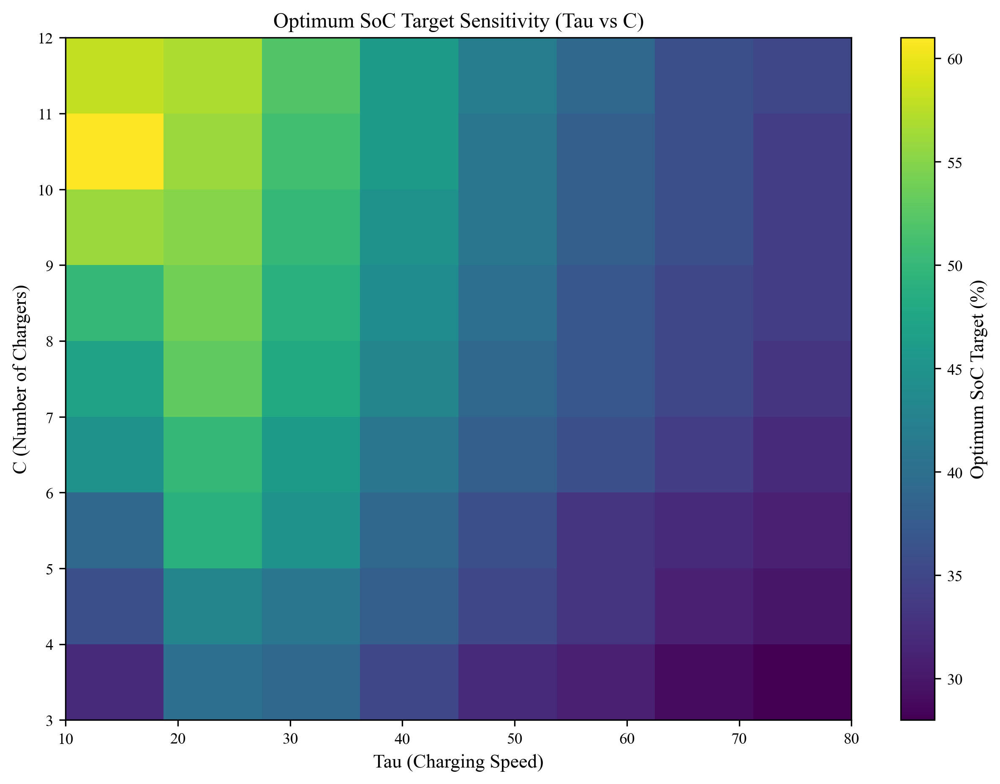

In [95]:
# Define ranges for tau and C
tau_range = np.linspace(10, 80, 8)  # charging speed
C_range = np.linspace(3, 12, 9)  # number of chargers

# Prepare grid to store optimum SoCtarget for each (tau, C)
optimum_soc_grid = np.zeros((len(C_range), len(tau_range)))
min_SC_grid = np.zeros((len(C_range), len(tau_range)))

for i, tau_val in enumerate(tau_range):
    for j, C_val in enumerate(C_range):
        SCtotal_track = {}
        for soc in soctarget_sensitivity:
            Wt = workplace_lambda_t[t_init-1]
            St = 0
            x = 0.3
            mu_c = (fast_charge_time(soc, SoCinit, tau_val))**-1
            mu_d = (fast_charge_time(99, SoCinit, tau_val) + delta)**-1
            mu_avg = x*mu_c + (1-x)*mu_d
            SCt_track = []
            for t in range(t_init, t_end+1):
                Wt += workplace_lambda_t[t]
                lambda_st = begin_service(sigma, C_val, St, Wt)
                Wt -= lambda_st
                if Wt < 0: Wt = 0
                CSRt = CSR(mu_avg, St)
                dStdt = lambda_st-CSRt
                St += dStdt
                if St < 0: St = 0
                Twt_avg = avg_wait(Wt, lambda_st)
                Twt = total_wait(Wt, Twt_avg)
                SCt = beta*Twt
                SCt_track.append(SCt)
                payoff_coop, payoff_def = payoff(soc, SoCinit, alpha, EVcap, dist_per_kwh, inconv_time, vot, delta, tau_val, timebased=True, time_cost=0.35)
                phi = average_payoff(x, payoff_coop, payoff_def)
                dxtdt = dxdt(x, payoff_coop, phi)
                x += dt*dxtdt
                mu_avg = x*mu_c + (1-x)*mu_d
            SCtotal_track[soc] = sum(SCt_track)
        min_SC = min(SCtotal_track.values())
        min_soc = [k for k, v in SCtotal_track.items() if v == min_SC][0]
        optimum_soc_grid[j, i] = min_soc
        min_SC_grid[j, i] = min_SC

plt.figure(figsize=(10, 7))
im = plt.imshow(optimum_soc_grid, aspect='auto', origin='lower',
                extent=[tau_range[0], tau_range[-1], C_range[0], C_range[-1]],
                cmap='viridis')
plt.colorbar(im, label='Optimum SoC Target (%)')
plt.xlabel('Tau (Charging Speed)')
plt.ylabel('C (Number of Chargers)')
plt.title('Optimum SoC Target Sensitivity (Tau vs C)')
plt.show()

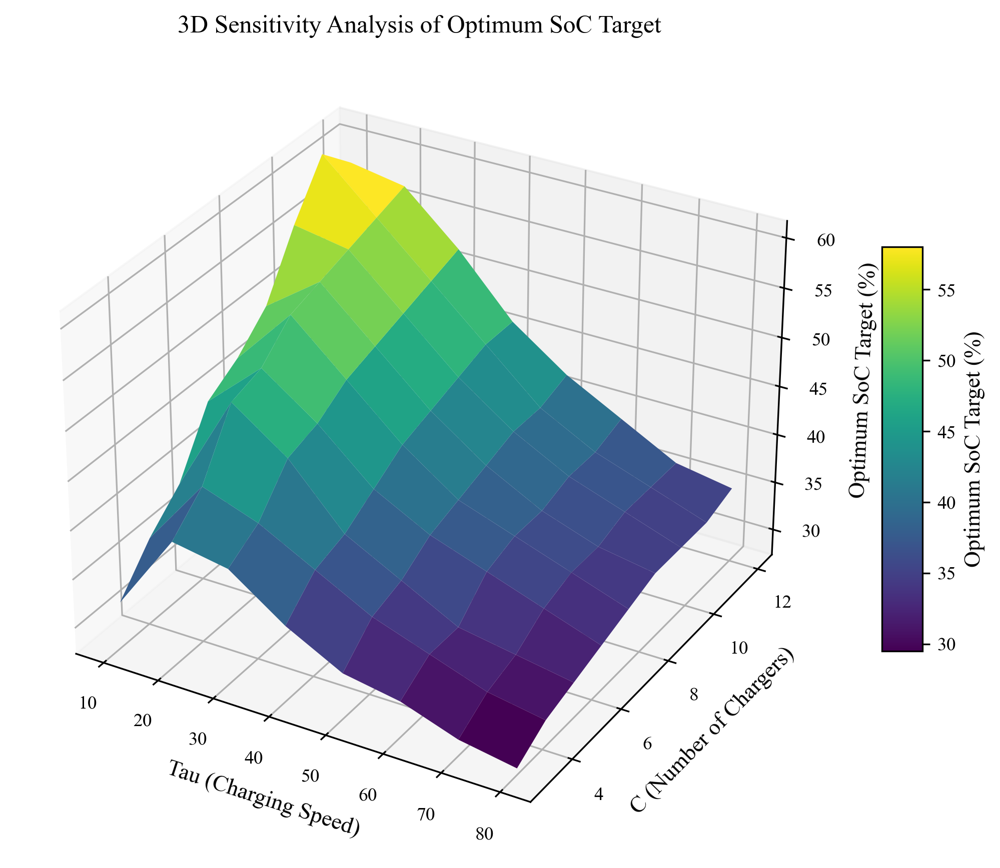

In [96]:
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Create meshgrid for tau and C
tau_mesh, C_mesh = np.meshgrid(tau_range, C_range)

# Plot surface
surf = ax.plot_surface(tau_mesh, C_mesh, optimum_soc_grid, cmap='viridis', edgecolor='none')

ax.set_xlabel('Tau (Charging Speed)')
ax.set_ylabel('C (Number of Chargers)')
ax.set_zlabel('Optimum SoC Target (%)')
ax.set_title('3D Sensitivity Analysis of Optimum SoC Target')
fig.colorbar(surf, ax=ax, shrink=0.5, aspect=10, label='Optimum SoC Target (%)')
plt.show()

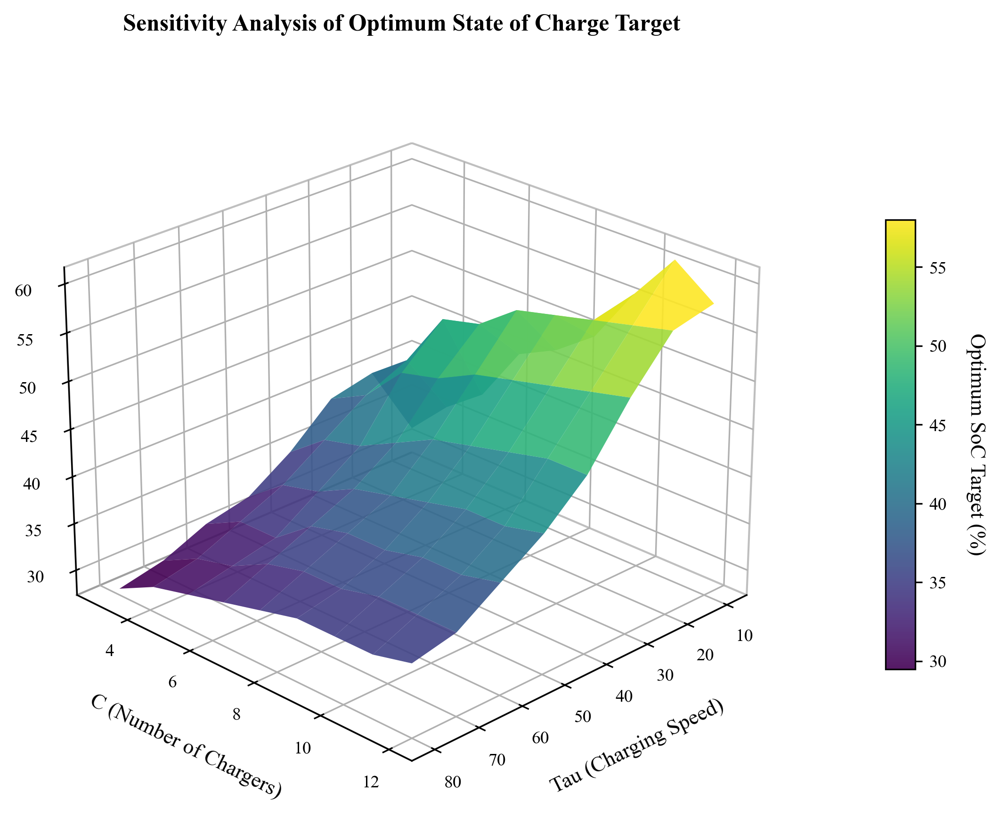

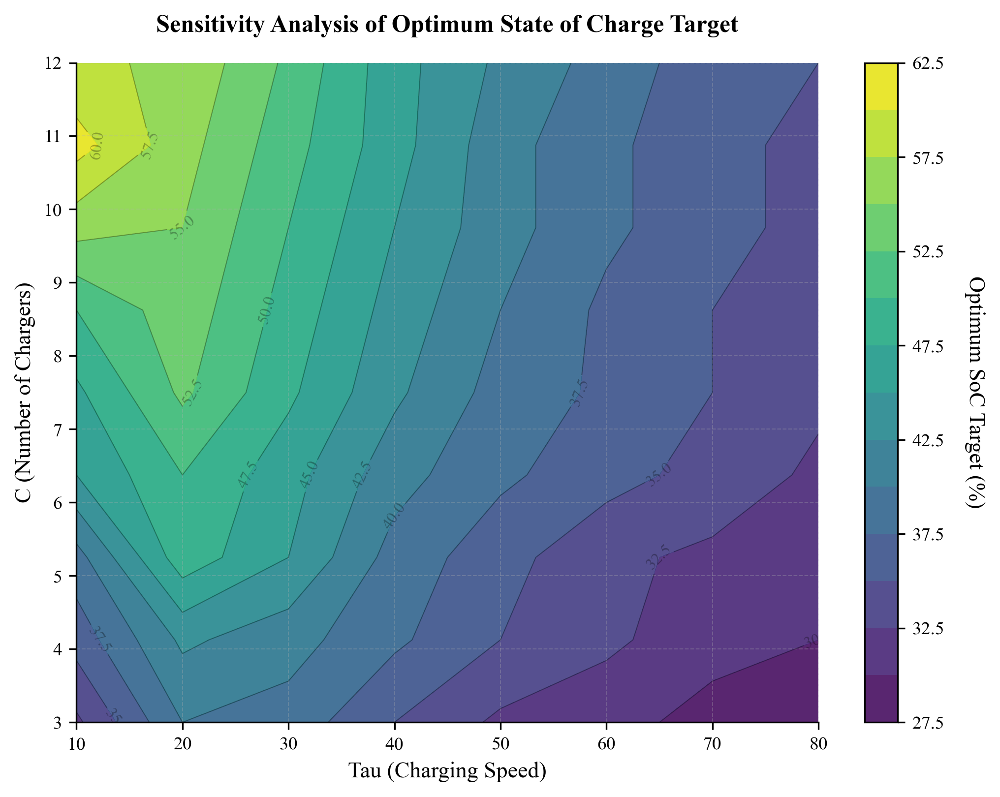

C:\Users\kenny\AppData\Local\Temp\ipykernel_9564\1246880924.py:154: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


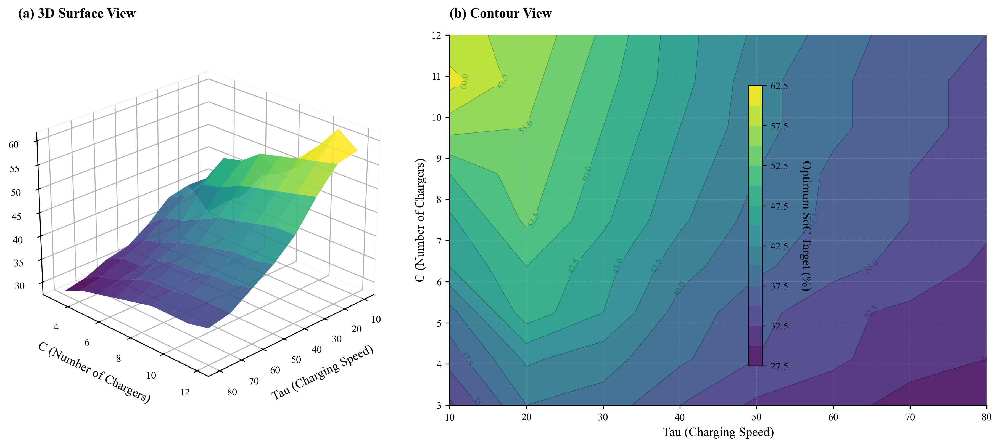

In [ ]:
from mpl_toolkits.mplot3d import Axes3D

# Set publication-quality parameters
plt.rcParams.update({
    'font.family': 'serif',
    'font.serif': ['Times New Roman'],
    'font.size': 10,
    'axes.labelsize': 11,
    'axes.titlesize': 12,
    'xtick.labelsize': 9,
    'ytick.labelsize': 9,
    'legend.fontsize': 9,
    'figure.dpi': 300,
    'savefig.dpi': 600,
    'savefig.bbox': 'tight',
    'axes.linewidth': 0.8,
})

# Create figure with proper size for journals
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

# Create meshgrid for tau and C
tau_mesh, C_mesh = np.meshgrid(tau_range, C_range)

# Plot surface with professional colormap
# Options: 'viridis', 'plasma', 'inferno', 'RdYlBu_r', 'coolwarm'
surf = ax.plot_surface(tau_mesh, C_mesh, optimum_soc_grid, 
                       cmap='viridis',  # Professional, colorblind-friendly
                       edgecolor='none',
                       alpha=0.9,  # Slight transparency for depth
                       antialiased=True,
                       linewidth=0)

# Set labels with proper formatting
ax.set_xlabel('Tau (Charging Speed)', fontweight='normal', labelpad=8)
ax.set_ylabel('C (Number of Chargers)', fontweight='normal', labelpad=8)
ax.set_zlabel('Optimum SoC Target (%)', fontweight='normal', labelpad=8)

# Title
ax.set_title('Sensitivity Analysis of Optimum State of Charge Target', 
             fontweight='bold', pad=20)

# Adjust viewing angle for better perspective
ax.view_init(elev=25, azim=45)  # Elevation and azimuth angles

# Add colorbar with proper formatting
cbar = fig.colorbar(surf, ax=ax, shrink=0.6, aspect=15, pad=0.1)
cbar.set_label('Optimum SoC Target (%)', rotation=270, labelpad=20, fontweight='normal')
cbar.ax.tick_params(labelsize=9)

# Set tick parameters for cleaner look
ax.tick_params(axis='x', which='major', pad=2)
ax.tick_params(axis='y', which='major', pad=2)
ax.tick_params(axis='z', which='major', pad=4)

# Add grid with subtle styling
ax.grid(True, alpha=0.3, linestyle='--', linewidth=0.5)

# Set pane colors for cleaner background
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Set pane edge colors
ax.xaxis.pane.set_edgecolor('gray')
ax.yaxis.pane.set_edgecolor('gray')
ax.zaxis.pane.set_edgecolor('gray')

plt.tight_layout()
# plt.savefig('3d_sensitivity_analysis.pdf', format='pdf', dpi=600, bbox_inches='tight')
# plt.savefig('3d_sensitivity_analysis.png', format='png', dpi=600, bbox_inches='tight')
plt.savefig('C:\\Users\\kenny\\OneDrive - purdue.edu\\Documents\\Kenny\'s File\\Transportation Literature\\Fall 2024\\CE 597 SET\\Project\\Journal Submission\\Figures\\SoC Limit tau C Sensitivity.png', format='png', dpi=700, bbox_inches='tight')
plt.show()


# Alternative: Contour plot (often preferred in journals for clarity)
fig2, ax2 = plt.subplots(figsize=(7, 5.5))

# Create filled contour plot
levels = 15  # Number of contour levels
contourf = ax2.contourf(tau_mesh, C_mesh, optimum_soc_grid, 
                        levels=levels, cmap='viridis', alpha=0.9)

# Add contour lines for better readability
contour_lines = ax2.contour(tau_mesh, C_mesh, optimum_soc_grid, 
                            levels=levels, colors='black', 
                            linewidths=0.5, alpha=0.3)

# Add contour labels
ax2.clabel(contour_lines, inline=True, fontsize=8, fmt='%0.1f')

# Labels and title
ax2.set_xlabel('Tau (Charging Speed)', fontweight='normal')
ax2.set_ylabel('C (Number of Chargers)', fontweight='normal')
ax2.set_title('Sensitivity Analysis of Optimum State of Charge Target', 
              fontweight='bold', pad=15)

# Add colorbar
cbar2 = plt.colorbar(contourf, ax=ax2, aspect=20)
cbar2.set_label('Optimum SoC Target (%)', rotation=270, labelpad=20, fontweight='normal')
cbar2.ax.tick_params(labelsize=9)

# Grid
ax2.grid(True, alpha=0.3, linestyle='--', linewidth=0.5)

# Remove top and right spines
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)

plt.tight_layout()
# plt.savefig('contour_sensitivity_analysis.pdf', format='pdf', dpi=600, bbox_inches='tight')
# plt.savefig('contour_sensitivity_analysis.png', format='png', dpi=600, bbox_inches='tight')
plt.show()


# Alternative: Combined view with 3D and contour side by side
fig3 = plt.figure(figsize=(14, 5.5))

# 3D subplot
ax3_1 = fig3.add_subplot(121, projection='3d')
surf3 = ax3_1.plot_surface(tau_mesh, C_mesh, optimum_soc_grid, 
                           cmap='viridis', edgecolor='none', 
                           alpha=0.9, antialiased=True)
ax3_1.set_xlabel('Tau (Charging Speed)', labelpad=6)
ax3_1.set_ylabel('C (Number of Chargers)', labelpad=6)
ax3_1.set_zlabel('Optimum SoC (%)', labelpad=6)
ax3_1.set_title('(a) 3D Surface View', fontweight='bold', loc='left', pad=15)
ax3_1.view_init(elev=25, azim=45)
ax3_1.grid(True, alpha=0.3, linestyle='--', linewidth=0.5)
ax3_1.xaxis.pane.fill = False
ax3_1.yaxis.pane.fill = False
ax3_1.zaxis.pane.fill = False

# Contour subplot
ax3_2 = fig3.add_subplot(122)
contourf3 = ax3_2.contourf(tau_mesh, C_mesh, optimum_soc_grid, 
                           levels=15, cmap='viridis', alpha=0.9)
contour_lines3 = ax3_2.contour(tau_mesh, C_mesh, optimum_soc_grid, 
                               levels=15, colors='black', linewidths=0.5, alpha=0.3)
ax3_2.clabel(contour_lines3, inline=True, fontsize=8, fmt='%0.1f')
ax3_2.set_xlabel('Tau (Charging Speed)')
ax3_2.set_ylabel('C (Number of Chargers)')
ax3_2.set_title('(b) Contour View', fontweight='bold', loc='left', pad=15)
ax3_2.grid(True, alpha=0.3, linestyle='--', linewidth=0.5)
ax3_2.spines['top'].set_visible(False)
ax3_2.spines['right'].set_visible(False)

# Add shared colorbar
cbar3 = fig3.colorbar(contourf3, ax=[ax3_1, ax3_2], 
                      aspect=20, pad=0.02, shrink=0.8)
cbar3.set_label('Optimum SoC Target (%)', rotation=270, labelpad=20)

plt.tight_layout()
# plt.savefig('combined_sensitivity_analysis.pdf', format='pdf', dpi=600, bbox_inches='tight')
# plt.savefig('combined_sensitivity_analysis.png', format='png', dpi=600, bbox_inches='tight')
plt.show()